# Fillna = 0

In [18]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 30,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced',
    'model_type': 'Inception'
}

In [1]:
import os
import re
import yaml

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


Starting Experiment


/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


NameError: name 'config' is not defined

## Summary

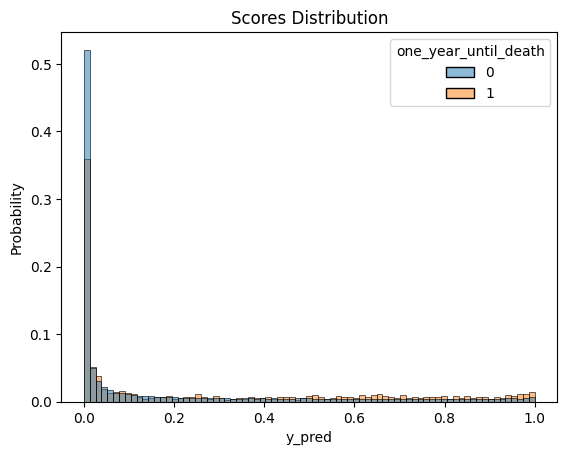

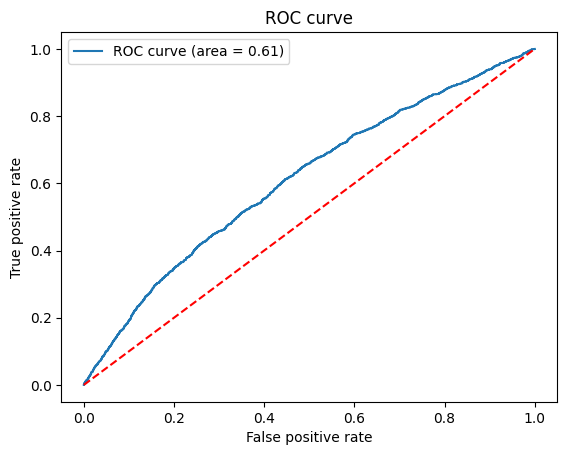

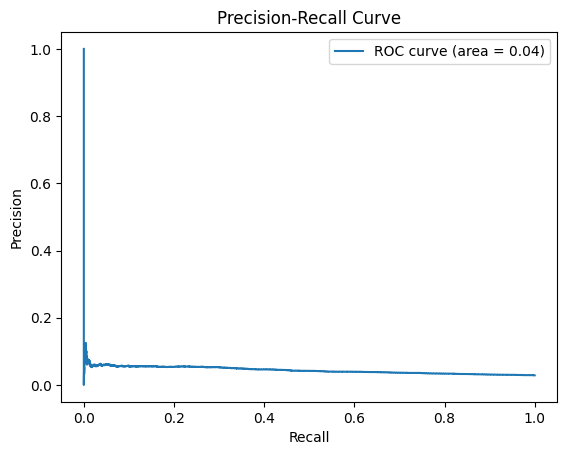

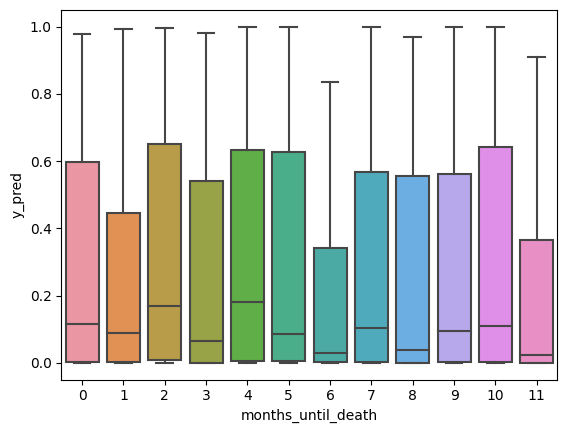

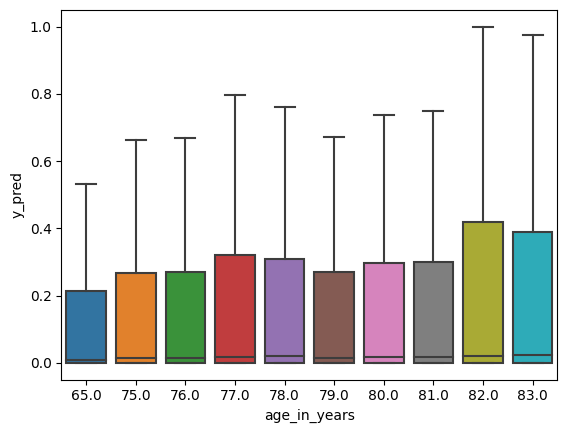

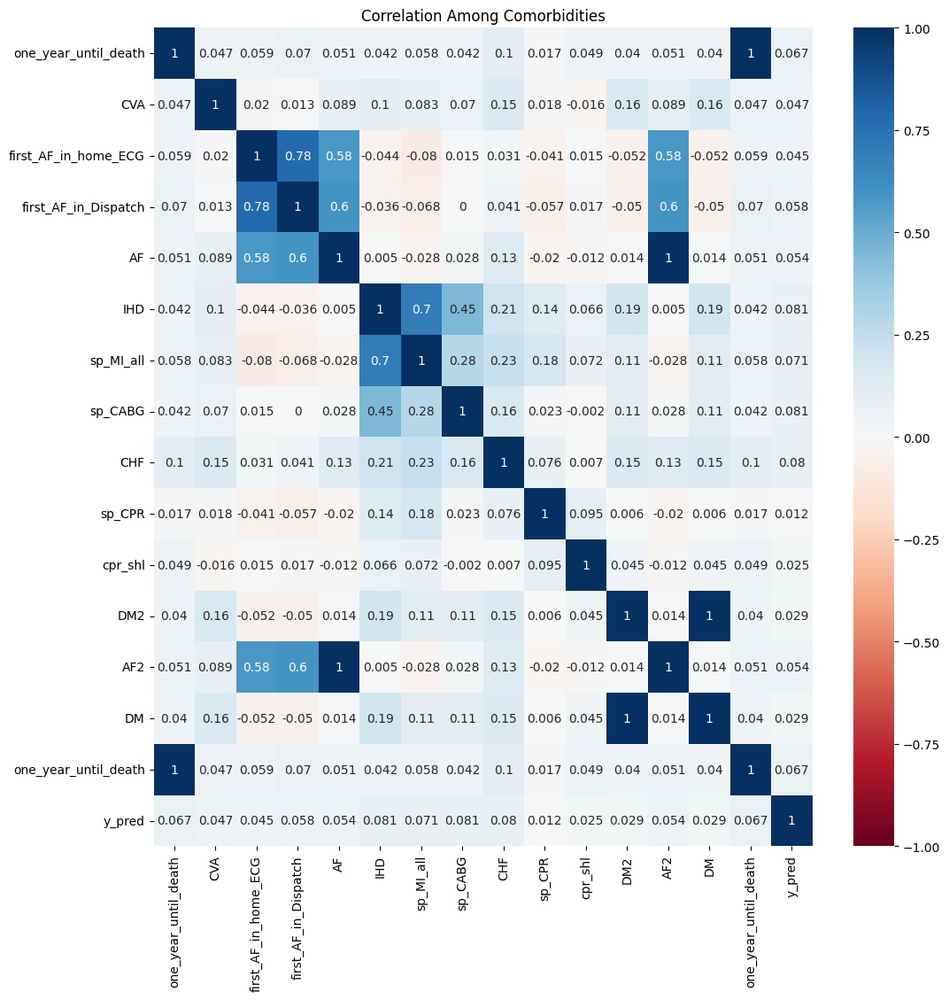

In [20]:
from utils.plots import *

# load model
model = DownstreamInception()
model.load_state_dict(torch.load('./models/3.0-inception-bs128-balanced.pt'))

# load data
data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
data = data[data['sample'] == 'test'].reset_index(drop=True)
data['y_pred'] = predict(data['reading'], model, data)

post_reg_analysis(data, 'one_year_until_death', 'y_pred')

# Fillna = -1

Starting Experiment


training using device: mps


The model has 651,257 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(12, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

Within epoch loss (validation) 0.67574: 100%|██████████| 416/416 [01:10<00:00,  5.87it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.41211608 0.18815467 0.52717048 0.36175361 0.6364783 ]
Lengths 53248 53248


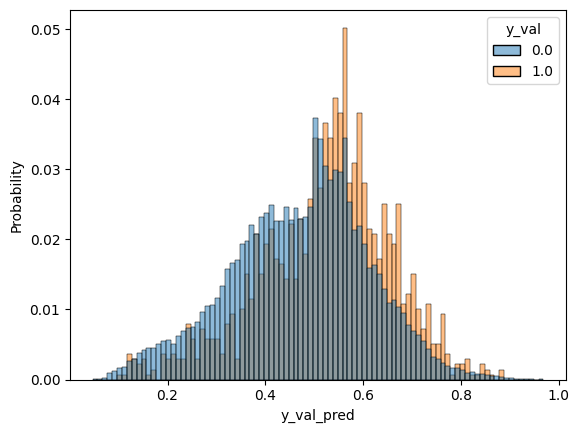

---------------------------------------------
Epoch: 01 | Time: 19m 16s
	Train Loss: 0.687
	 Val. Loss: 0.676
	 Best Val. Loss: 0.676
---------------------------------------------


Within epoch loss (validation) 0.61565: 100%|██████████| 416/416 [01:13<00:00,  5.62it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.37665918 0.03272342 0.21920846 0.426081   0.15170386]
Lengths 53248 53248


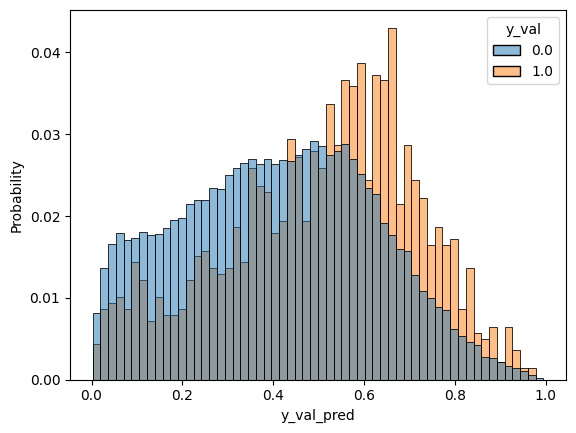

---------------------------------------------
Epoch: 02 | Time: 22m 29s
	Train Loss: 0.614
	 Val. Loss: 0.616
	 Best Val. Loss: 0.616
---------------------------------------------


Within epoch loss (validation) 0.51437: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.08144407 0.00255932 0.06816714 0.10150605 0.01493713]
Lengths 53248 53248


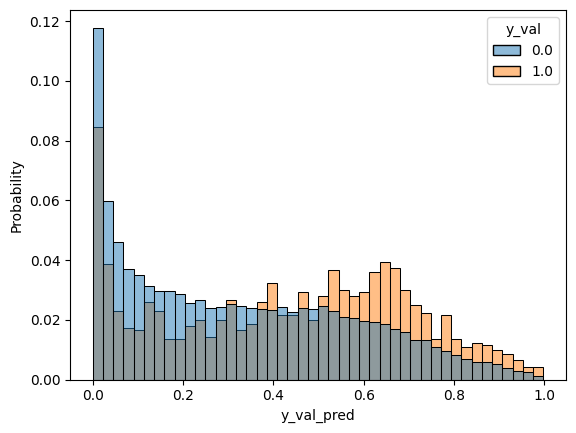

---------------------------------------------
Epoch: 03 | Time: 22m 18s
	Train Loss: 0.536
	 Val. Loss: 0.514
	 Best Val. Loss: 0.514
---------------------------------------------


Within epoch loss (validation) 0.50525: 100%|██████████| 416/416 [00:58<00:00,  7.10it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.01568384 0.00039237 0.0278958  0.00908378 0.01077682]
Lengths 53248 53248


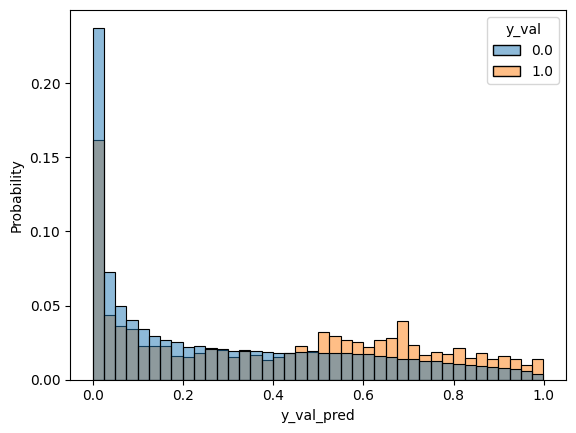

---------------------------------------------
Epoch: 04 | Time: 21m 41s
	Train Loss: 0.449
	 Val. Loss: 0.505
	 Best Val. Loss: 0.505
---------------------------------------------


Within epoch loss (validation) 0.50673: 100%|██████████| 416/416 [01:01<00:00,  6.74it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.0740675  0.00035045 0.04472212 0.02936025 0.00295265]
Lengths 53248 53248


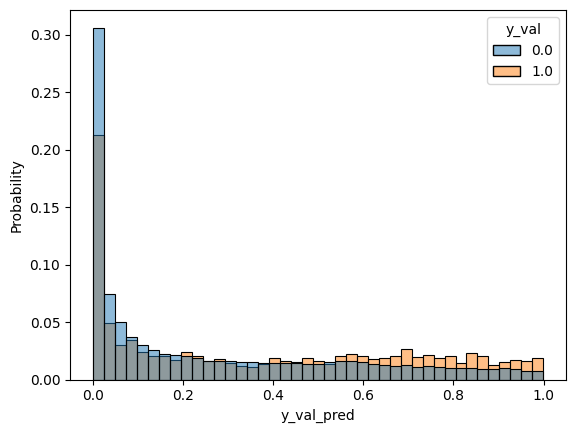

---------------------------------------------
Epoch: 05 | Time: 21m 36s
	Train Loss: 0.381
	 Val. Loss: 0.507
	 Best Val. Loss: 0.505
---------------------------------------------


Within epoch loss (validation) 0.45504: 100%|██████████| 416/416 [01:03<00:00,  6.58it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.05082722 0.00103046 0.03376128 0.20412603 0.0084351 ]
Lengths 53248 53248


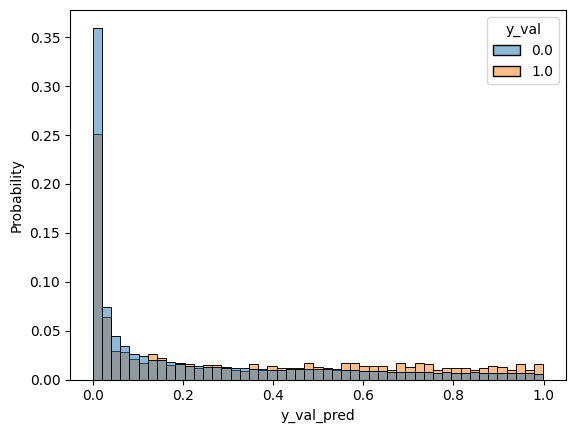

---------------------------------------------
Epoch: 06 | Time: 21m 36s
	Train Loss: 0.331
	 Val. Loss: 0.455
	 Best Val. Loss: 0.455
---------------------------------------------


In [21]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': -1,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1',
    'model_type': 'Inception'
}

import os

# run
print('Starting Experiment')
trainer(**config)


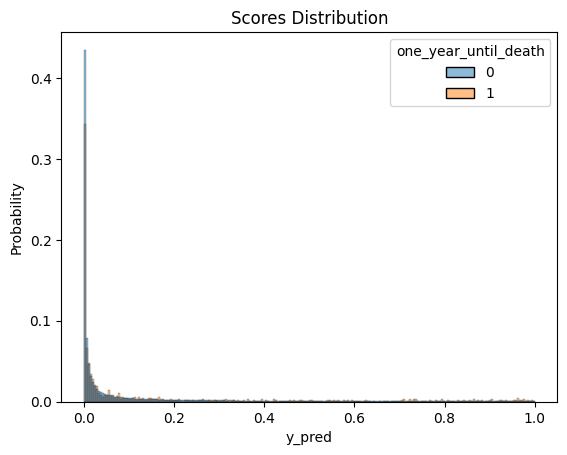

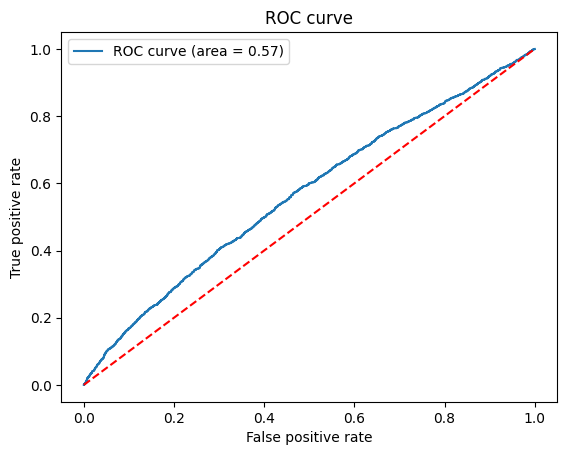

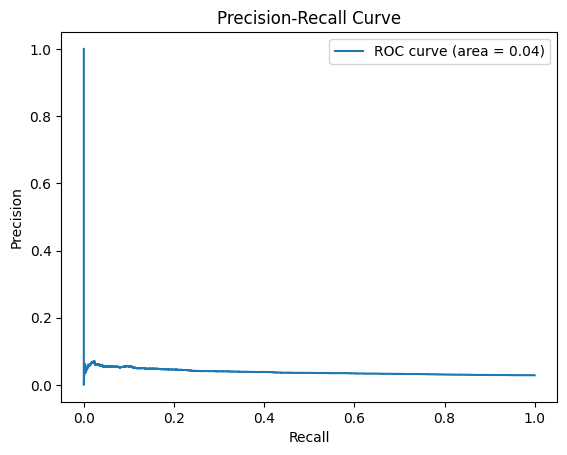

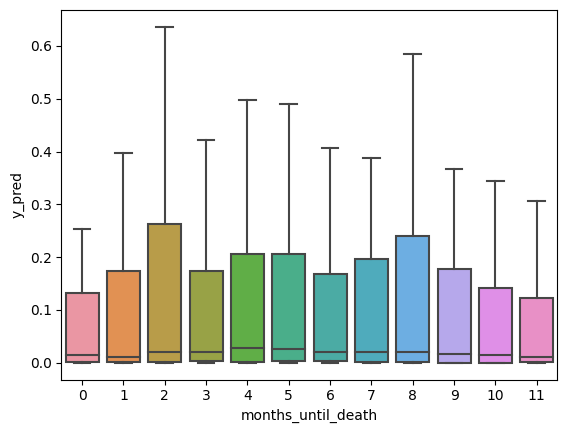

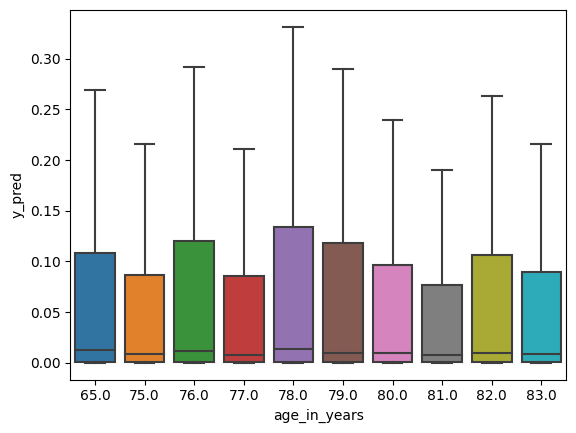

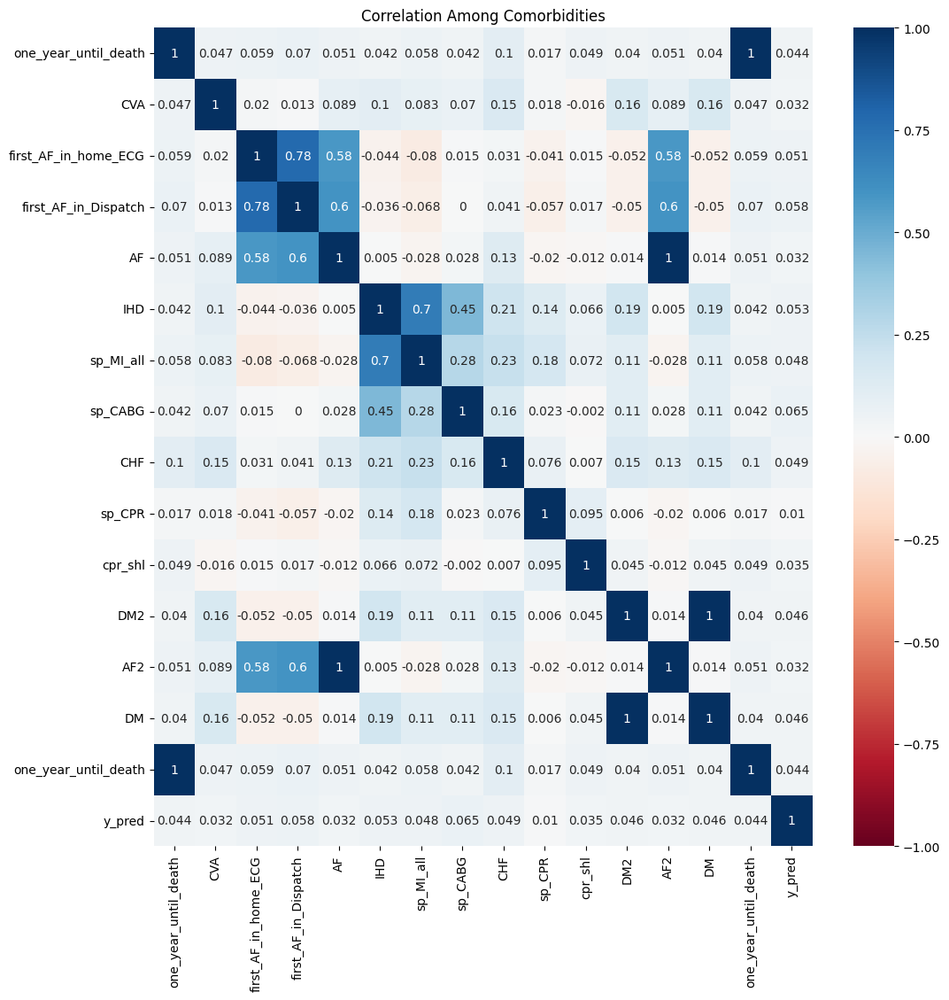

In [22]:
from utils.plots import *

# load model
model = DownstreamInception()
model.load_state_dict(torch.load('./models/3.0-inception-bs128-balanced-fillna-1.pt'))

# load data
data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
data = data[data['sample'] == 'test'].reset_index(drop=True)
data['y_pred'] = predict(data['reading'], model, data)

post_reg_analysis(data, 'one_year_until_death', 'y_pred')

# At least 5 Leads

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Starting Experiment


training using device: mps


The model has 651,257 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(12, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

Within epoch loss (validation) 0.57662: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.34762615 0.08504192 0.2031724  0.13891219 0.36063933]
Lengths 53248 53248


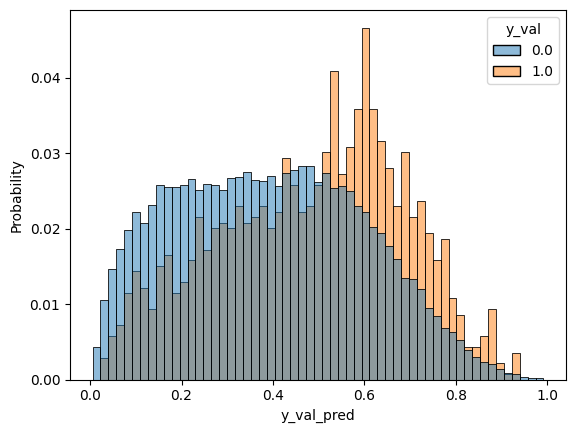

---------------------------------------------
Epoch: 01 | Time: 18m 6s
	Train Loss: 0.651
	 Val. Loss: 0.577
	 Best Val. Loss: 0.577
---------------------------------------------


Within epoch loss (validation) 0.49752: 100%|██████████| 416/416 [01:01<00:00,  6.75it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.01216709 0.00114407 0.0719392  0.05163573 0.03383958]
Lengths 53248 53248


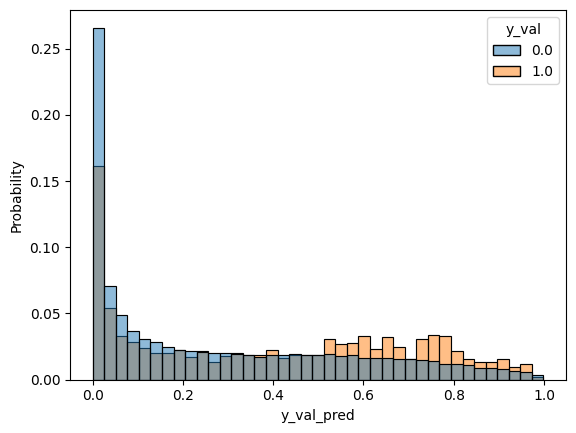

---------------------------------------------
Epoch: 02 | Time: 20m 24s
	Train Loss: 0.495
	 Val. Loss: 0.498
	 Best Val. Loss: 0.498
---------------------------------------------


Within epoch loss (validation) 0.43309: 100%|██████████| 416/416 [00:58<00:00,  7.09it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [8.03213194e-03 1.13426686e-05 7.43588246e-03 1.05104846e-04
 8.06294120e-05]
Lengths 53248 53248


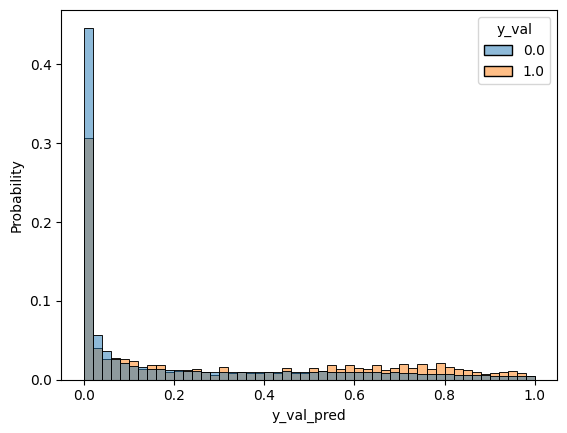

---------------------------------------------
Epoch: 03 | Time: 21m 6s
	Train Loss: 0.369
	 Val. Loss: 0.433
	 Best Val. Loss: 0.433
---------------------------------------------


Within epoch loss (validation) 0.46081: 100%|██████████| 416/416 [00:57<00:00,  7.22it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [7.30502903e-02 1.35790799e-06 3.31952535e-02 2.48437368e-06
 9.60404068e-05]
Lengths 53248 53248


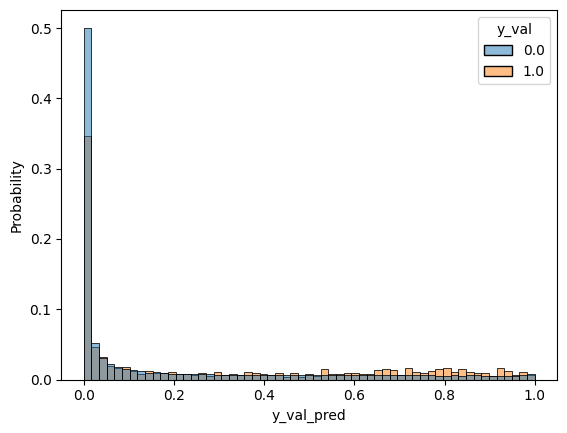

---------------------------------------------
Epoch: 04 | Time: 19m 11s
	Train Loss: 0.299
	 Val. Loss: 0.461
	 Best Val. Loss: 0.433
---------------------------------------------


Within epoch loss (validation) 0.42539: 100%|██████████| 416/416 [00:58<00:00,  7.14it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [9.50758811e-03 5.63817991e-07 4.05366300e-03 4.83297299e-07
 1.02909195e-04]
Lengths 53248 53248


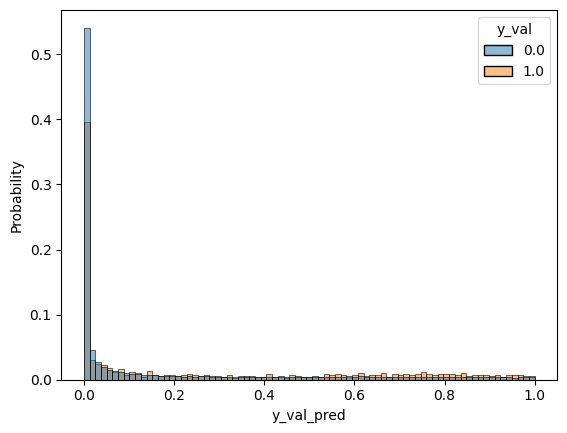

---------------------------------------------
Epoch: 05 | Time: 18m 44s
	Train Loss: 0.254
	 Val. Loss: 0.425
	 Best Val. Loss: 0.425
---------------------------------------------


Within epoch loss (validation) 0.47171: 100%|██████████| 416/416 [00:58<00:00,  7.13it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [2.03822739e-02 1.23372192e-08 2.05679884e-04 4.47565782e-07
 9.04463741e-05]
Lengths 53248 53248


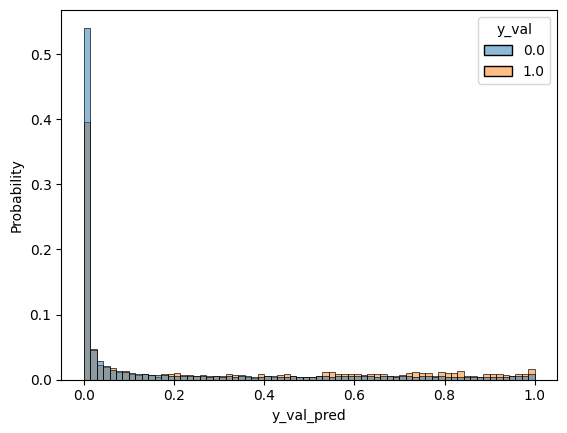

---------------------------------------------
Epoch: 06 | Time: 18m 39s
	Train Loss: 0.220
	 Val. Loss: 0.472
	 Best Val. Loss: 0.425
---------------------------------------------


In [1]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1-min5leads',
    'model_type': 'Inception',
    'minimal_number_of_leads':5,
}


import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# At least 12 leads

Starting Experiment


training using device: mps


The model has 651,257 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(12, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

Within epoch loss (validation) 0.57662: 100%|██████████| 416/416 [00:57<00:00,  7.21it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.34762615 0.08504192 0.2031724  0.13891219 0.36063933]
Lengths 53248 53248


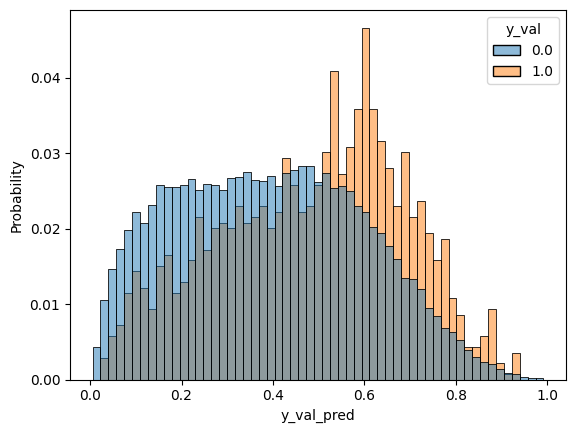

---------------------------------------------
Epoch: 01 | Time: 17m 56s
	Train Loss: 0.651
	 Val. Loss: 0.577
	 Best Val. Loss: 0.577
---------------------------------------------


Within epoch loss (validation) 0.49752: 100%|██████████| 416/416 [00:57<00:00,  7.22it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.01216709 0.00114407 0.0719392  0.05163573 0.03383958]
Lengths 53248 53248


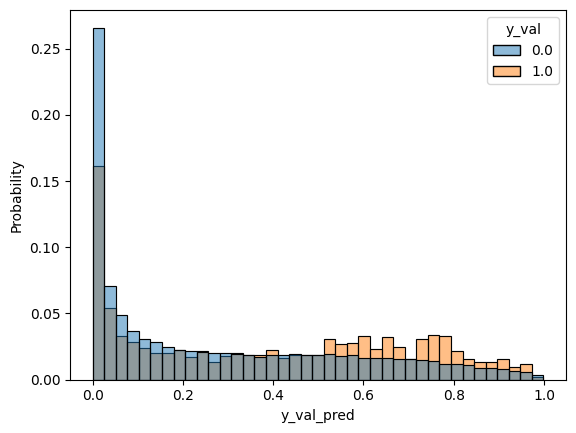

---------------------------------------------
Epoch: 02 | Time: 17m 16s
	Train Loss: 0.495
	 Val. Loss: 0.498
	 Best Val. Loss: 0.498
---------------------------------------------


Within epoch loss (validation) 0.43309: 100%|██████████| 416/416 [00:57<00:00,  7.19it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [8.03213194e-03 1.13426686e-05 7.43588246e-03 1.05104846e-04
 8.06294120e-05]
Lengths 53248 53248


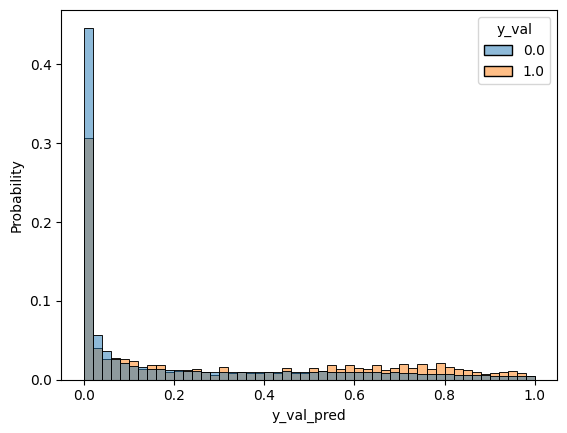

---------------------------------------------
Epoch: 03 | Time: 18m 54s
	Train Loss: 0.369
	 Val. Loss: 0.433
	 Best Val. Loss: 0.433
---------------------------------------------


Within epoch loss (validation) 0.46081: 100%|██████████| 416/416 [00:57<00:00,  7.24it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [7.30502903e-02 1.35790799e-06 3.31952535e-02 2.48437368e-06
 9.60404068e-05]
Lengths 53248 53248


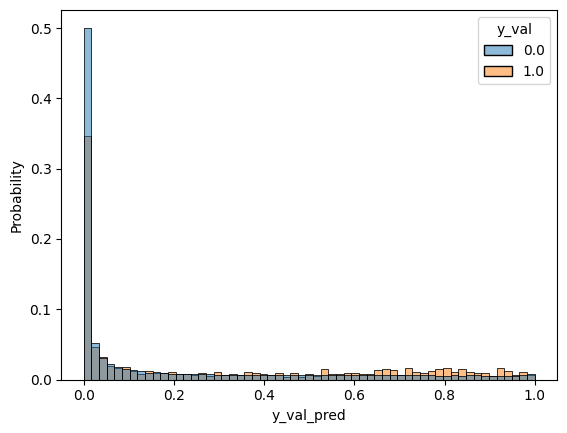

---------------------------------------------
Epoch: 04 | Time: 18m 15s
	Train Loss: 0.299
	 Val. Loss: 0.461
	 Best Val. Loss: 0.433
---------------------------------------------


Within epoch loss (validation) 0.42539: 100%|██████████| 416/416 [00:58<00:00,  7.06it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [9.50758811e-03 5.63817991e-07 4.05366300e-03 4.83297299e-07
 1.02909195e-04]
Lengths 53248 53248


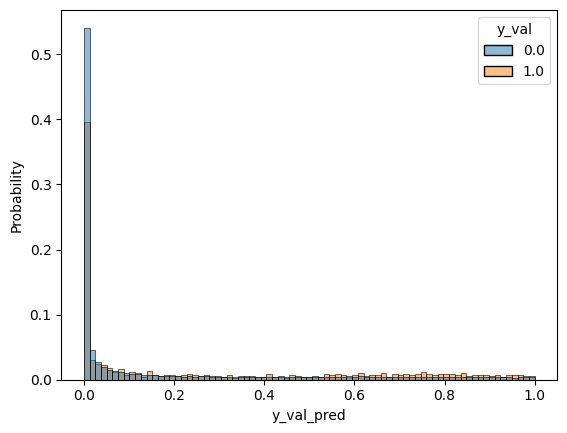

---------------------------------------------
Epoch: 05 | Time: 20m 0s
	Train Loss: 0.254
	 Val. Loss: 0.425
	 Best Val. Loss: 0.425
---------------------------------------------


Within epoch loss (validation) 0.47171: 100%|██████████| 416/416 [00:58<00:00,  7.08it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [2.03822739e-02 1.23372192e-08 2.05679884e-04 4.47565782e-07
 9.04463741e-05]
Lengths 53248 53248


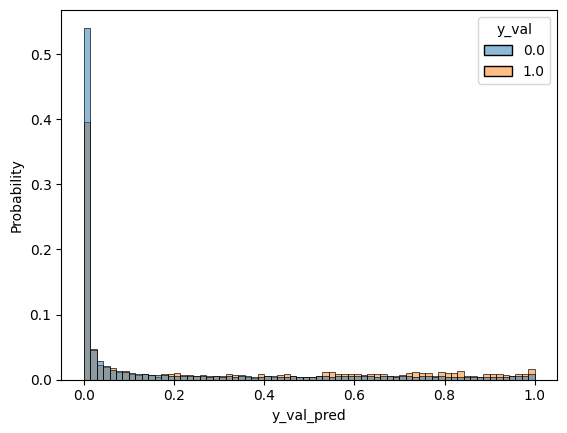

---------------------------------------------
Epoch: 06 | Time: 21m 42s
	Train Loss: 0.220
	 Val. Loss: 0.472
	 Best Val. Loss: 0.425
---------------------------------------------


In [4]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1-min5leads',
    'model_type': 'Inception',
    'minimal_number_of_leads':11,
}


import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# Same leads as before

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Starting Experiment


training using device: mps


The model has 648,121 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(5, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

Within epoch loss (validation) 0.71412: 100%|██████████| 416/416 [01:01<00:00,  6.74it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.70328069 0.38370094 0.18157613 0.27504185 0.06307145]
Lengths 53248 53248


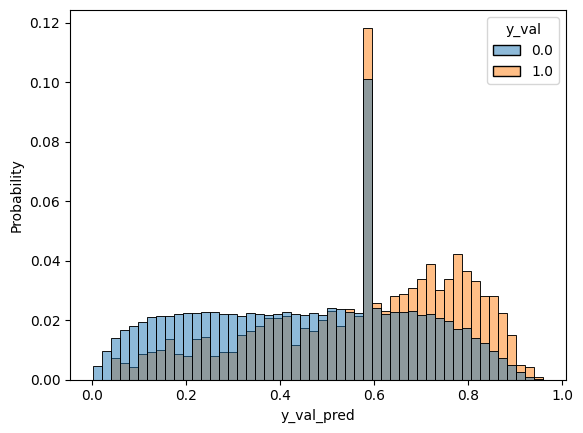

---------------------------------------------
Epoch: 01 | Time: 18m 10s
	Train Loss: 0.630
	 Val. Loss: 0.714
	 Best Val. Loss: 0.714
---------------------------------------------


Within epoch loss (validation) 0.63935: 100%|██████████| 416/416 [00:59<00:00,  6.94it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [0.87233174 0.02485415 0.06342733 0.10973433 0.00402382]
Lengths 53248 53248


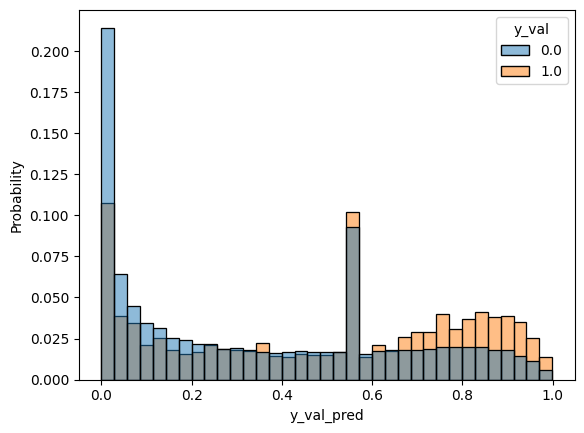

---------------------------------------------
Epoch: 02 | Time: 20m 7s
	Train Loss: 0.507
	 Val. Loss: 0.639
	 Best Val. Loss: 0.639
---------------------------------------------


Within epoch loss (validation) 0.47243: 100%|██████████| 416/416 [00:58<00:00,  7.09it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [2.17079759e-01 2.70555634e-03 4.14814875e-02 2.74945926e-02
 4.45481637e-05]
Lengths 53248 53248


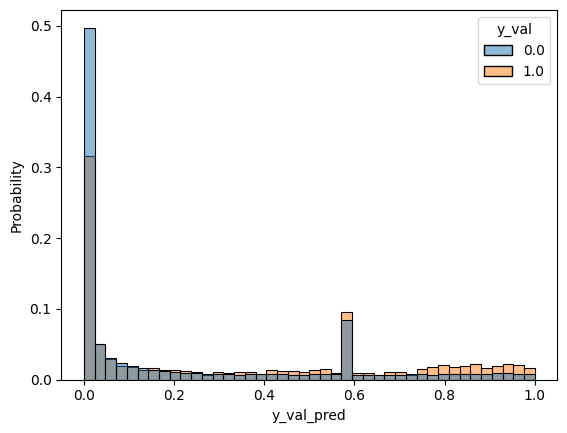

---------------------------------------------
Epoch: 03 | Time: 20m 40s
	Train Loss: 0.364
	 Val. Loss: 0.472
	 Best Val. Loss: 0.472
---------------------------------------------


Within epoch loss (validation) 0.47247: 100%|██████████| 416/416 [00:59<00:00,  7.04it/s]


First 5 examples:
[0. 0. 0. 0. 0.] [3.07279438e-01 8.14727973e-03 2.21294395e-04 9.45689389e-04
 2.68589094e-04]
Lengths 53248 53248


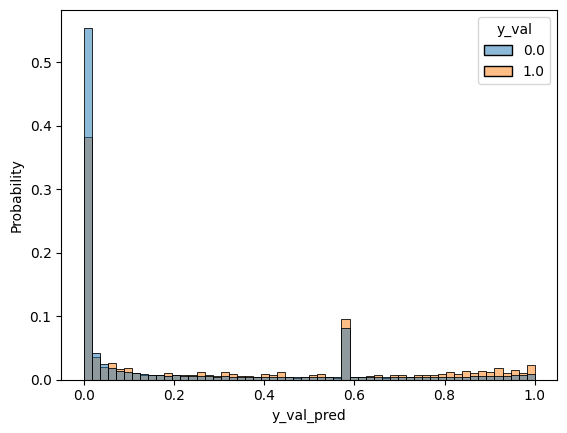

---------------------------------------------
Epoch: 04 | Time: 21m 26s
	Train Loss: 0.275
	 Val. Loss: 0.472
	 Best Val. Loss: 0.472
---------------------------------------------


Within epoch loss (training) 0.2266:  73%|███████▎  | 2904/3982 [17:05<07:26,  2.42it/s] 

In [1]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1-specific5leads',
    'model_type': 'Inception',
    'minimal_number_of_leads':None,
    'leads':['LI','LII','V1','V6','aVF']
}


import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# Same Leads as before - with no missings

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Starting Experiment


training using device: mps


The model has 648,121 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(5, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tr

Within epoch loss (validation) 0.71143: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s]


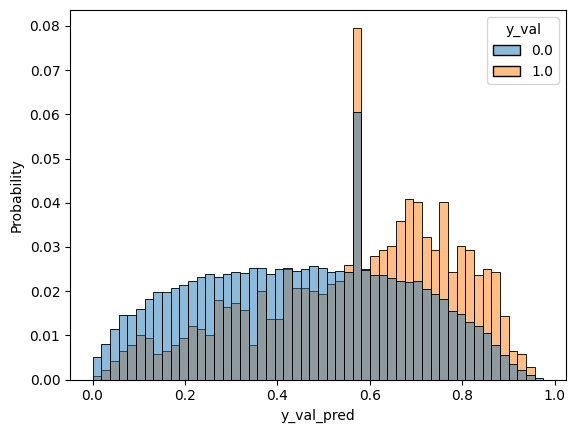

New best aucpr was found, current best aucpr is 0.0449
---------------------------------------------
Epoch: 01 | Time: 21m 9s
	Train Loss: 0.622
	 Val. Loss: 0.711
	 ROC-AUC: 0.649
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.791
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.56626: 100%|██████████| 416/416 [01:01<00:00,  6.74it/s]


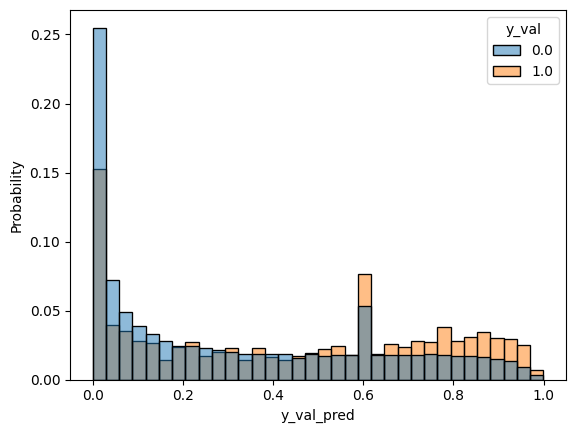

---------------------------------------------
Epoch: 02 | Time: 21m 9s
	Train Loss: 0.491
	 Val. Loss: 0.566
	 ROC-AUC: 0.622
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.56929: 100%|██████████| 416/416 [01:04<00:00,  6.50it/s]


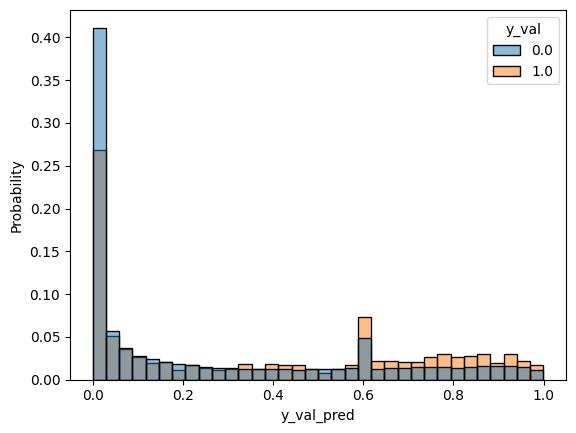

---------------------------------------------
Epoch: 03 | Time: 21m 42s
	Train Loss: 0.341
	 Val. Loss: 0.569
	 ROC-AUC: 0.606
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.41795: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


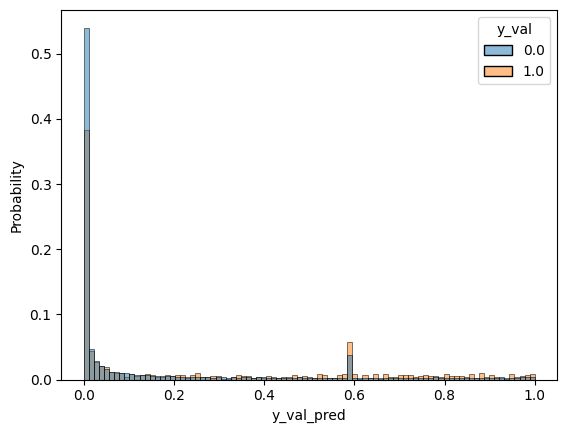

---------------------------------------------
Epoch: 04 | Time: 21m 33s
	Train Loss: 0.253
	 Val. Loss: 0.418
	 ROC-AUC: 0.610
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.43654: 100%|██████████| 416/416 [00:59<00:00,  7.00it/s]


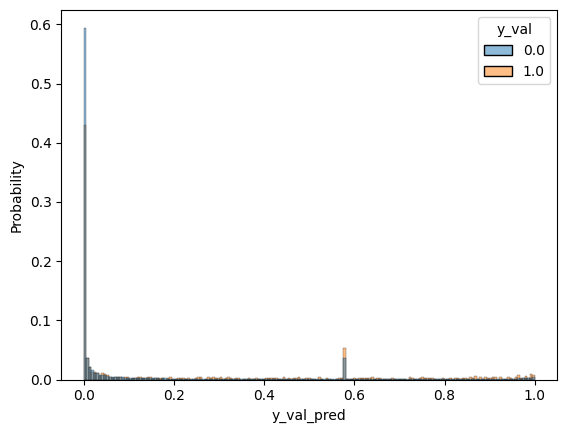

---------------------------------------------
Epoch: 05 | Time: 21m 8s
	Train Loss: 0.198
	 Val. Loss: 0.437
	 ROC-AUC: 0.614
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.742
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (training) 0.1637:   1%|▏         | 53/3982 [00:16<20:47,  3.15it/s] 


KeyboardInterrupt: 

In [1]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1-specific5leads-min5leads',
    'model_type': 'Inception',
    'minimal_number_of_leads':5,
    'leads':['LI','LII','V2','V5','aVR'],
    'eval_metric':'aucpr'
}

import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# Weight Decay

Starting Experiment


training using device: mps


The model has 651,257 trainable parameters
DownstreamInception(
  (conv1): ConvBlock(
    (conv): Conv1d(12, 64, kernel_size=(7,), stride=(2,), padding=(3,))
    (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv2): ConvBlock(
    (conv): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool): MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (inception3a): InceptionBlock(
    (branch1): ConvBlock(
      (conv): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (branch2): Sequential(
      (0): ConvBlock(
        (conv): Conv1d(128, 96, kernel_size=(1,), stride=(1,))
        (bn): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

Within epoch loss (validation) 0.59542: 100%|██████████| 416/416 [00:58<00:00,  7.09it/s]


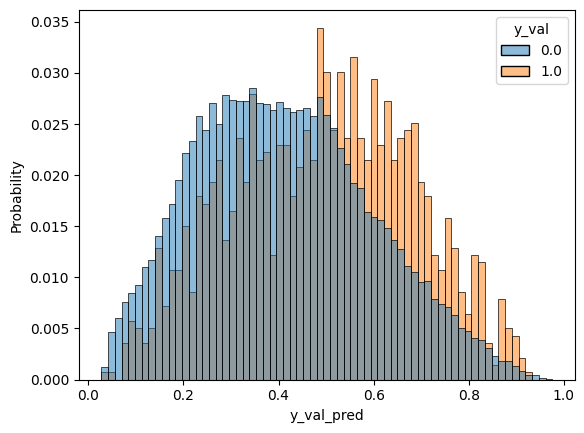

New best aucpr was found, current best aucpr is 0.0413
---------------------------------------------
Epoch: 01 | Time: 20m 25s
	Train Loss: 0.655
	 Val. Loss: 0.595
	 ROC-AUC: 0.624
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.742
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.50371: 100%|██████████| 416/416 [00:58<00:00,  7.14it/s]


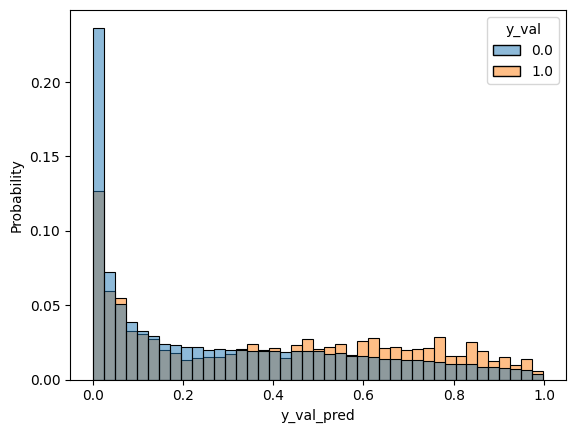

---------------------------------------------
Epoch: 02 | Time: 19m 58s
	Train Loss: 0.514
	 Val. Loss: 0.504
	 ROC-AUC: 0.610
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.724
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.46285: 100%|██████████| 416/416 [00:58<00:00,  7.09it/s]


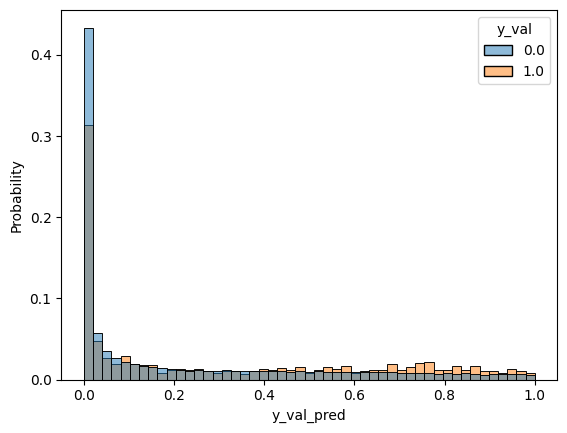

---------------------------------------------
Epoch: 03 | Time: 19m 54s
	Train Loss: 0.370
	 Val. Loss: 0.463
	 ROC-AUC: 0.599
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.712
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.54405: 100%|██████████| 416/416 [00:58<00:00,  7.06it/s]


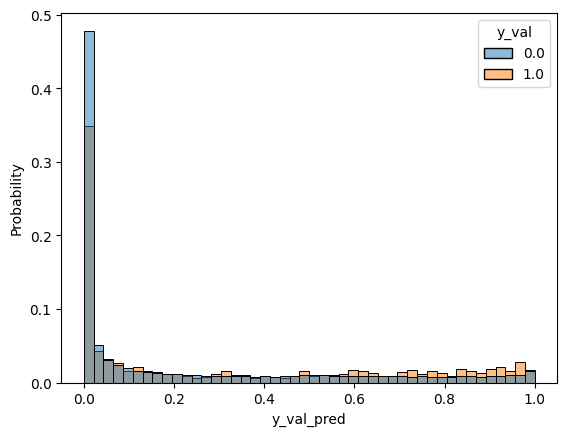

---------------------------------------------
Epoch: 04 | Time: 20m 24s
	Train Loss: 0.287
	 Val. Loss: 0.544
	 ROC-AUC: 0.594
	 PR-AUC: 0.036
	 TPR for FPR=0.6 Budget: 0.719
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.4649: 100%|██████████| 416/416 [00:59<00:00,  7.00it/s] 


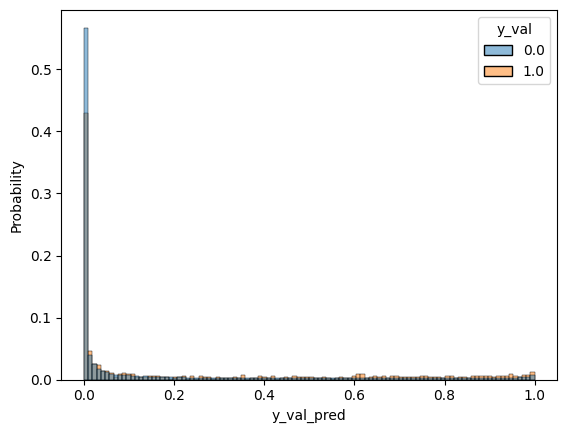

---------------------------------------------
Epoch: 05 | Time: 19m 59s
	Train Loss: 0.234
	 Val. Loss: 0.465
	 ROC-AUC: 0.589
	 PR-AUC: 0.036
	 TPR for FPR=0.6 Budget: 0.704
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.46145: 100%|██████████| 416/416 [01:07<00:00,  6.17it/s]


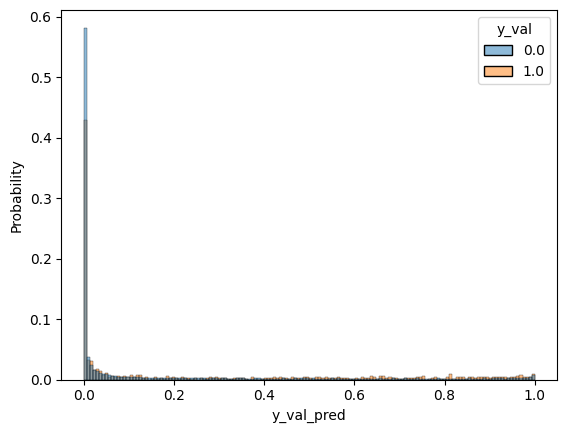

---------------------------------------------
Epoch: 06 | Time: 20m 51s
	Train Loss: 0.197
	 Val. Loss: 0.461
	 ROC-AUC: 0.603
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.720
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (training) 0.17571:  39%|███▉      | 1556/3982 [09:02<14:05,  2.87it/s]


KeyboardInterrupt: 

In [4]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 30,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-wday-0.1',
    'model_type': 'Inception',
    'eval_metric':'aucpr',
    'weight_decay':0,
    'lr':0.001
}

import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# Anlysis

In [8]:
from modeling.Inception import *
from utils.plots import *

# load model
model = DownstreamInception(dropout=0.5)
model.load_state_dict(torch.load('./models/3.0-inception-bs128-balanced-wday-0.1.pt'))

# load data
data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
data = data[data['sample'] == 'test'].reset_index(drop=True)
predictions, non_missing_leads = predict(data['reading'], model, data)
data['y_pred'] = predictions
data['non_missing_leads'] = non_missing_leads
data

,sample,reading,dates,one_year_until_death,CVA,first_AF_in_home_ECG,first_AF_in_Dispatch,AF,IHD,sp_MI_all,...,Age_at_start,dates_datetime,approximate_death_datetime,time_until_approximate_death,days_until_approximate_death,Customer_BirthDate_datetime,Customer_BirthDate_1900,age_days,y_pred,non_missing_leads
0,test,487286,18/09/2015,0,0.0,1.0,1.0,1.0,0.0,0.0,...,75.0,2015-09-18,NaN,NaN,NaN,1929-01-01 00:01:00,1/1/1929,31670.0,0.316376,11
1,test,468825,26/11/2008,0,1.0,0.0,0.0,0.0,0.0,0.0,...,62.0,2008-11-26,2010-09-23,666 days,666.0,1934-01-05 00:25:00,5/25/1934,27353.0,0.596924,2
2,test,304101,02/11/2004,0,0.0,0.0,0.0,0.0,1.0,0.0,...,76.0,2004-11-02,2017-02-05,4478 days,4478.0,1924-01-01 00:01:00,1/1/1924,29525.0,0.159623,4
3,test,540684,01/01/2011,0,0.0,0.0,0.0,0.0,1.0,1.0,...,64.0,2011-01-01,NaN,NaN,NaN,1937-01-05 00:12:00,5/12/1937,27023.0,0.457351,7
4,test,469169,07/08/2013,1,0.0,0.0,0.0,0.0,0.0,0.0,...,76.0,2013-08-07,2014-07-28,355 days,355.0,1927-01-01 00:01:00,1/1/1927,31629.0,0.600467,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55446,test,387849,01/04/2001,0,0.0,0.0,0.0,0.0,0.0,0.0,...,75.0,2001-04-01,2007-10-27,2400 days,2400.0,1926-01-10 00:18:00,10/18/1926,27474.0,0.833919,8
55447,test,395752,23/04/2012,0,0.0,0.0,0.0,0.0,1.0,1.0,...,51.0,2012-04-23,NaN,NaN,NaN,1960-01-10 00:20:00,10/20/1960,19096.0,0.337558,7
55448,test,434377,03/09/2012,0,0.0,0.0,0.0,0.0,0.0,0.0,...,50.0,2012-09-03,2020-01-23,2698 days,2698.0,1952-01-06 00:21:00,6/21/1952,22155.0,0.217749,6
55449,test,384590,10/09/2000,0,0.0,0.0,0.0,0.0,0.0,0.0,...,64.0,2000-09-10,NaN,NaN,NaN,1936-01-01 00:01:00,1/1/1936,23628.0,0.100058,7


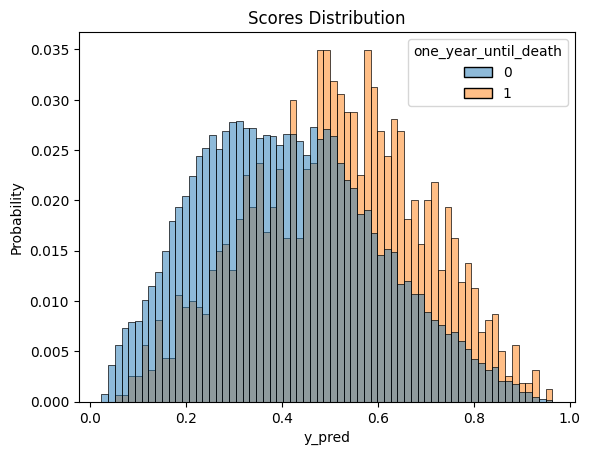

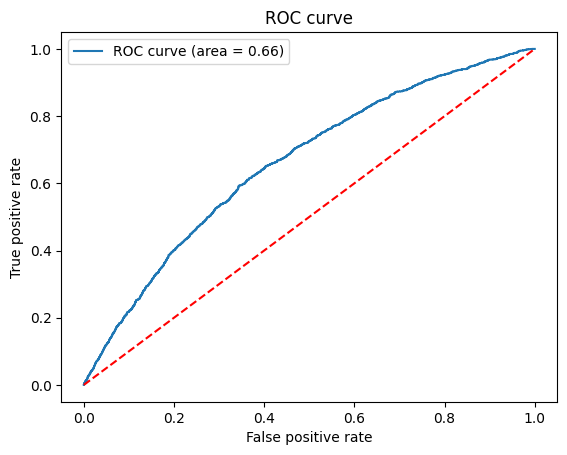

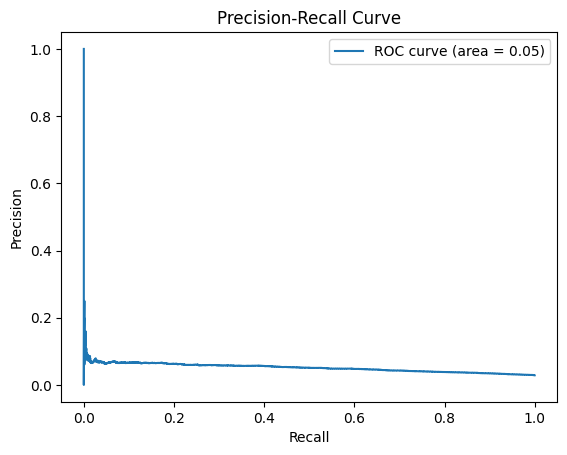

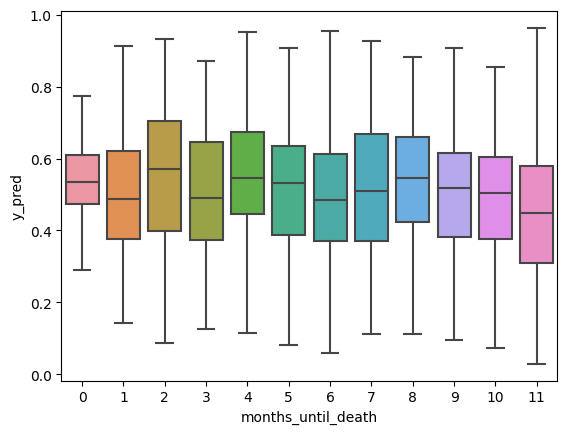

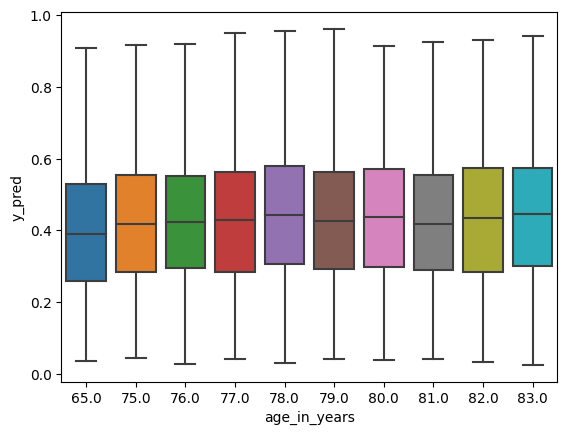

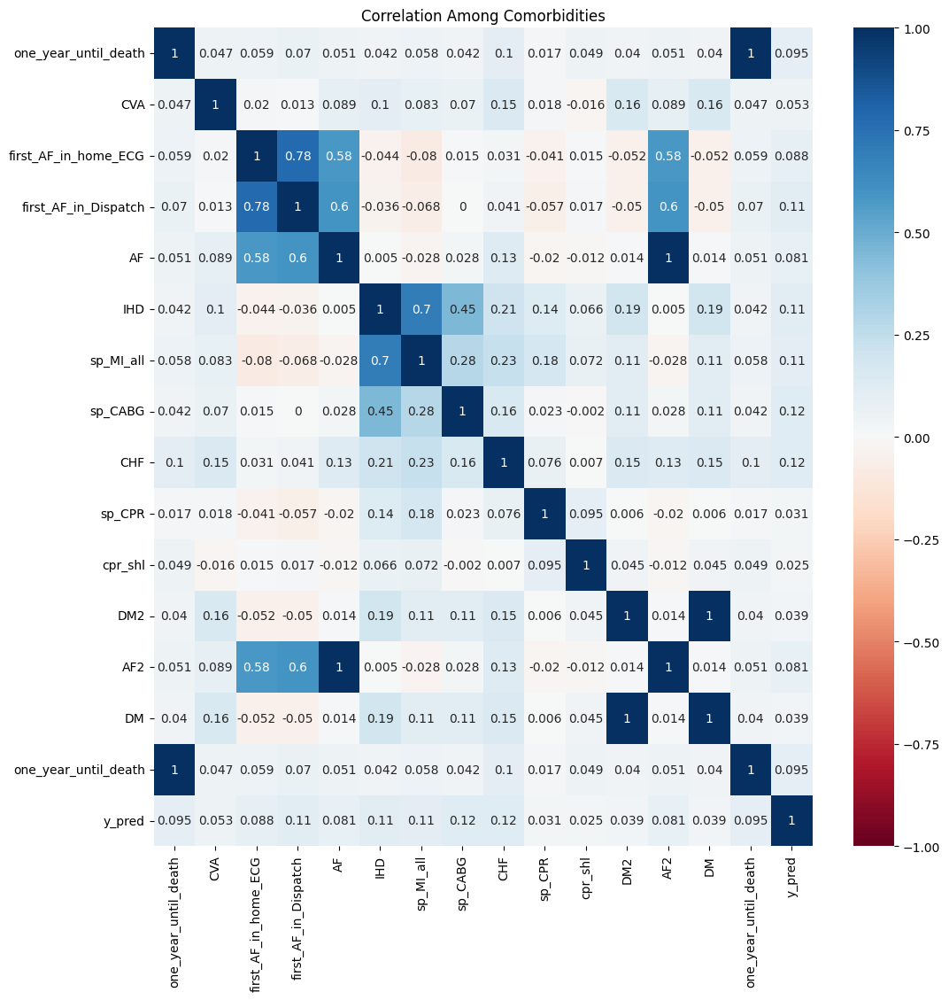

In [9]:
post_reg_analysis(data, 'one_year_until_death', 'y_pred')


In [10]:
for j in np.linspace(0,1,20):
    print(f'confussion mat for {np.round(j,4)}:')
    display(
        pd.crosstab(data['one_year_until_death'],
                    (data['y_pred']>j).astype(int),
                    normalize='index')
    )

confussion mat for 0.0:


y_pred,1
one_year_until_death,
0,1.0
1,1.0


confussion mat for 0.0526:


y_pred,0,1
one_year_until_death,,
0,0.004643,0.995357
1,0.000000,1.000000


confussion mat for 0.1053:


y_pred,0,1
one_year_until_death,,
0,0.031699,0.968301
1,0.004997,0.995003


confussion mat for 0.1579:


y_pred,0,1
one_year_until_death,,
0,0.075376,0.924624
1,0.025609,0.974391


confussion mat for 0.2105:


y_pred,0,1
one_year_until_death,,
0,0.146722,0.853278
1,0.055590,0.944410


confussion mat for 0.2632:


y_pred,0,1
one_year_until_death,,
0,0.240409,0.759591
1,0.093067,0.906933


confussion mat for 0.3158:


y_pred,0,1
one_year_until_death,,
0,0.340557,0.659443
1,0.153029,0.846971


confussion mat for 0.3684:


y_pred,0,1
one_year_until_death,,
0,0.441727,0.558273
1,0.227983,0.772017


confussion mat for 0.4211:


y_pred,0,1
one_year_until_death,,
0,0.540149,0.459851
1,0.307308,0.692692


confussion mat for 0.4737:


y_pred,0,1
one_year_until_death,,
0,0.638217,0.361783
1,0.392255,0.607745


confussion mat for 0.5263:


y_pred,0,1
one_year_until_death,,
0,0.735747,0.264253
1,0.517177,0.482823


confussion mat for 0.5789:


y_pred,0,1
one_year_until_death,,
0,0.812553,0.187447
1,0.618988,0.381012


confussion mat for 0.6316:


y_pred,0,1
one_year_until_death,,
0,0.872089,0.127911
1,0.732042,0.267958


confussion mat for 0.6842:


y_pred,0,1
one_year_until_death,,
0,0.917660,0.082340
1,0.815116,0.184884


confussion mat for 0.7368:


y_pred,0,1
one_year_until_death,,
0,0.950604,0.049396
1,0.880700,0.119300


confussion mat for 0.7895:


y_pred,0,1
one_year_until_death,,
0,0.974633,0.025367
1,0.937539,0.062461


confussion mat for 0.8421:


y_pred,0,1
one_year_until_death,,
0,0.989099,0.010901
1,0.971268,0.028732


confussion mat for 0.8947:


y_pred,0,1
one_year_until_death,,
0,0.997363,0.002637
1,0.992505,0.007495


confussion mat for 0.9474:


y_pred,0,1
one_year_until_death,,
0,0.999796,0.000204
1,0.998751,0.001249


confussion mat for 1.0:


y_pred,0
one_year_until_death,
0,1.0
1,1.0


# Toy tuning for LR and Decay to run over night

Starting Experiment 1 (of 36)


training using device: mps




Within epoch loss (validation) 0.57201: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


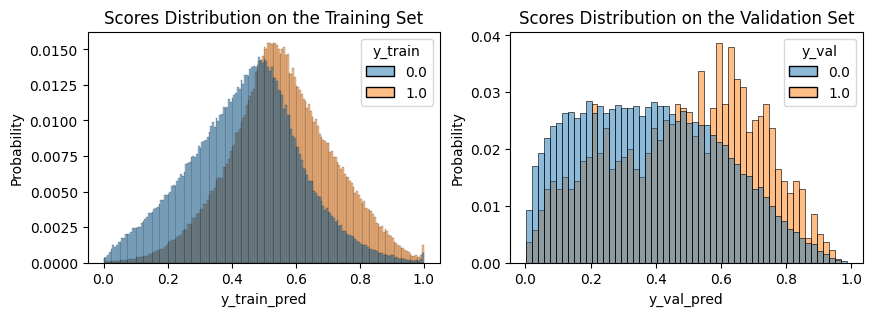

New best aucpr was found, current best aucpr is 0.0428
---------------------------------------------
Epoch: 01 | Time: 19m 16s
	Train Loss: 0.644
	 Val. Loss: 0.572
	 ROC-AUC: 0.630
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.744
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.47216: 100%|██████████| 416/416 [01:01<00:00,  6.81it/s]


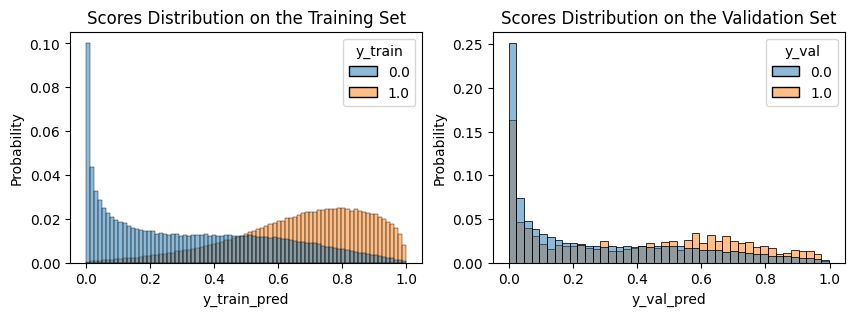

---------------------------------------------
Epoch: 02 | Time: 18m 53s
	Train Loss: 0.490
	 Val. Loss: 0.472
	 ROC-AUC: 0.615
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.729
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 0.54239: 100%|██████████| 416/416 [01:05<00:00,  6.32it/s]


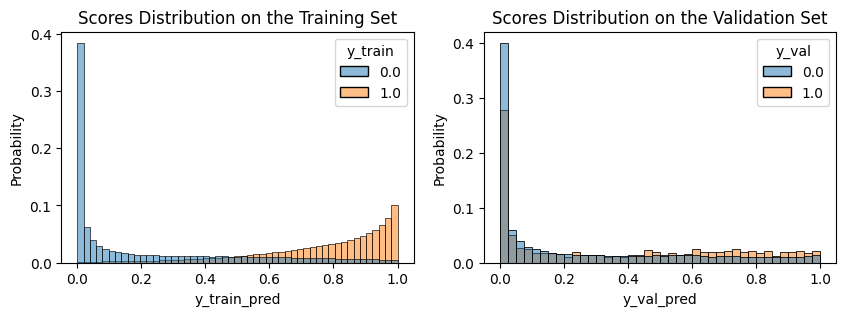

---------------------------------------------
Epoch: 03 | Time: 23m 13s
	Train Loss: 0.356
	 Val. Loss: 0.542
	 ROC-AUC: 0.603
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.723
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (training) 0.30397:   6%|▌         | 232/3982 [01:29<23:59,  2.60it/s]


KeyboardInterrupt: 

In [2]:
import os
from tqdm import tqdm
# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer
LRs = [0.001,0.005,0.01]
DECAYs = [0,0.001,0.005,0.01]
DROUPOUTs = [0.2,0.5,0.7]
TOTAL = len(LRs) * len(DECAYs) * len(DROUPOUTs)
t=1

for lr in LRs:
    for decay in DECAYs:
        for dropout in DROUPOUTs:
            config = {
                # general
                'seed': 123,
                'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
                # 'metadata_file_path': './data/combined_data/metadata_sample_for_testing.csv',
                'data_folder_path': './data/individual-signals/',
                'fillna': 0,
                # training
                'batch_size': 128,
                'n_epochs': 10,
                # architecture
                'targets': ['one_year_until_death'],
                'input_dimension': 12,
                'hidden_dimmension':  64 ,       
                'attention_heads': 4 ,
                'encoder_number_of_layers': 8,
                'dropout': dropout,
                'clip': 1,
                'positional_encodings': False,
                'saving_path': f'./models/3.0-inception-bs128-balanced-death-lr{lr}-decay{decay}-aucpr',
                'model_type': 'Inception',
                'eval_metric':'aucpr',
                'weight_decay':decay,
                'lr':lr,
                'patience':3,
            }

            # run
            print(f'Starting Experiment {t} (of {TOTAL})')
            trainer(**config)

            t+=1

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Starting Experiment


training using device: mps




Within epoch loss (validation) 0.11404: 100%|██████████| 41/41 [00:05<00:00,  7.41it/s]


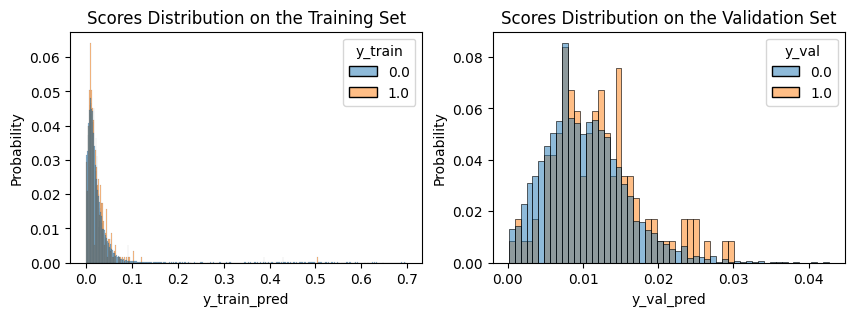

New best aucpr was found, current best aucpr is 0.0317
---------------------------------------------
Epoch: 01 | Time: 0m 55s
	Train Loss: 0.116
	 Val. Loss: 0.114
	 ROC-AUC: 0.584
	 PR-AUC: 0.032
	 TPR for FPR=0.6 Budget: 0.706
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (training) 0.11997:  17%|█▋        | 36/207 [00:09<00:43,  3.95it/s]


KeyboardInterrupt: 

In [1]:
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_sample_for_testing.csv',
    # 'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 6,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.5,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': './models/3.0-inception-bs128-balanced-fillna-1-specific5leads-min5leads',
    'model_type': 'Inception',
    'minimal_number_of_leads':5,
    'leads':['LI','LII','V2','V5','aVR'],
    'eval_metric':'aucpr'
}

import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

# run
print('Starting Experiment')
trainer(**config)


# Add weight



training using device: mps




Within epoch loss (validation) 20.91685: 100%|██████████| 416/416 [01:14<00:00,  5.55it/s]


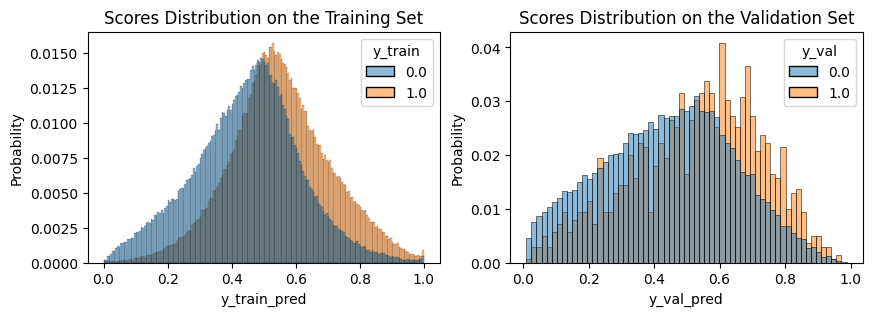

New best aucpr was found, current best aucpr is 0.0413
---------------------------------------------
Epoch: 01 | Time: 24m 43s
	Train Loss: 21.052
	 Val. Loss: 20.917
	 ROC-AUC: 0.622
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.746
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 15.10571: 100%|██████████| 416/416 [01:14<00:00,  5.59it/s]


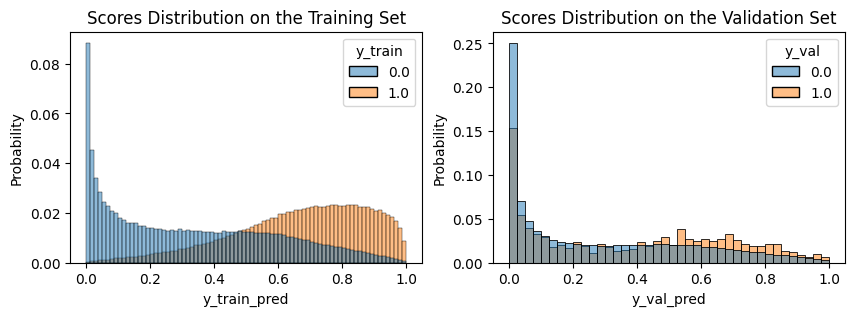

---------------------------------------------
Epoch: 02 | Time: 24m 45s
	Train Loss: 16.218
	 Val. Loss: 15.106
	 ROC-AUC: 0.603
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.720
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (training) 12.71285:  33%|███▎      | 1327/3982 [09:03<18:07,  2.44it/s]


KeyboardInterrupt: 

In [3]:
import os
from tqdm import tqdm
import torch

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_balanced_by_death.csv',
    # 'metadata_file_path': './data/combined_data/metadata_sample_for_testing.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 10,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.2,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': f'./models/3.0-inception-bs128-balanced-death-lr{0.001}-decay{0}-aucpr-weighted33',
    'model_type': 'Inception',
    'eval_metric':'aucpr',
    'weight_decay':0,
    'lr':0.001,
    'patience':3,
    'loss_function_weight': torch.tensor([33.0]).to('mps')
}

# run
trainer(**config)

# Imbalanced



training using device: mps




Within epoch loss (validation) 6.16204: 100%|██████████| 416/416 [01:08<00:00,  6.04it/s]


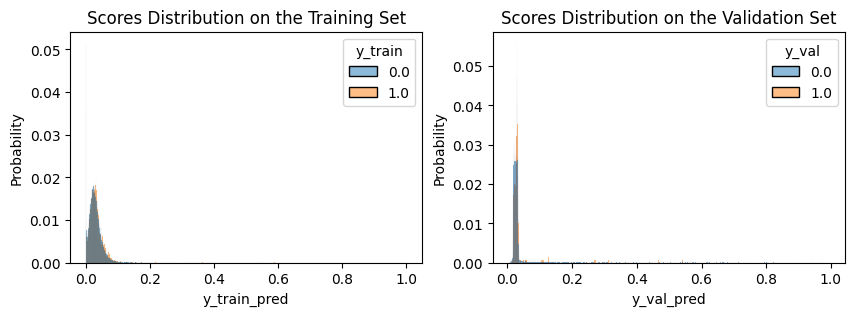

New best aucpr was found, current best aucpr is 0.0292
---------------------------------------------
Epoch: 01 | Time: 13m 4s
	Train Loss: 5.739
	 Val. Loss: 6.162
	 ROC-AUC: 0.559
	 PR-AUC: 0.029
	 TPR for FPR=0.6 Budget: 0.709
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.73787: 100%|██████████| 416/416 [59:56<00:00,  8.65s/it]   


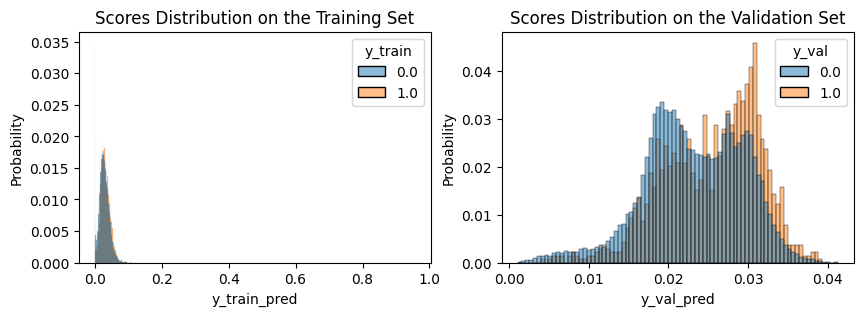

New best aucpr was found, current best aucpr is 0.0395
---------------------------------------------
Epoch: 02 | Time: 250m 50s
	Train Loss: 4.656
	 Val. Loss: 3.738
	 ROC-AUC: 0.609
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.31033: 100%|██████████| 416/416 [01:03<00:00,  6.60it/s]


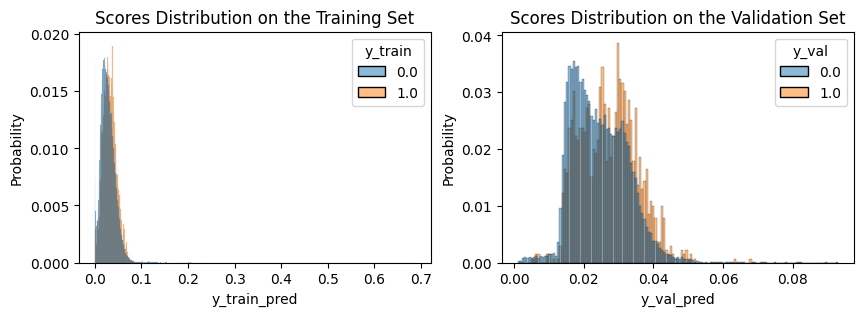

---------------------------------------------
Epoch: 03 | Time: 9m 48s
	Train Loss: 4.937
	 Val. Loss: 4.310
	 ROC-AUC: 0.602
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.730
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.88231: 100%|██████████| 416/416 [01:07<00:00,  6.12it/s]


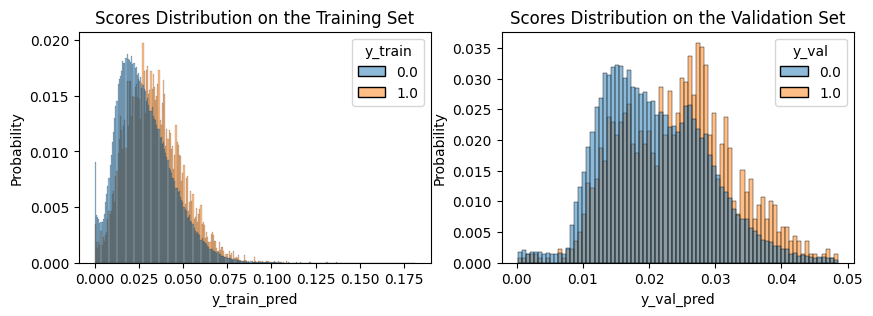

New best aucpr was found, current best aucpr is 0.0406
---------------------------------------------
Epoch: 04 | Time: 10m 7s
	Train Loss: 5.168
	 Val. Loss: 3.882
	 ROC-AUC: 0.616
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.739
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.15875: 100%|██████████| 416/416 [01:02<00:00,  6.63it/s]


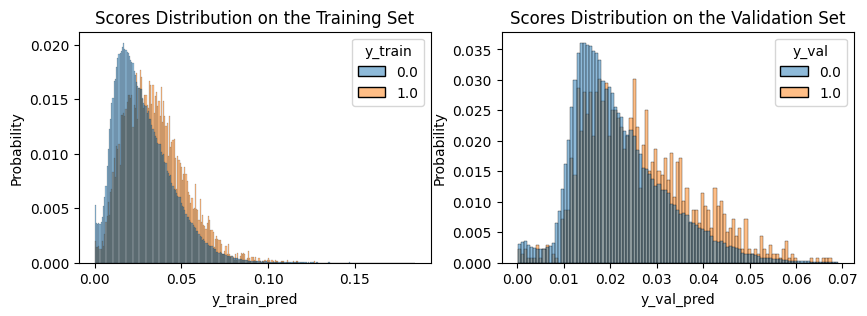

New best aucpr was found, current best aucpr is 0.0421
---------------------------------------------
Epoch: 05 | Time: 10m 48s
	Train Loss: 4.777
	 Val. Loss: 5.159
	 ROC-AUC: 0.615
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.745
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.02385: 100%|██████████| 416/416 [00:59<00:00,  7.04it/s]


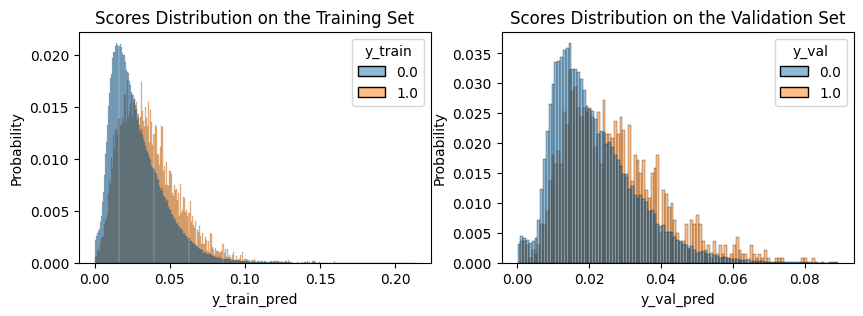

New best aucpr was found, current best aucpr is 0.0438
---------------------------------------------
Epoch: 06 | Time: 10m 12s
	Train Loss: 4.925
	 Val. Loss: 3.024
	 ROC-AUC: 0.623
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.43707: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s]


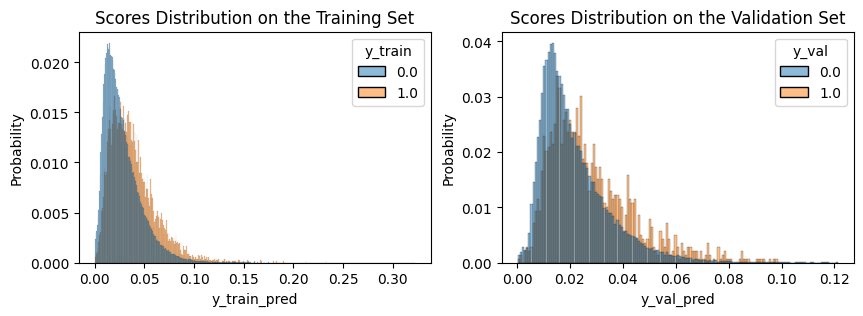

New best aucpr was found, current best aucpr is 0.0442
---------------------------------------------
Epoch: 07 | Time: 10m 10s
	Train Loss: 4.902
	 Val. Loss: 3.437
	 ROC-AUC: 0.628
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.768
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.04222: 100%|██████████| 416/416 [01:00<00:00,  6.91it/s]


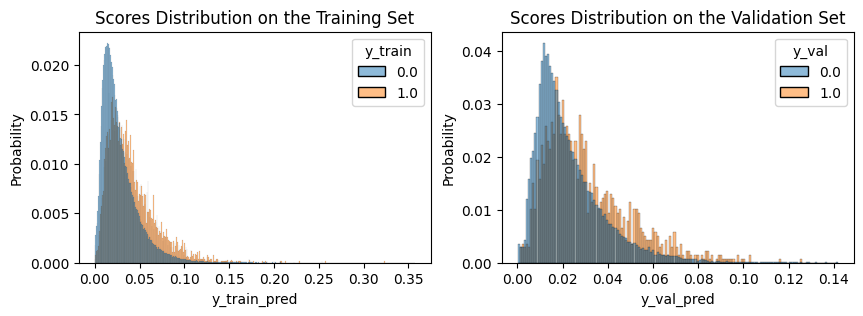

---------------------------------------------
Epoch: 08 | Time: 10m 23s
	Train Loss: 4.433
	 Val. Loss: 4.042
	 ROC-AUC: 0.630
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.775
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.34539: 100%|██████████| 416/416 [01:00<00:00,  6.83it/s]


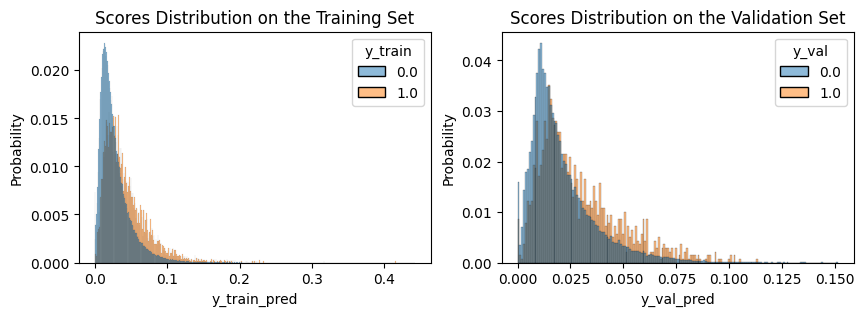

New best aucpr was found, current best aucpr is 0.0451
---------------------------------------------
Epoch: 09 | Time: 10m 40s
	Train Loss: 4.667
	 Val. Loss: 4.345
	 ROC-AUC: 0.633
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.780
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.01658: 100%|██████████| 416/416 [01:03<00:00,  6.56it/s]


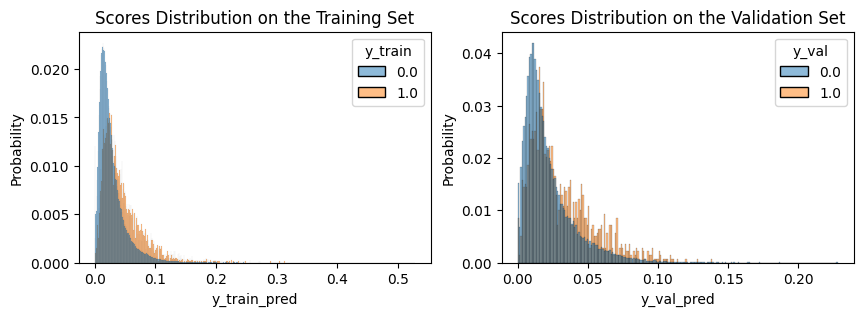

---------------------------------------------
Epoch: 10 | Time: 10m 51s
	Train Loss: 4.580
	 Val. Loss: 3.017
	 ROC-AUC: 0.632
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.769
	 Best Val. Loss: inf
---------------------------------------------


In [5]:
import os
from tqdm import tqdm
import torch

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_only_existant_readings_09042023.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 10,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.2,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': f'./models/3.0-inception-bs128-balanced-death-lr{0.001}-decay{0}-aucpr-weighted33',
    'model_type': 'Inception',
    'eval_metric':'aucpr',
    'weight_decay':0,
    'lr':0.001,
    'patience':3,
    'loss_function_weight': torch.tensor([33.0]).to('mps')
}

# run
trainer(**config)

# Continue trainng

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm




training using device: mps


model params have been loaded


Within epoch loss (validation) 4.51158: 100%|██████████| 416/416 [01:00<00:00,  6.88it/s]


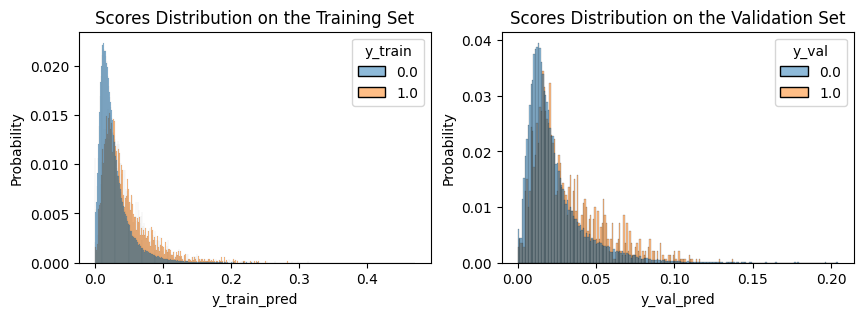

New best aucpr was found, current best aucpr is 0.0443
---------------------------------------------
Epoch: 01 | Time: 9m 32s
	Train Loss: 4.697
	 Val. Loss: 4.512
	 ROC-AUC: 0.628
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.07137: 100%|██████████| 416/416 [01:03<00:00,  6.57it/s]


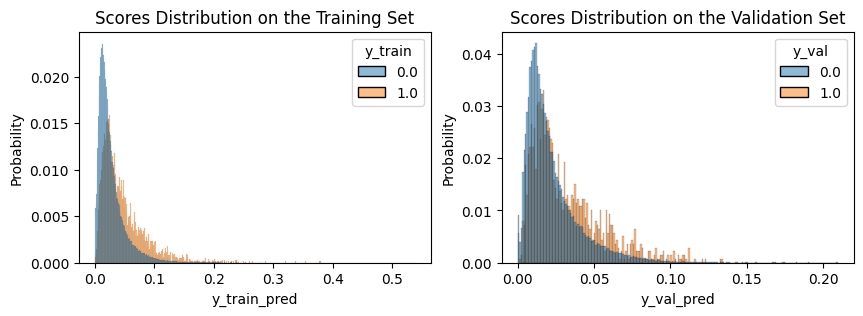

New best aucpr was found, current best aucpr is 0.0454
---------------------------------------------
Epoch: 02 | Time: 11m 9s
	Train Loss: 4.729
	 Val. Loss: 4.071
	 ROC-AUC: 0.630
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.766
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.74207: 100%|██████████| 416/416 [01:05<00:00,  6.37it/s]


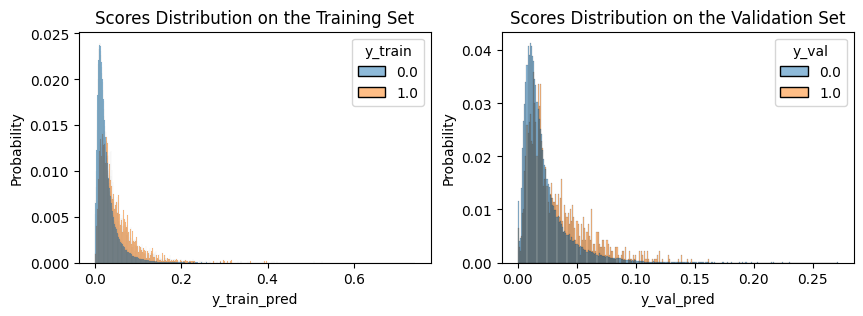

---------------------------------------------
Epoch: 03 | Time: 11m 22s
	Train Loss: 4.454
	 Val. Loss: 4.742
	 ROC-AUC: 0.629
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.763
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.6176: 100%|██████████| 416/416 [01:06<00:00,  6.29it/s] 


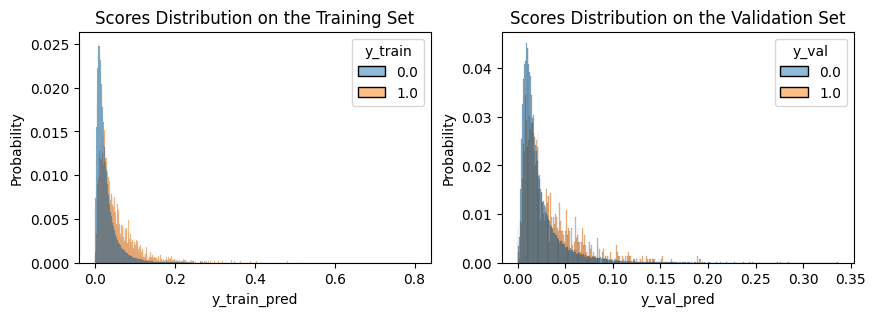

---------------------------------------------
Epoch: 04 | Time: 11m 37s
	Train Loss: 4.100
	 Val. Loss: 3.618
	 ROC-AUC: 0.626
	 PR-AUC: 0.045
	 TPR for FPR=0.6 Budget: 0.750
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.19536: 100%|██████████| 416/416 [01:02<00:00,  6.65it/s]


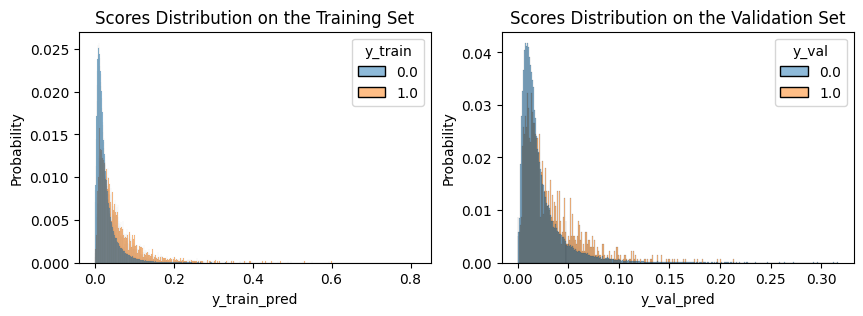

---------------------------------------------
Epoch: 05 | Time: 11m 11s
	Train Loss: 4.312
	 Val. Loss: 4.195
	 ROC-AUC: 0.626
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.84111: 100%|██████████| 416/416 [01:02<00:00,  6.69it/s]


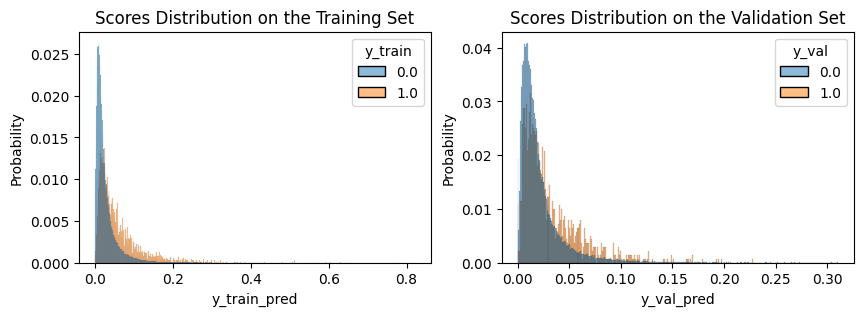

In [1]:
import os
from tqdm import tqdm
import torch

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')


# import trainer
from executors.train_on_local_machine_mps import trainer
config = {
    # general
    'seed': 123,
    'metadata_file_path': './data/combined_data/metadata_only_existant_readings_09042023.csv',
    'data_folder_path': './data/individual-signals/',
    'fillna': 0,
    # training
    'batch_size': 128,
    'n_epochs': 10,
    # architecture
    'targets': ['one_year_until_death'],
    'input_dimension': 12,
    'hidden_dimmension':  64 ,       
    'attention_heads': 4 ,
    'encoder_number_of_layers': 8,
    'dropout': 0.2,
    'clip': 1,
    'positional_encodings': False,
    'saving_path': f'./models/3.0-inception-bs128-balanced-death-lr{0.001}-decay{0}-aucpr-weighted33',
    'model_type': 'Inception',
    'eval_metric':'aucpr',
    'weight_decay':0,
    'lr':0.001,
    'patience':3,
    'loss_function_weight': torch.tensor([33.0]).to('mps'),
    'continue_training':True
}

# run
trainer(**config)

In [2]:
from modeling.Inception import *
from utils.plots import *

# load model
model = DownstreamInception(dropout=0.5)
model.load_state_dict(torch.load(f'./models/3.0-inception-bs128-balanced-death-lr{0.001}-decay{0}-aucpr-weighted33.pt'))

# load data
data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
data = data[data['sample'] == 'test'].reset_index(drop=True)
predictions, non_missing_leads = predict(data['reading'], model, data)
data['y_pred'] = predictions
data['non_missing_leads'] = non_missing_leads
data

,sample,reading,dates,one_year_until_death,CVA,first_AF_in_home_ECG,first_AF_in_Dispatch,AF,IHD,sp_MI_all,...,Age_at_start,dates_datetime,approximate_death_datetime,time_until_approximate_death,days_until_approximate_death,Customer_BirthDate_datetime,Customer_BirthDate_1900,age_days,y_pred,non_missing_leads
0,test,487286,18/09/2015,0,0.0,1.0,1.0,1.0,0.0,0.0,...,75.0,2015-09-18,NaN,NaN,NaN,1929-01-01 00:01:00,1/1/1929,31670.0,0.008007,11
1,test,468825,26/11/2008,0,1.0,0.0,0.0,0.0,0.0,0.0,...,62.0,2008-11-26,2010-09-23,666 days,666.0,1934-01-05 00:25:00,5/25/1934,27353.0,0.035335,2
2,test,304101,02/11/2004,0,0.0,0.0,0.0,0.0,1.0,0.0,...,76.0,2004-11-02,2017-02-05,4478 days,4478.0,1924-01-01 00:01:00,1/1/1924,29525.0,0.006312,4
3,test,540684,01/01/2011,0,0.0,0.0,0.0,0.0,1.0,1.0,...,64.0,2011-01-01,NaN,NaN,NaN,1937-01-05 00:12:00,5/12/1937,27023.0,0.024959,7
4,test,469169,07/08/2013,1,0.0,0.0,0.0,0.0,0.0,0.0,...,76.0,2013-08-07,2014-07-28,355 days,355.0,1927-01-01 00:01:00,1/1/1927,31629.0,0.014526,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55446,test,387849,01/04/2001,0,0.0,0.0,0.0,0.0,0.0,0.0,...,75.0,2001-04-01,2007-10-27,2400 days,2400.0,1926-01-10 00:18:00,10/18/1926,27474.0,0.009932,8
55447,test,395752,23/04/2012,0,0.0,0.0,0.0,0.0,1.0,1.0,...,51.0,2012-04-23,NaN,NaN,NaN,1960-01-10 00:20:00,10/20/1960,19096.0,0.028382,7
55448,test,434377,03/09/2012,0,0.0,0.0,0.0,0.0,0.0,0.0,...,50.0,2012-09-03,2020-01-23,2698 days,2698.0,1952-01-06 00:21:00,6/21/1952,22155.0,0.009365,6
55449,test,384590,10/09/2000,0,0.0,0.0,0.0,0.0,0.0,0.0,...,64.0,2000-09-10,NaN,NaN,NaN,1936-01-01 00:01:00,1/1/1936,23628.0,0.008654,7


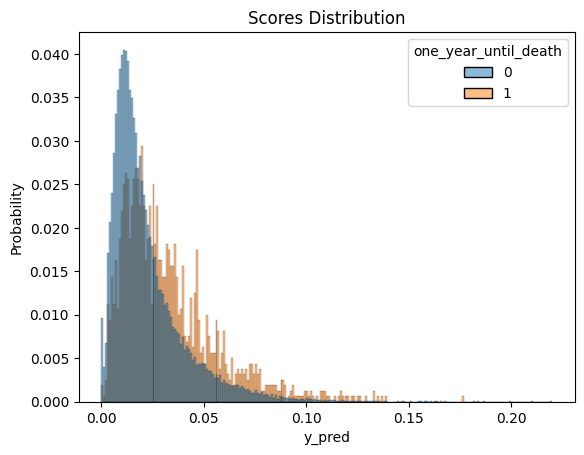

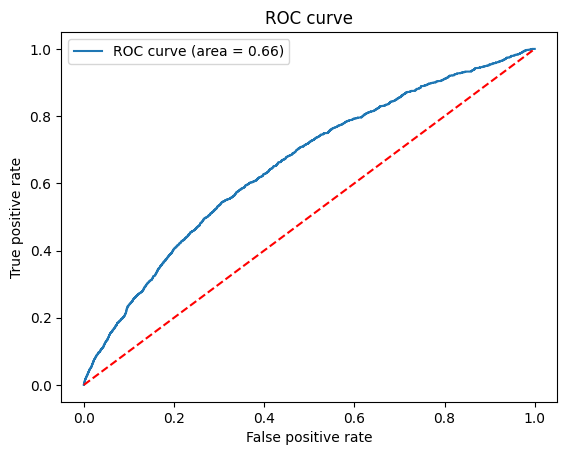

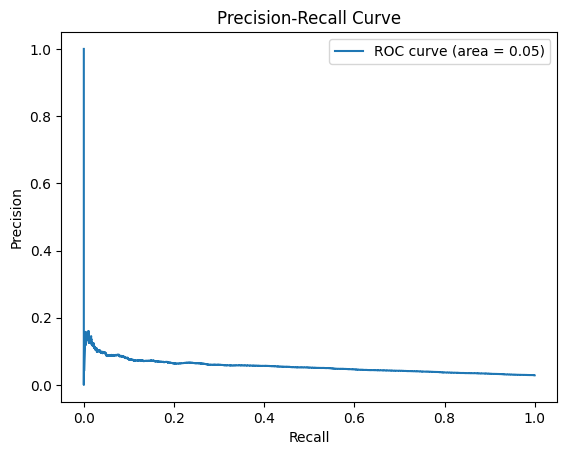

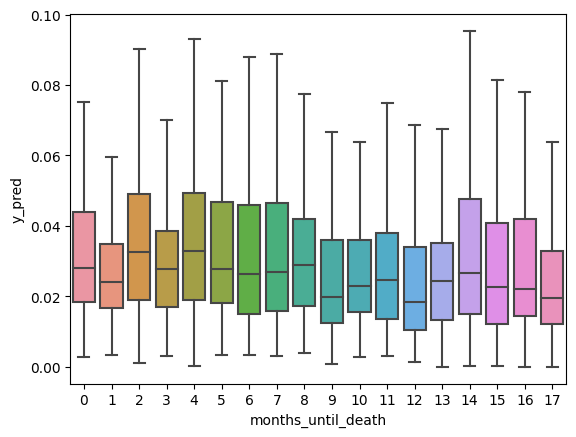

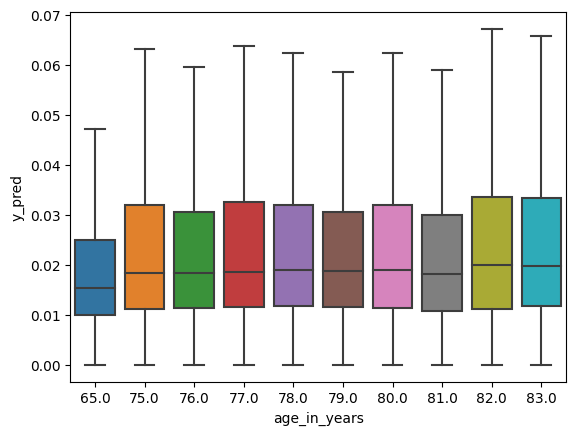

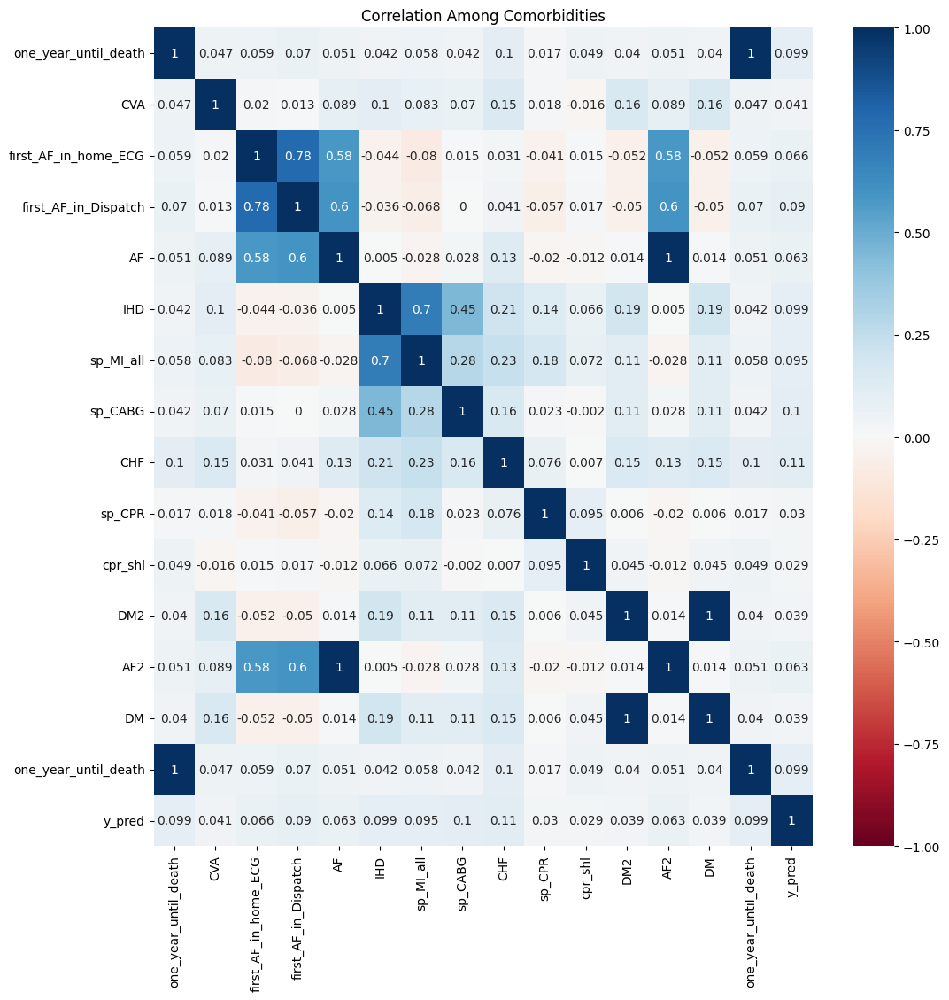

In [3]:
post_reg_analysis(data, 'one_year_until_death', 'y_pred')


In [10]:
display(
    pd.crosstab(data['one_year_until_death'],
                (data['y_pred']>0.020).astype(int),
                normalize='index')
)

y_pred,0,1
one_year_until_death,,
0,0.587688,0.412312
1,0.359151,0.640849


In [5]:
for j in np.linspace(0,0.25,20):
    print(f'confussion mat for {np.round(j,4)}:')
    display(
        pd.crosstab(data['one_year_until_death'],
                    (data['y_pred']>j).astype(int),
                    normalize='index')
    )

confussion mat for 0.0:


y_pred,1
one_year_until_death,
0,1.0
1,1.0


confussion mat for 0.0132:


y_pred,0,1
one_year_until_death,,
0,0.365552,0.634448
1,0.187383,0.812617


confussion mat for 0.0263:


y_pred,0,1
one_year_until_death,,
0,0.718180,0.281820
1,0.489069,0.510931


confussion mat for 0.0395:


y_pred,0,1
one_year_until_death,,
0,0.863213,0.136787
1,0.705809,0.294191


confussion mat for 0.0526:


y_pred,0,1
one_year_until_death,,
0,0.932219,0.067781
1,0.830731,0.169269


confussion mat for 0.0658:


y_pred,0,1
one_year_until_death,,
0,0.966537,0.033463
1,0.902561,0.097439


confussion mat for 0.0789:


y_pred,0,1
one_year_until_death,,
0,0.984884,0.015116
1,0.950656,0.049344


confussion mat for 0.0921:


y_pred,0,1
one_year_until_death,,
0,0.992925,0.007075
1,0.971893,0.028107


confussion mat for 0.1053:


y_pred,0,1
one_year_until_death,,
0,0.996825,0.003175
1,0.983136,0.016864


confussion mat for 0.1184:


y_pred,0,1
one_year_until_death,,
0,0.998626,0.001374
1,0.991880,0.008120


confussion mat for 0.1316:


y_pred,0,1
one_year_until_death,,
0,0.999350,0.000650
1,0.996252,0.003748


confussion mat for 0.1447:


y_pred,0,1
one_year_until_death,,
0,0.999591,0.000409
1,0.999375,0.000625


confussion mat for 0.1579:


y_pred,0,1
one_year_until_death,,
0,0.999759,0.000241
1,0.999375,0.000625


confussion mat for 0.1711:


y_pred,0,1
one_year_until_death,,
0,0.999889,0.000111
1,0.999375,0.000625


confussion mat for 0.1842:


y_pred,0,1
one_year_until_death,,
0,0.999907,0.000093
1,1.000000,0.000000


confussion mat for 0.1974:


y_pred,0,1
one_year_until_death,,
0,0.999944,0.000056
1,1.000000,0.000000


confussion mat for 0.2105:


y_pred,0,1
one_year_until_death,,
0,0.999981,0.000019
1,1.000000,0.000000


confussion mat for 0.2237:


y_pred,0
one_year_until_death,
0,1.0
1,1.0


confussion mat for 0.2368:


y_pred,0
one_year_until_death,
0,1.0
1,1.0


confussion mat for 0.25:


y_pred,0
one_year_until_death,
0,1.0
1,1.0


In [14]:
data['age_in_years']

# data.columns

0        87.0
1        75.0
2        81.0
3        74.0
4        87.0
         ... 
55446    75.0
55447    52.0
55448    61.0
55449    65.0
55450    60.0
Name: age_in_years, Length: 55451, dtype: float64

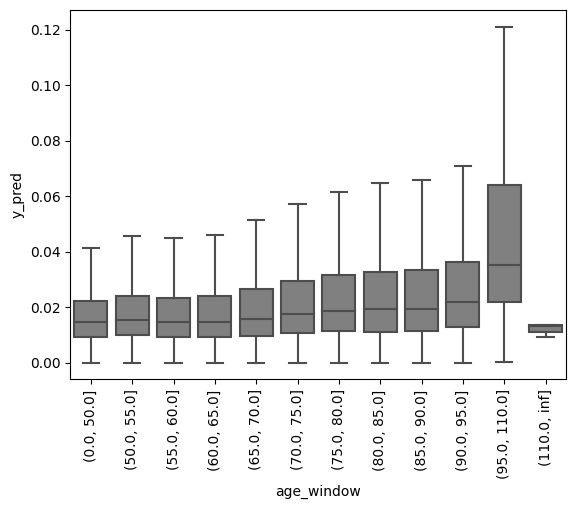

In [32]:
data['age_window'] = pd.cut(data['age_in_years'], bins = [0,50,55,60,65,70,75,80,85,90,95,110,np.inf])
data['age_window'].value_counts()

sns.boxplot(data = data, y = 'y_pred', x = 'age_window',showfliers = False, color='grey')
plt.xticks(rotation = 90)
plt.show()


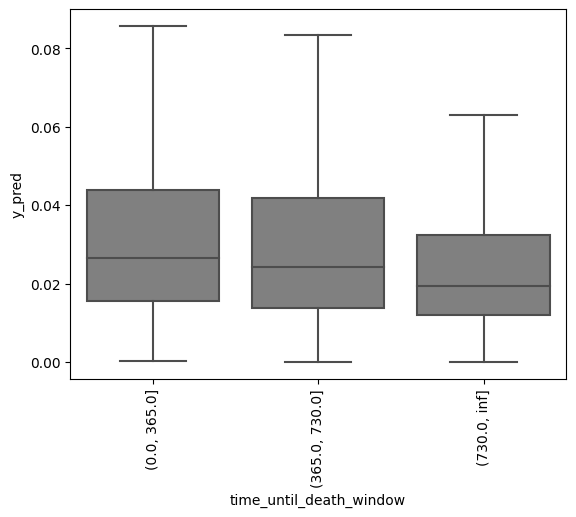

In [35]:
data['time_until_death_window'] = pd.cut(data['days_until_approximate_death'], bins=[0,365,730,np.inf])
sns.boxplot(data = data, y = 'y_pred', x = 'time_until_death_window',showfliers = False, color='grey')
plt.xticks(rotation = 90)
plt.show()

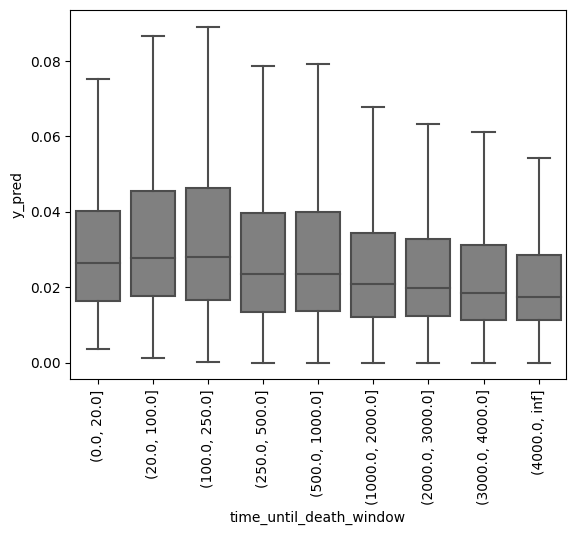

In [36]:
data['age_window'] = pd.cut(data['age_in_years'], bins = [0,50,55,60,65,70,75,80,85,90,95,110,np.inf])
data['age_window'].value_counts()

sns.boxplot(data = data, y = 'y_pred', x = 'age_window',showfliers = False, color='grey')
plt.xticks(rotation = 90)
plt.show()


data['time_until_death_window'] = pd.cut(data['days_until_approximate_death'], bins=[0,20,100,250,500,1000,2000,3000,4000,np.inf])
sns.boxplot(data = data, y = 'y_pred', x = 'time_until_death_window',showfliers = False, color='grey')
plt.xticks(rotation = 90)
plt.show()

display(data[['y_pred','one_year_until_death','age_in_years']].corr())

In [38]:
data[['y_pred','one_year_until_death','age_in_years']].corr()

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.098825,0.147279
one_year_until_death,0.098825,1.000000,0.107431
age_in_years,0.147279,0.107431,1.000000


## Tuning

Params are: (0.001, 0.7, 66.0, 0.0005)


training using device: mps




Within epoch loss (validation) 9.52804: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s] 


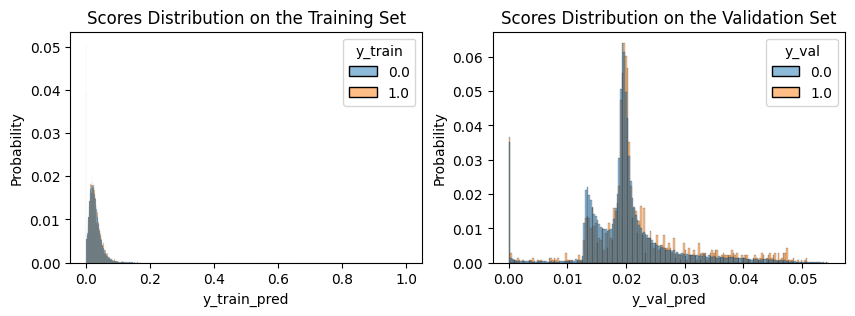

New best aucpr was found, current best aucpr is 0.0334
---------------------------------------------
Epoch: 01 | Time: 9m 32s
	Train Loss: 13.710
	 Val. Loss: 9.528
	 ROC-AUC: 0.555
	 PR-AUC: 0.033
	 TPR for FPR=0.6 Budget: 0.679
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.11339: 100%|██████████| 416/416 [01:00<00:00,  6.93it/s] 


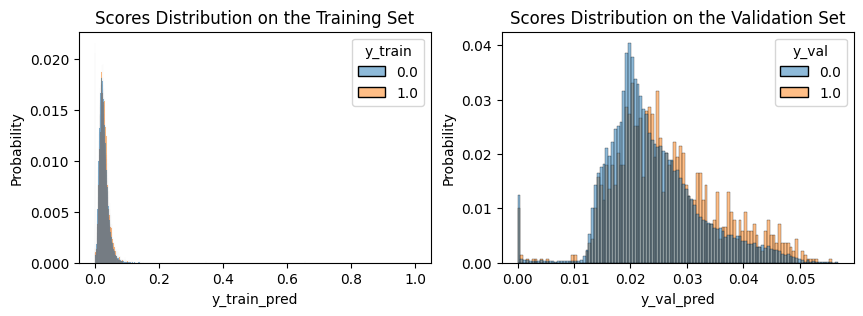

New best aucpr was found, current best aucpr is 0.0376
---------------------------------------------
Epoch: 02 | Time: 9m 29s
	Train Loss: 13.528
	 Val. Loss: 7.113
	 ROC-AUC: 0.584
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.705
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.36038: 100%|██████████| 416/416 [01:00<00:00,  6.89it/s]


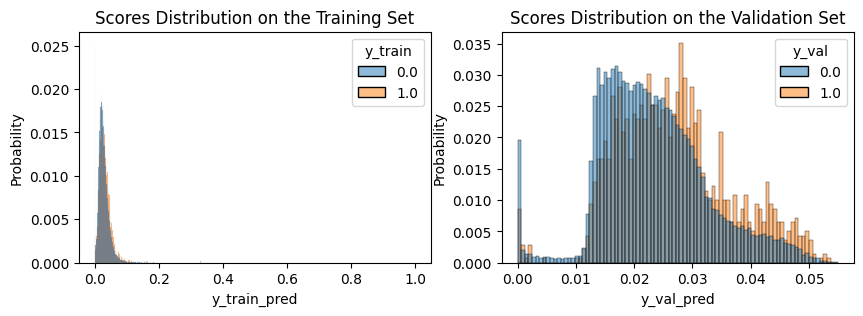

New best aucpr was found, current best aucpr is 0.0393
---------------------------------------------
Epoch: 03 | Time: 9m 30s
	Train Loss: 9.234
	 Val. Loss: 10.360
	 ROC-AUC: 0.606
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.735
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.33113: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s]


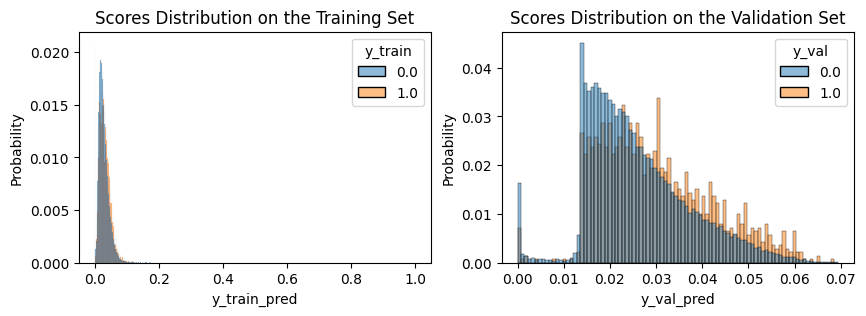

New best aucpr was found, current best aucpr is 0.0398
---------------------------------------------
Epoch: 04 | Time: 9m 27s
	Train Loss: 9.991
	 Val. Loss: 10.331
	 ROC-AUC: 0.602
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.732
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.49019: 100%|██████████| 416/416 [01:02<00:00,  6.65it/s]


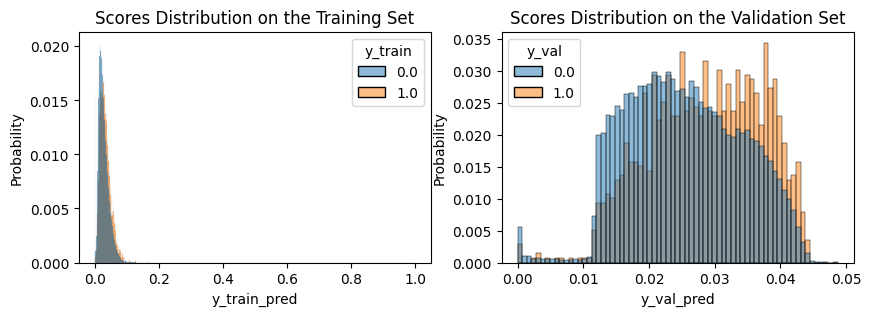

---------------------------------------------
Epoch: 05 | Time: 9m 54s
	Train Loss: 10.213
	 Val. Loss: 9.490
	 ROC-AUC: 0.606
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.742
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 12.16169: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


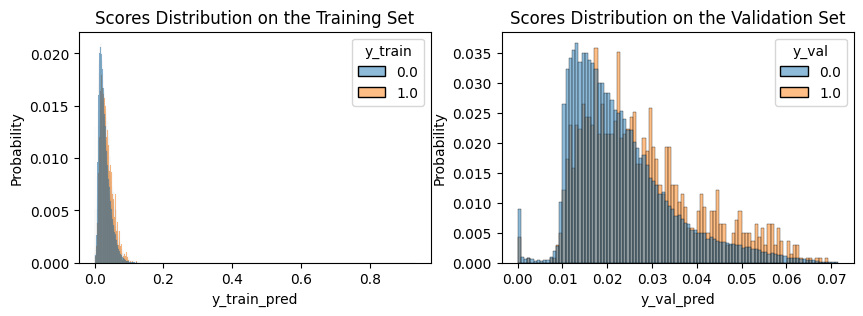

New best aucpr was found, current best aucpr is 0.0411
---------------------------------------------
Epoch: 06 | Time: 10m 19s
	Train Loss: 9.435
	 Val. Loss: 12.162
	 ROC-AUC: 0.615
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.735
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.56585: 100%|██████████| 416/416 [01:00<00:00,  6.83it/s]


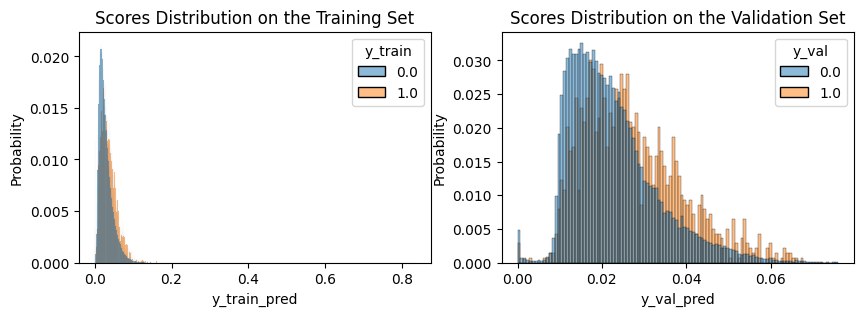

New best aucpr was found, current best aucpr is 0.0417
---------------------------------------------
Epoch: 07 | Time: 10m 33s
	Train Loss: 9.171
	 Val. Loss: 8.566
	 ROC-AUC: 0.624
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.746
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 12.11566: 100%|██████████| 416/416 [01:02<00:00,  6.69it/s]


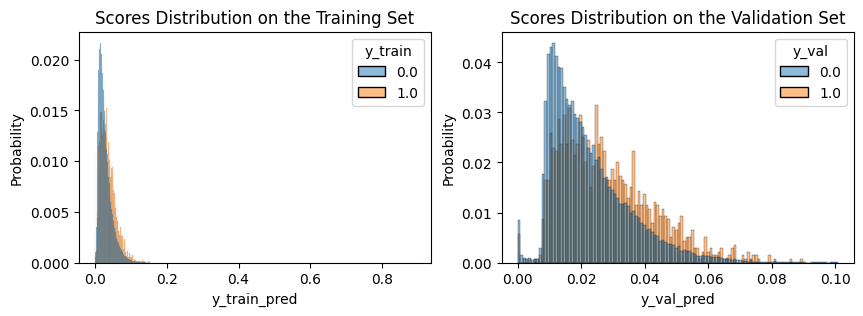

---------------------------------------------
Epoch: 08 | Time: 10m 47s
	Train Loss: 9.234
	 Val. Loss: 12.116
	 ROC-AUC: 0.625
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.755
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.55519: 100%|██████████| 416/416 [01:02<00:00,  6.62it/s]


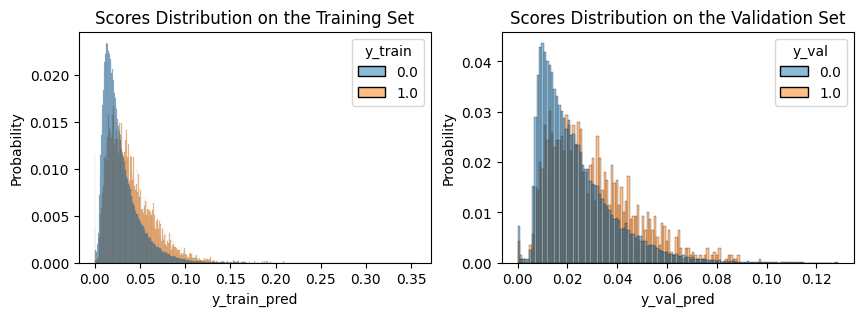

New best aucpr was found, current best aucpr is 0.0422
---------------------------------------------
Epoch: 09 | Time: 10m 48s
	Train Loss: 8.519
	 Val. Loss: 10.555
	 ROC-AUC: 0.630
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.767
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 11.05451: 100%|██████████| 416/416 [01:01<00:00,  6.74it/s]


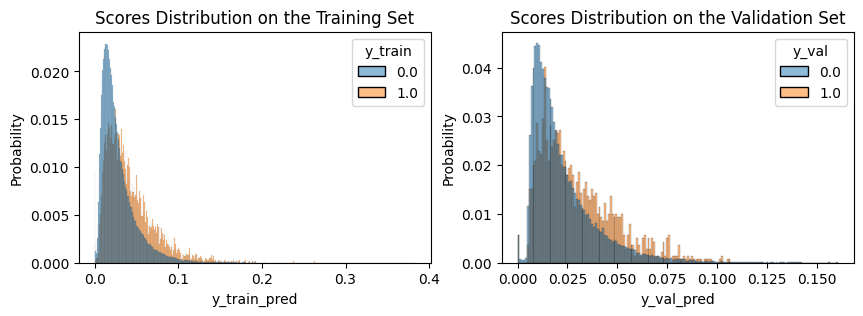

---------------------------------------------
Epoch: 10 | Time: 10m 50s
	Train Loss: 8.287
	 Val. Loss: 11.055
	 ROC-AUC: 0.631
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.759
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 11.50778: 100%|██████████| 416/416 [01:04<00:00,  6.43it/s]


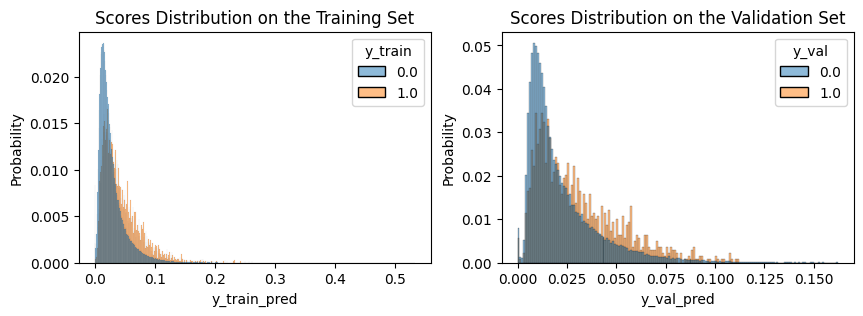

---------------------------------------------
Epoch: 11 | Time: 11m 1s
	Train Loss: 8.324
	 Val. Loss: 11.508
	 ROC-AUC: 0.633
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.770
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 14.7722: 100%|██████████| 416/416 [01:01<00:00,  6.76it/s] 


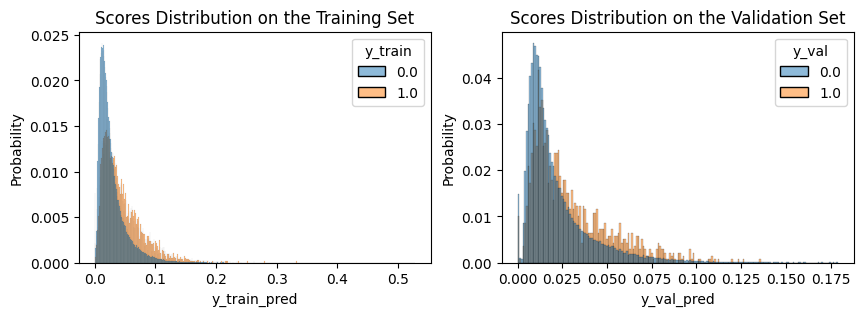

---------------------------------------------
Epoch: 12 | Time: 10m 41s
	Train Loss: 8.743
	 Val. Loss: 14.772
	 ROC-AUC: 0.627
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.762
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.1896: 100%|██████████| 416/416 [01:02<00:00,  6.69it/s] 


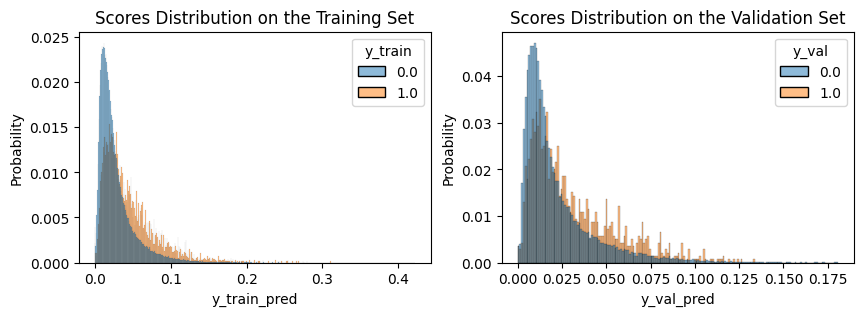

---------------------------------------------
Epoch: 13 | Time: 10m 15s
	Train Loss: 9.390
	 Val. Loss: 10.190
	 ROC-AUC: 0.633
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.770
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.88067: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


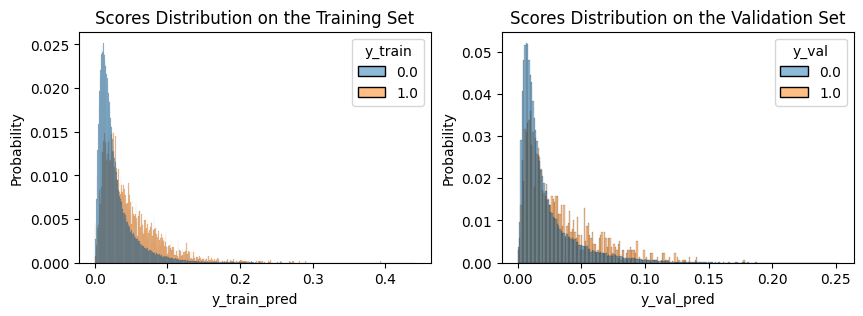

New best aucpr was found, current best aucpr is 0.0427
---------------------------------------------
Epoch: 14 | Time: 10m 19s
	Train Loss: 9.664
	 Val. Loss: 7.881
	 ROC-AUC: 0.629
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.757
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.63854: 100%|██████████| 416/416 [01:00<00:00,  6.83it/s]


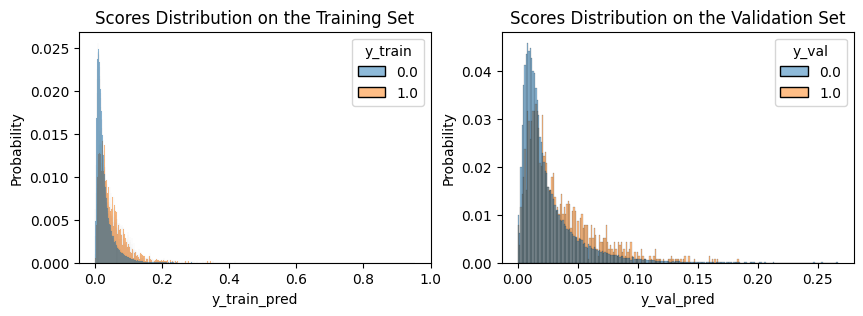

---------------------------------------------
Epoch: 15 | Time: 10m 21s
	Train Loss: 8.721
	 Val. Loss: 8.639
	 ROC-AUC: 0.623
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.763
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.88849: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s]


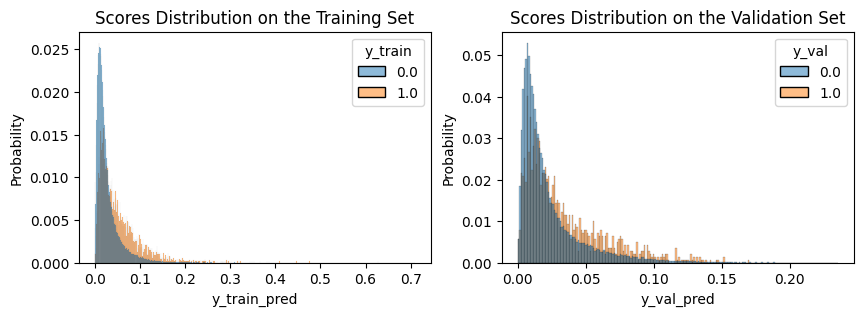

---------------------------------------------
Epoch: 16 | Time: 10m 22s
	Train Loss: 9.902
	 Val. Loss: 10.888
	 ROC-AUC: 0.630
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.764
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.38111: 100%|██████████| 416/416 [00:59<00:00,  6.98it/s] 


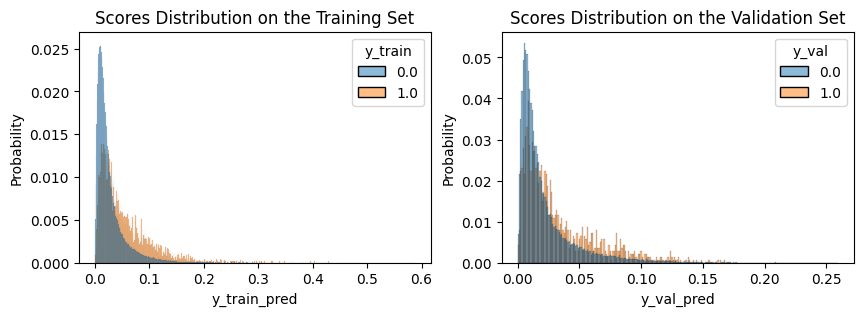

New best aucpr was found, current best aucpr is 0.0437
---------------------------------------------
Epoch: 17 | Time: 10m 8s
	Train Loss: 8.537
	 Val. Loss: 9.381
	 ROC-AUC: 0.632
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.761
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.64119: 100%|██████████| 416/416 [01:01<00:00,  6.77it/s]


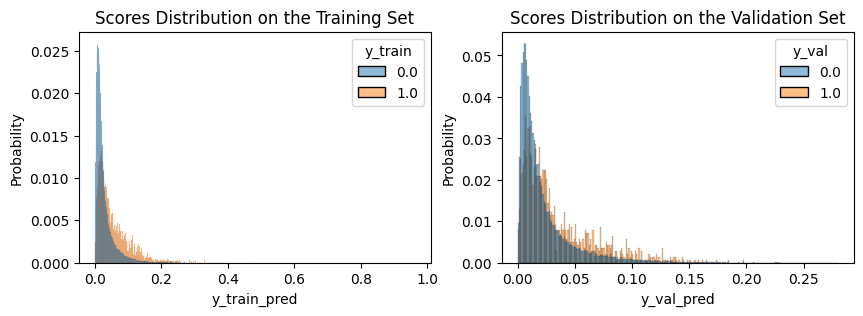

New best aucpr was found, current best aucpr is 0.0438
---------------------------------------------
Epoch: 18 | Time: 9m 30s
	Train Loss: 9.379
	 Val. Loss: 9.641
	 ROC-AUC: 0.635
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.770
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.85812: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s] 


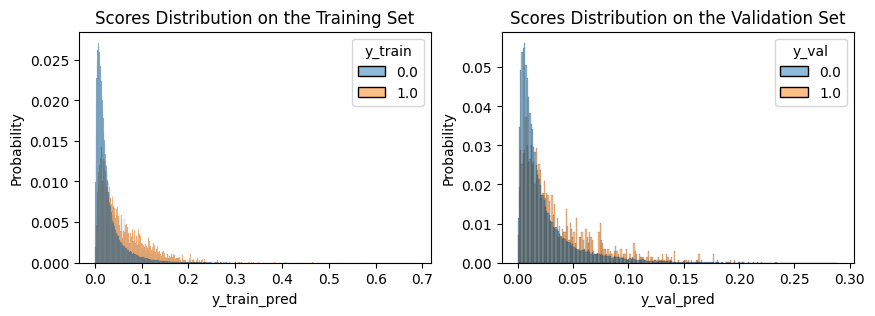

---------------------------------------------
Epoch: 19 | Time: 9m 28s
	Train Loss: 8.760
	 Val. Loss: 8.858
	 ROC-AUC: 0.632
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.771
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.86789: 100%|██████████| 416/416 [01:00<00:00,  6.88it/s] 


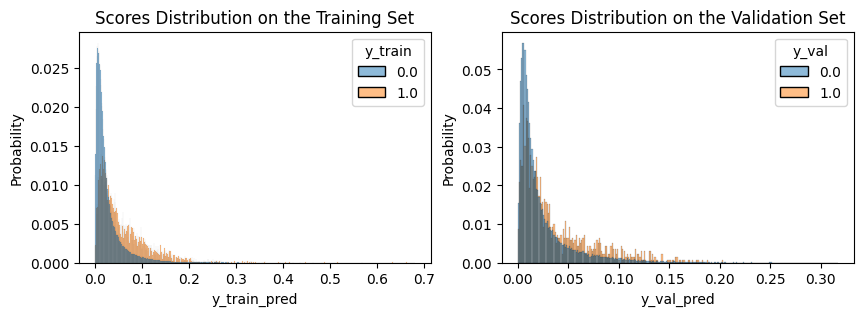

---------------------------------------------
Epoch: 20 | Time: 9m 26s
	Train Loss: 8.273
	 Val. Loss: 8.868
	 ROC-AUC: 0.631
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.760
	 Best Val. Loss: inf
---------------------------------------------
Params are: (0.001, 0.2, 66.0, 0.001)


training using device: mps




Within epoch loss (validation) 7.4512: 100%|██████████| 416/416 [01:01<00:00,  6.82it/s] 


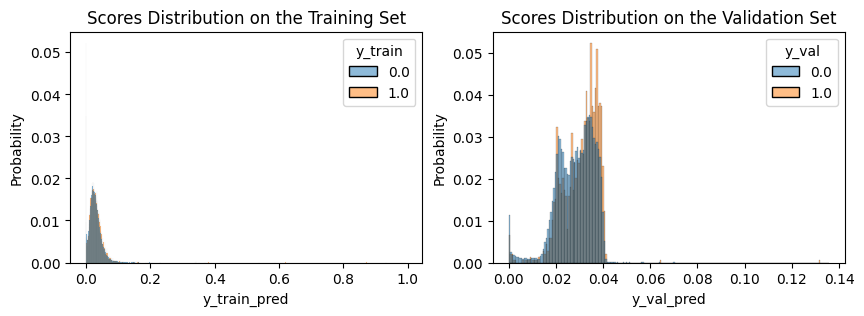

New best aucpr was found, current best aucpr is 0.0369
---------------------------------------------
Epoch: 01 | Time: 9m 48s
	Train Loss: 10.383
	 Val. Loss: 7.451
	 ROC-AUC: 0.589
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.720
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.63884: 100%|██████████| 416/416 [01:02<00:00,  6.64it/s]


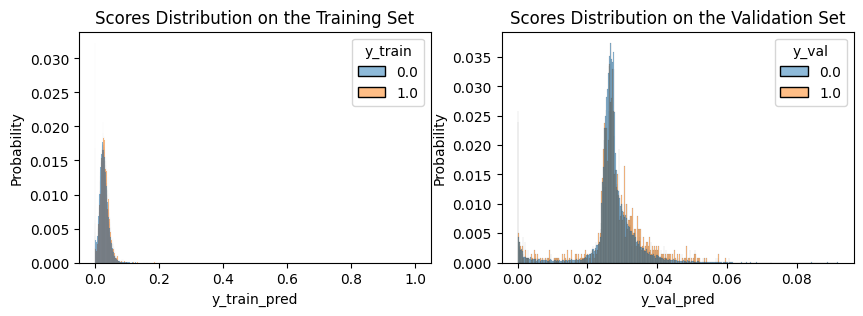

---------------------------------------------
Epoch: 02 | Time: 10m 16s
	Train Loss: 11.861
	 Val. Loss: 7.639
	 ROC-AUC: 0.544
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.639
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.32509: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


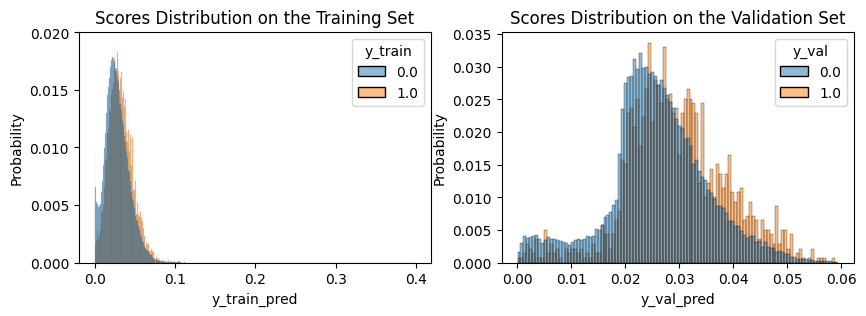

New best aucpr was found, current best aucpr is 0.0395
---------------------------------------------
Epoch: 03 | Time: 9m 56s
	Train Loss: 10.018
	 Val. Loss: 8.325
	 ROC-AUC: 0.610
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.747
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.14949: 100%|██████████| 416/416 [01:00<00:00,  6.89it/s]


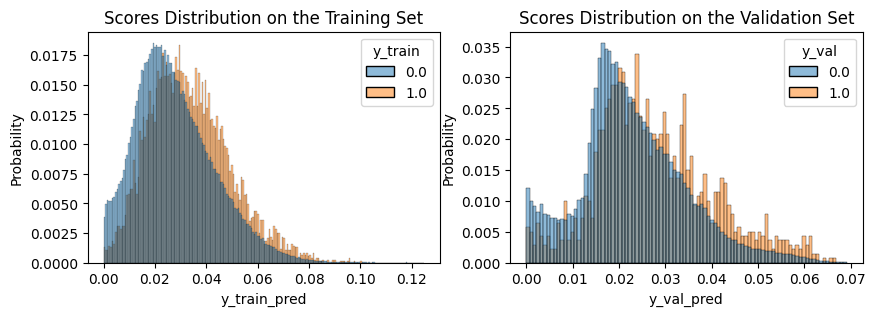

New best aucpr was found, current best aucpr is 0.0408
---------------------------------------------
Epoch: 04 | Time: 10m 3s
	Train Loss: 8.565
	 Val. Loss: 7.149
	 ROC-AUC: 0.611
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.748
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.85504: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


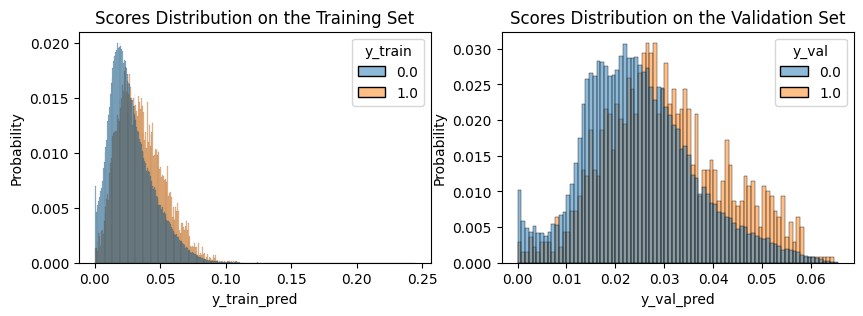

New best aucpr was found, current best aucpr is 0.0437
---------------------------------------------
Epoch: 05 | Time: 9m 58s
	Train Loss: 10.021
	 Val. Loss: 10.855
	 ROC-AUC: 0.628
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.763
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.42648: 100%|██████████| 416/416 [01:02<00:00,  6.69it/s]


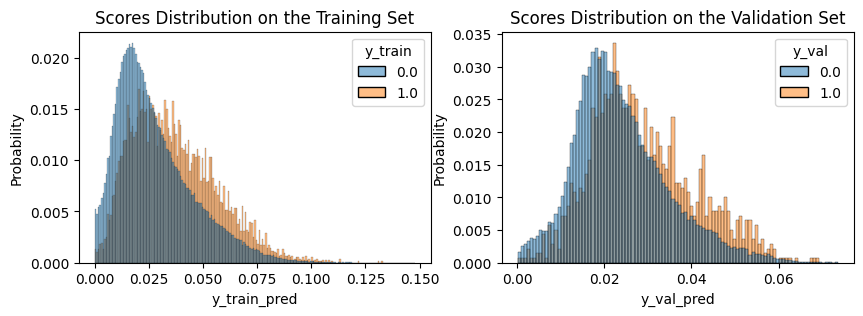

---------------------------------------------
Epoch: 06 | Time: 9m 54s
	Train Loss: 8.979
	 Val. Loss: 10.426
	 ROC-AUC: 0.627
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.92029: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


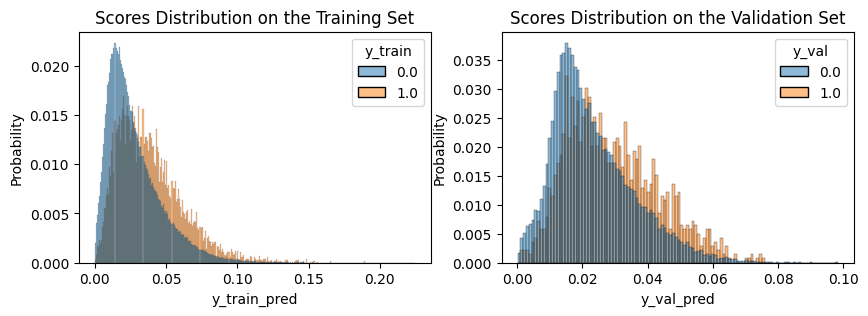

---------------------------------------------
Epoch: 07 | Time: 10m 2s
	Train Loss: 8.259
	 Val. Loss: 5.920
	 ROC-AUC: 0.631
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.66686: 100%|██████████| 416/416 [01:01<00:00,  6.72it/s]


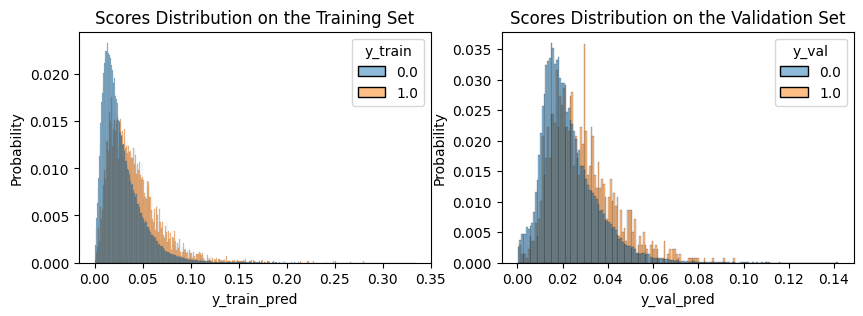

---------------------------------------------
Epoch: 08 | Time: 9m 53s
	Train Loss: 9.634
	 Val. Loss: 7.667
	 ROC-AUC: 0.630
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.763
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.86778: 100%|██████████| 416/416 [01:01<00:00,  6.76it/s]


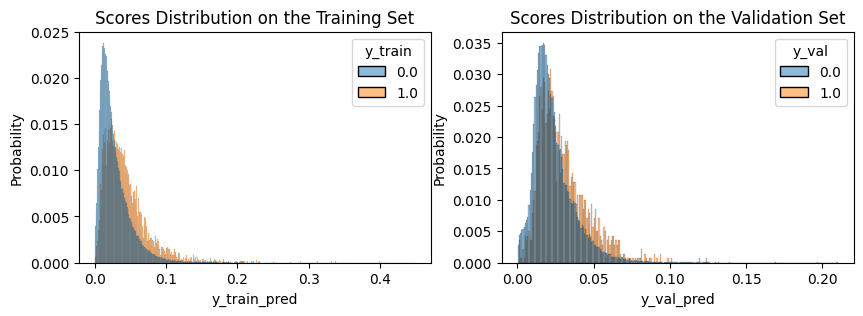

---------------------------------------------
Epoch: 09 | Time: 10m 6s
	Train Loss: 9.348
	 Val. Loss: 7.868
	 ROC-AUC: 0.629
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.755
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.52161: 100%|██████████| 416/416 [01:01<00:00,  6.73it/s]


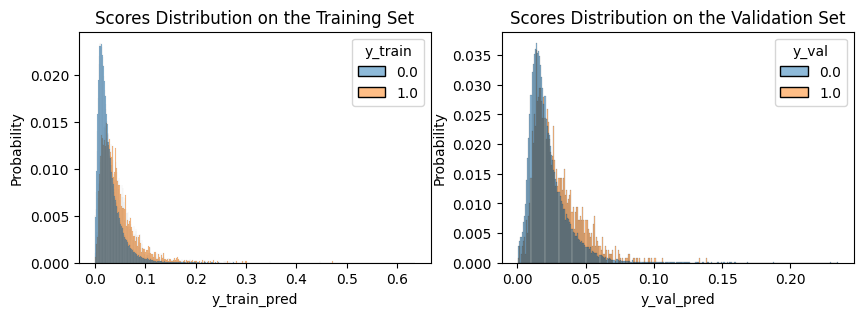

---------------------------------------------
Epoch: 10 | Time: 10m 19s
	Train Loss: 8.249
	 Val. Loss: 6.522
	 ROC-AUC: 0.626
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.752
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.77587: 100%|██████████| 416/416 [01:03<00:00,  6.59it/s]


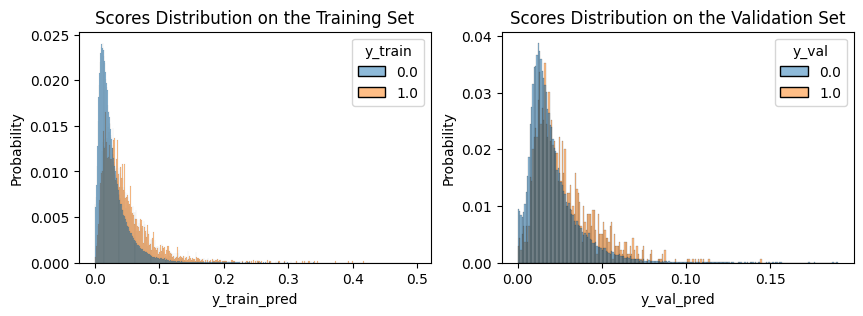

Params are: (0.01, 0.7, 33.0, 0.0005)


training using device: mps




Within epoch loss (validation) 3.73061: 100%|██████████| 416/416 [01:01<00:00,  6.76it/s]


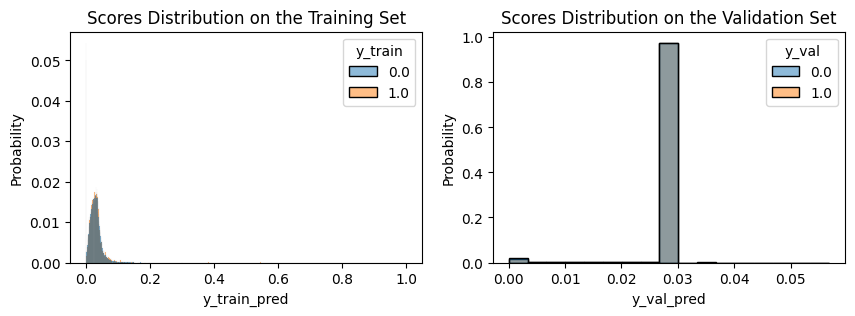

New best aucpr was found, current best aucpr is 0.0342
---------------------------------------------
Epoch: 01 | Time: 10m 0s
	Train Loss: 10.842
	 Val. Loss: 3.731
	 ROC-AUC: 0.500
	 PR-AUC: 0.034
	 TPR for FPR=0.6 Budget: 0.974
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.75954: 100%|██████████| 416/416 [01:04<00:00,  6.41it/s]


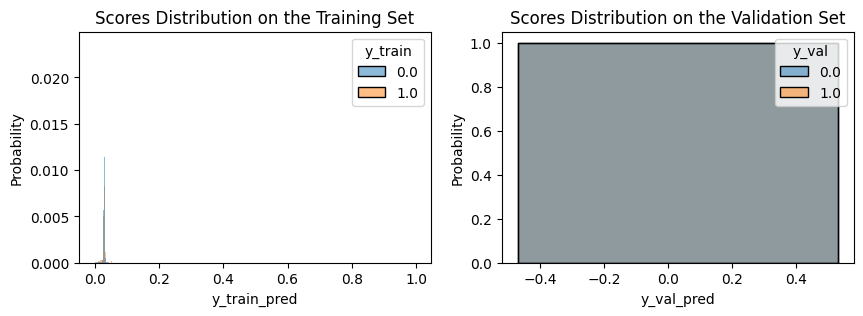

New best aucpr was found, current best aucpr is 0.5131
---------------------------------------------
Epoch: 02 | Time: 11m 20s
	Train Loss: 4.430
	 Val. Loss: 3.760
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.75972: 100%|██████████| 416/416 [01:01<00:00,  6.77it/s]


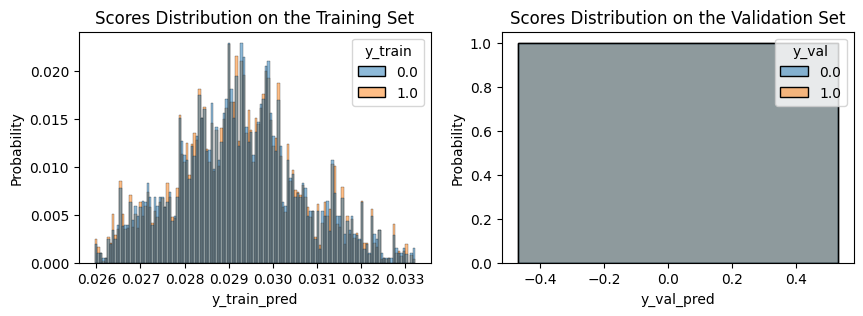

---------------------------------------------
Epoch: 03 | Time: 9m 40s
	Train Loss: 5.275
	 Val. Loss: 3.760
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.0367: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s] 


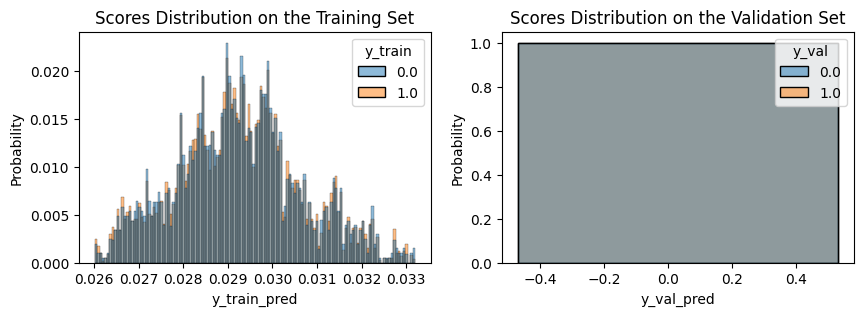

---------------------------------------------
Epoch: 04 | Time: 9m 46s
	Train Loss: 4.423
	 Val. Loss: 4.037
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.31366: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


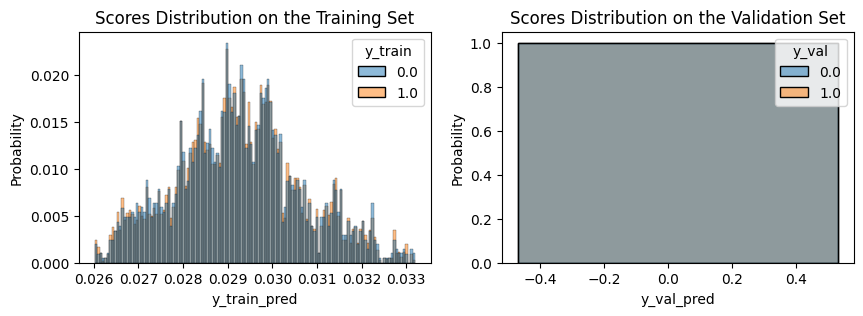

---------------------------------------------
Epoch: 05 | Time: 10m 15s
	Train Loss: 4.299
	 Val. Loss: 4.314
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 2.92887: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s]


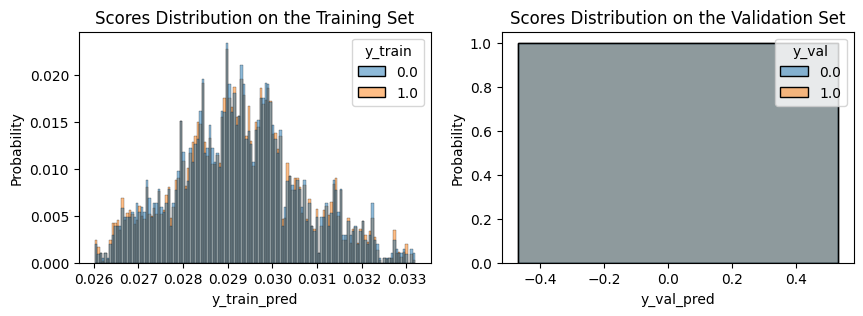

---------------------------------------------
Epoch: 06 | Time: 10m 20s
	Train Loss: 4.423
	 Val. Loss: 2.929
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.31366: 100%|██████████| 416/416 [01:03<00:00,  6.53it/s]


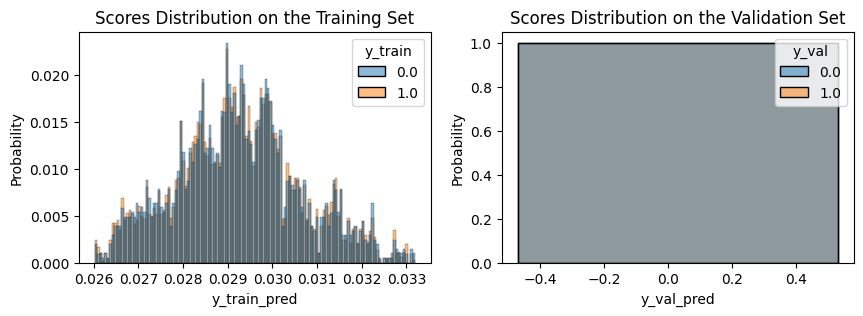

---------------------------------------------
Epoch: 07 | Time: 10m 44s
	Train Loss: 4.698
	 Val. Loss: 4.314
	 ROC-AUC: 0.500
	 PR-AUC: 0.513
	 TPR for FPR=0.6 Budget: 1.000
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.75975: 100%|██████████| 416/416 [01:01<00:00,  6.76it/s]


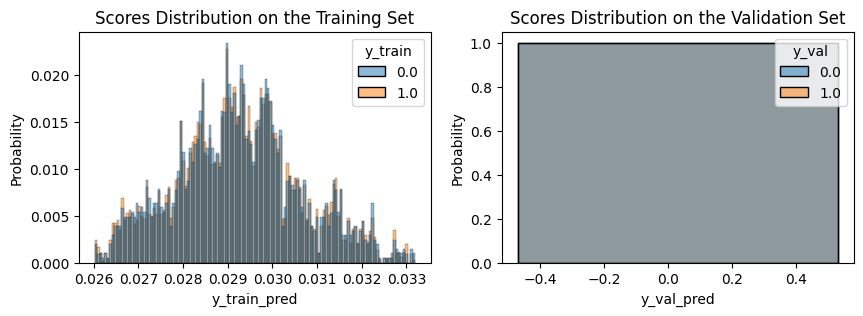

Params are: (0.005, 0.5, 50.0, 0)


training using device: mps




Within epoch loss (validation) 10.16469: 100%|██████████| 416/416 [01:02<00:00,  6.66it/s]


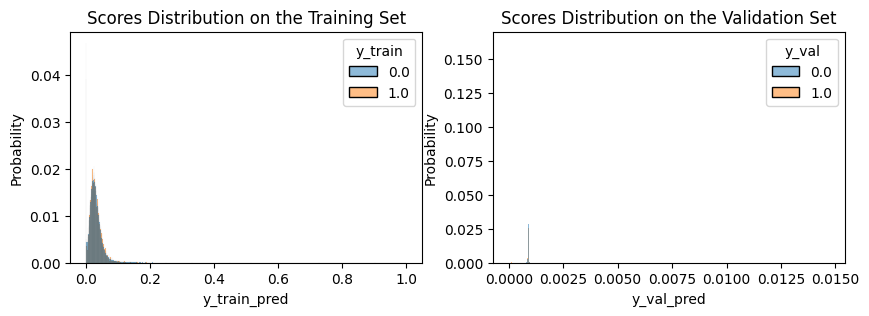

New best aucpr was found, current best aucpr is 0.0271
---------------------------------------------
Epoch: 01 | Time: 11m 16s
	Train Loss: 11.903
	 Val. Loss: 10.165
	 ROC-AUC: 0.520
	 PR-AUC: 0.027
	 TPR for FPR=0.6 Budget: 0.639
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.66662: 100%|██████████| 416/416 [01:02<00:00,  6.64it/s]


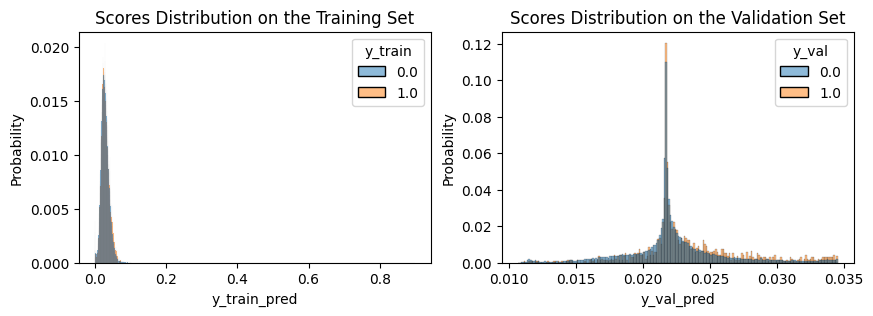

New best aucpr was found, current best aucpr is 0.0352
---------------------------------------------
Epoch: 02 | Time: 10m 59s
	Train Loss: 7.170
	 Val. Loss: 5.667
	 ROC-AUC: 0.583
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.713
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.78505: 100%|██████████| 416/416 [01:04<00:00,  6.48it/s]


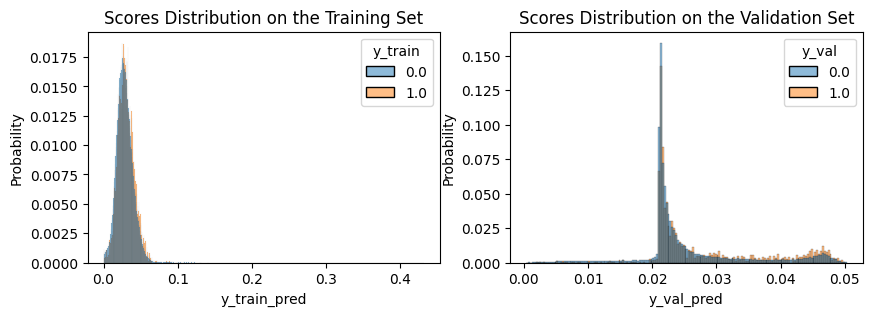

---------------------------------------------
Epoch: 03 | Time: 11m 17s
	Train Loss: 7.476
	 Val. Loss: 7.785
	 ROC-AUC: 0.580
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.679
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.33605: 100%|██████████| 416/416 [01:03<00:00,  6.60it/s]


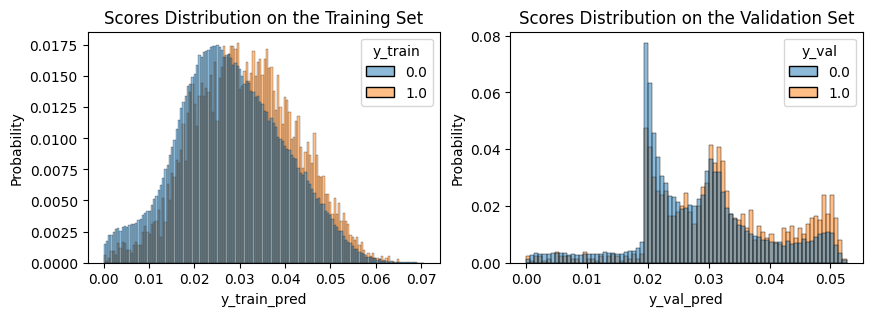

New best aucpr was found, current best aucpr is 0.0385
---------------------------------------------
Epoch: 04 | Time: 11m 0s
	Train Loss: 7.678
	 Val. Loss: 6.336
	 ROC-AUC: 0.606
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.741
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.60814: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


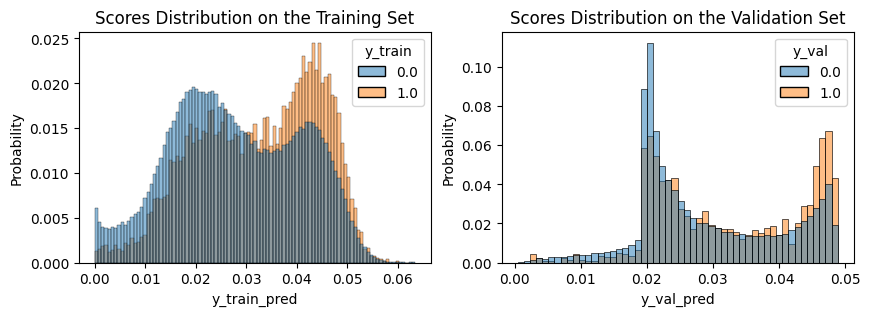

---------------------------------------------
Epoch: 05 | Time: 10m 47s
	Train Loss: 7.218
	 Val. Loss: 5.608
	 ROC-AUC: 0.601
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.738
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.48766: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


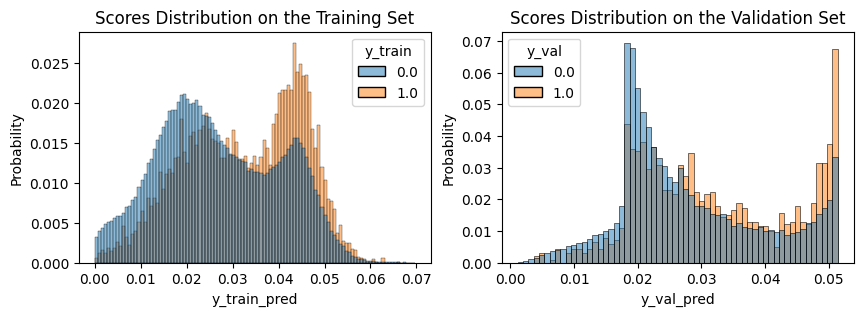

---------------------------------------------
Epoch: 06 | Time: 10m 49s
	Train Loss: 6.764
	 Val. Loss: 6.488
	 ROC-AUC: 0.606
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.748
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.4154: 100%|██████████| 416/416 [01:00<00:00,  6.82it/s] 


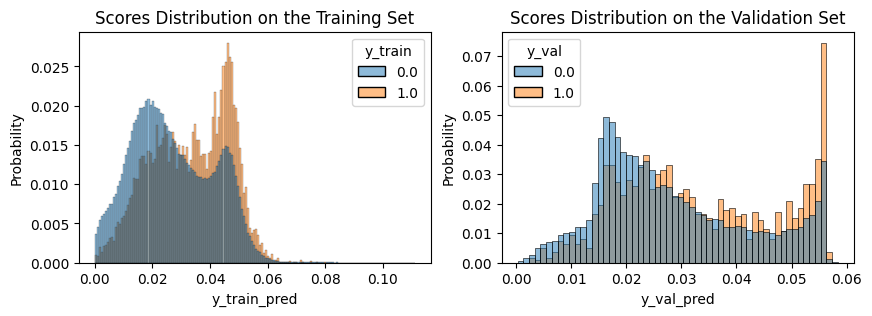

New best aucpr was found, current best aucpr is 0.0387
---------------------------------------------
Epoch: 07 | Time: 10m 33s
	Train Loss: 7.614
	 Val. Loss: 5.415
	 ROC-AUC: 0.607
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.751
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.32848: 100%|██████████| 416/416 [01:01<00:00,  6.73it/s]


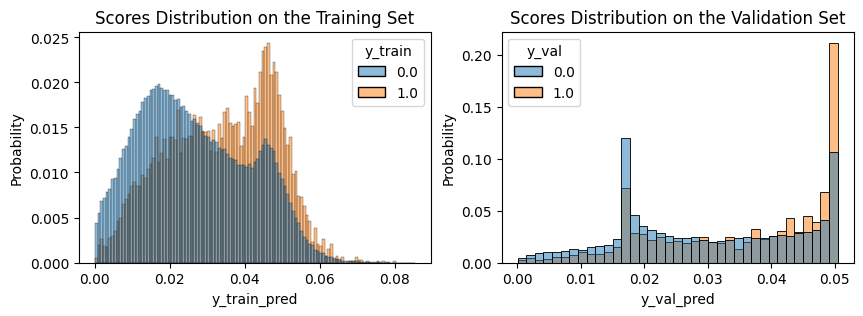

New best aucpr was found, current best aucpr is 0.0398
---------------------------------------------
Epoch: 08 | Time: 10m 44s
	Train Loss: 7.346
	 Val. Loss: 5.328
	 ROC-AUC: 0.620
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.96967: 100%|██████████| 416/416 [01:00<00:00,  6.87it/s]


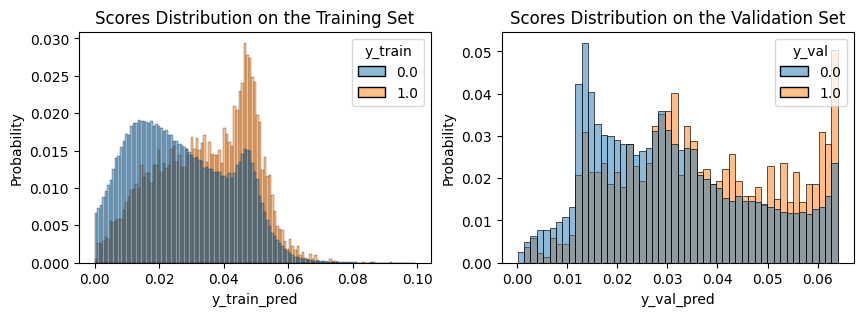

---------------------------------------------
Epoch: 09 | Time: 10m 26s
	Train Loss: 7.236
	 Val. Loss: 5.970
	 ROC-AUC: 0.608
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.03949: 100%|██████████| 416/416 [00:59<00:00,  7.00it/s]


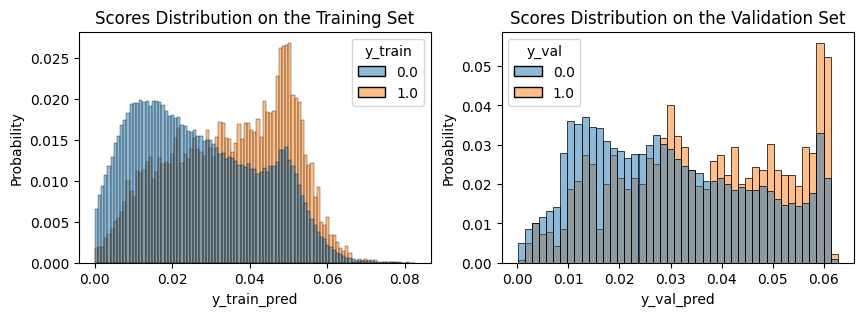

---------------------------------------------
Epoch: 10 | Time: 9m 24s
	Train Loss: 7.174
	 Val. Loss: 8.039
	 ROC-AUC: 0.613
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.04354: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s]


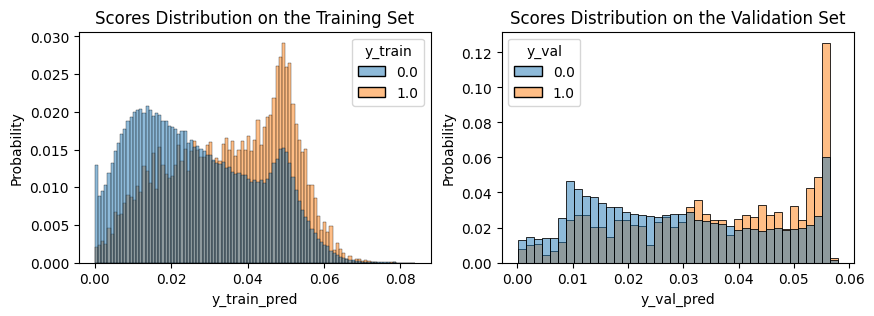

New best aucpr was found, current best aucpr is 0.0408
---------------------------------------------
Epoch: 11 | Time: 9m 18s
	Train Loss: 7.095
	 Val. Loss: 6.044
	 ROC-AUC: 0.623
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.40706: 100%|██████████| 416/416 [00:59<00:00,  6.96it/s]


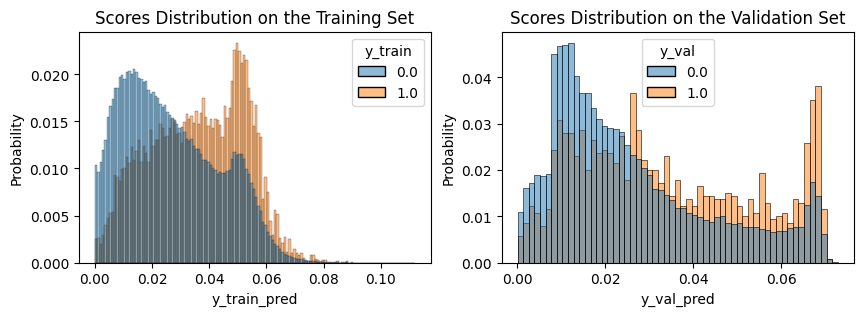

---------------------------------------------
Epoch: 12 | Time: 9m 16s
	Train Loss: 8.079
	 Val. Loss: 5.407
	 ROC-AUC: 0.622
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.760
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.41945: 100%|██████████| 416/416 [00:59<00:00,  6.97it/s]


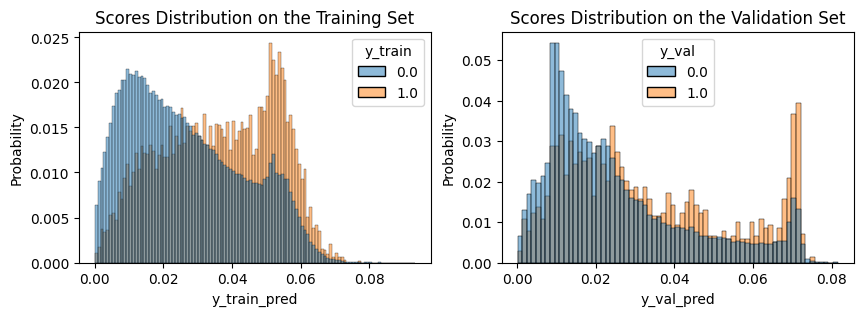

New best aucpr was found, current best aucpr is 0.0412
---------------------------------------------
Epoch: 13 | Time: 9m 17s
	Train Loss: 7.408
	 Val. Loss: 6.419
	 ROC-AUC: 0.620
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.757
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.13473: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s]


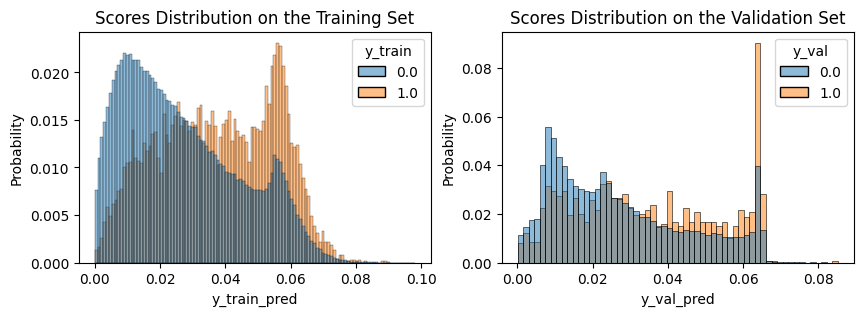

---------------------------------------------
Epoch: 14 | Time: 9m 25s
	Train Loss: 8.199
	 Val. Loss: 8.135
	 ROC-AUC: 0.615
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.752
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.11345: 100%|██████████| 416/416 [00:59<00:00,  6.95it/s]


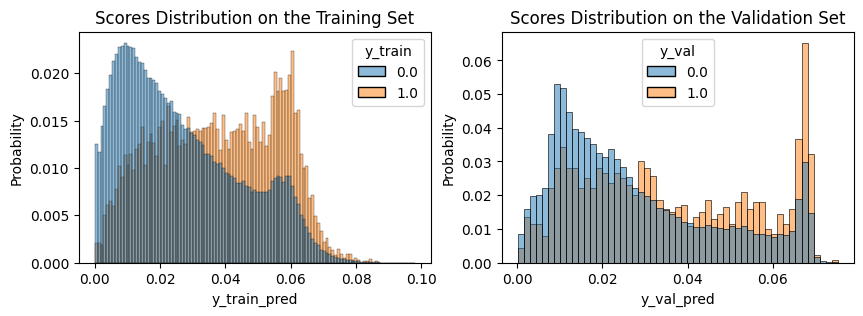

---------------------------------------------
Epoch: 15 | Time: 9m 25s
	Train Loss: 6.812
	 Val. Loss: 6.113
	 ROC-AUC: 0.621
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.81221: 100%|██████████| 416/416 [01:01<00:00,  6.77it/s]


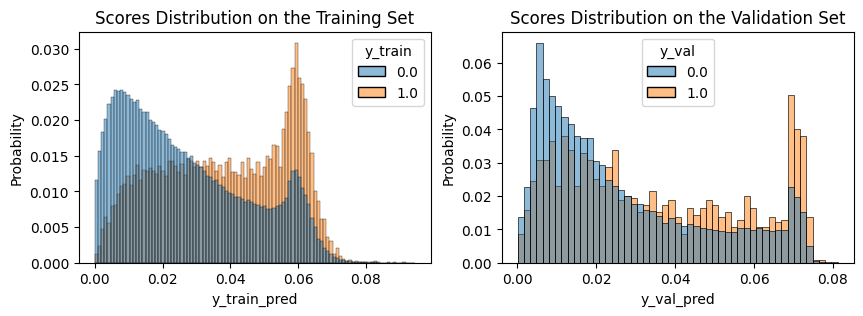

---------------------------------------------
Epoch: 16 | Time: 9m 40s
	Train Loss: 7.113
	 Val. Loss: 6.812
	 ROC-AUC: 0.617
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.750
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.84645: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


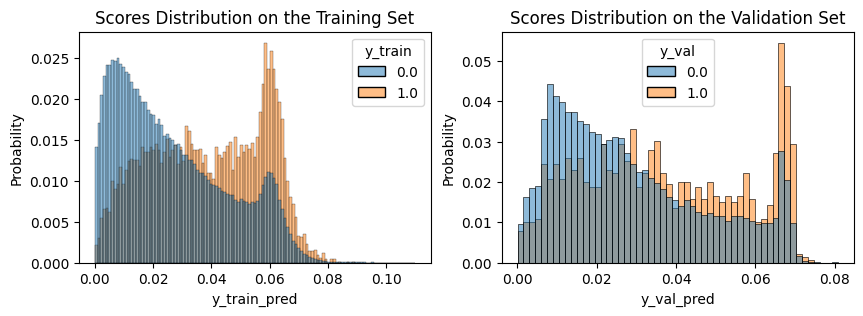

New best aucpr was found, current best aucpr is 0.0412
---------------------------------------------
Epoch: 17 | Time: 9m 26s
	Train Loss: 7.091
	 Val. Loss: 6.846
	 ROC-AUC: 0.620
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.89047: 100%|██████████| 416/416 [01:01<00:00,  6.81it/s]


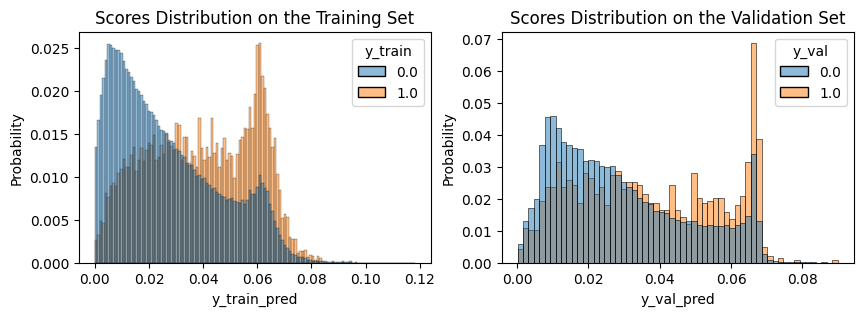

New best aucpr was found, current best aucpr is 0.0423
---------------------------------------------
Epoch: 18 | Time: 9m 27s
	Train Loss: 8.695
	 Val. Loss: 5.890
	 ROC-AUC: 0.621
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.749
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.2055: 100%|██████████| 416/416 [01:03<00:00,  6.53it/s] 


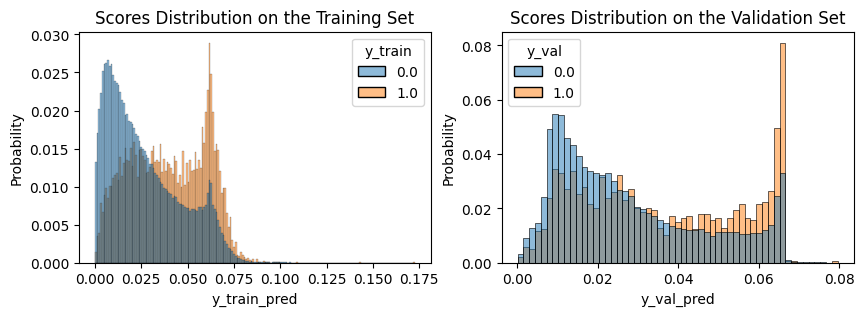

New best aucpr was found, current best aucpr is 0.0423
---------------------------------------------
Epoch: 19 | Time: 9m 30s
	Train Loss: 7.458
	 Val. Loss: 5.205
	 ROC-AUC: 0.623
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.750
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.27631: 100%|██████████| 416/416 [01:01<00:00,  6.73it/s]


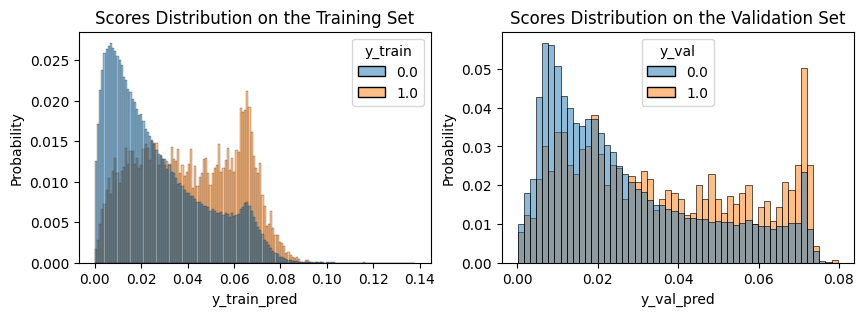

---------------------------------------------
Epoch: 20 | Time: 9m 26s
	Train Loss: 6.592
	 Val. Loss: 6.276
	 ROC-AUC: 0.622
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------
Params are: (0.001, 0.5, 33.0, 0.0001)


training using device: mps




Within epoch loss (validation) 4.90436: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


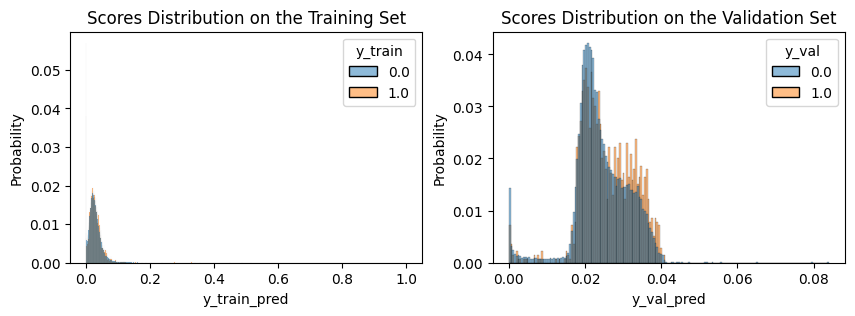

New best aucpr was found, current best aucpr is 0.0335
---------------------------------------------
Epoch: 01 | Time: 9m 25s
	Train Loss: 5.200
	 Val. Loss: 4.904
	 ROC-AUC: 0.565
	 PR-AUC: 0.034
	 TPR for FPR=0.6 Budget: 0.678
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.98936: 100%|██████████| 416/416 [01:00<00:00,  6.84it/s]


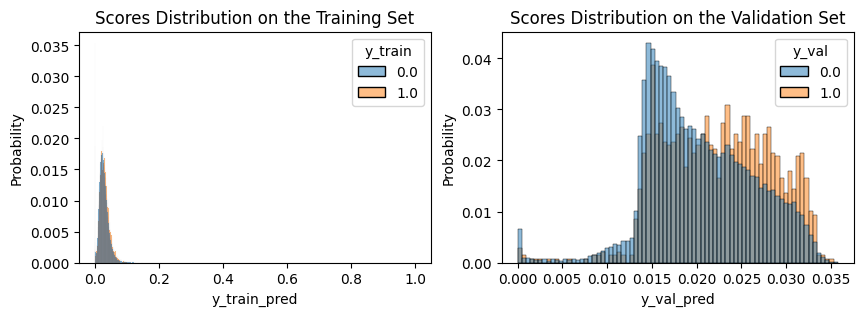

New best aucpr was found, current best aucpr is 0.0374
---------------------------------------------
Epoch: 02 | Time: 9m 37s
	Train Loss: 4.765
	 Val. Loss: 3.989
	 ROC-AUC: 0.604
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.737
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.42442: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s]


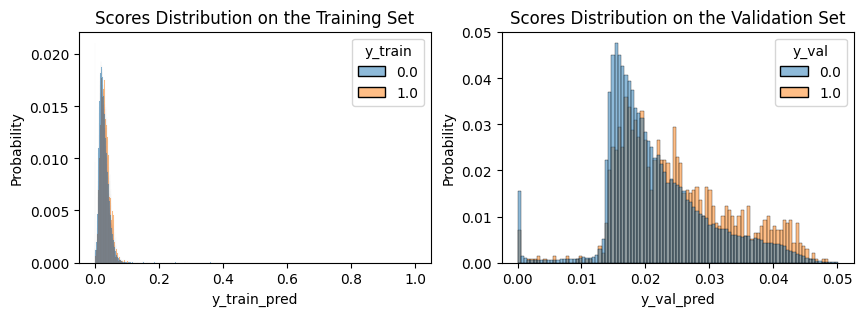

New best aucpr was found, current best aucpr is 0.0403
---------------------------------------------
Epoch: 03 | Time: 9m 35s
	Train Loss: 4.346
	 Val. Loss: 4.424
	 ROC-AUC: 0.613
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.747
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.95799: 100%|██████████| 416/416 [01:03<00:00,  6.59it/s]


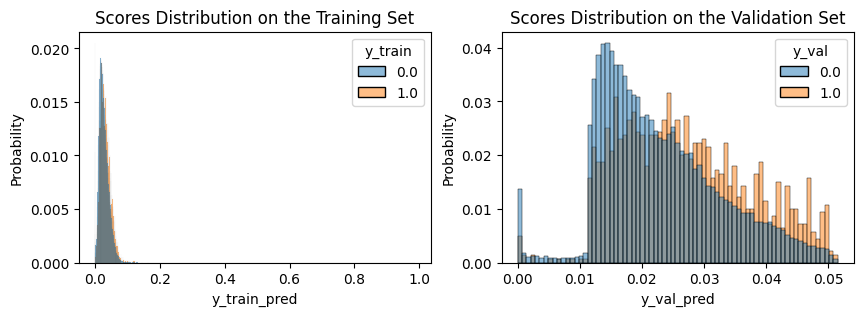

New best aucpr was found, current best aucpr is 0.0418
---------------------------------------------
Epoch: 04 | Time: 9m 32s
	Train Loss: 4.516
	 Val. Loss: 3.958
	 ROC-AUC: 0.619
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.3172: 100%|██████████| 416/416 [01:00<00:00,  6.83it/s] 


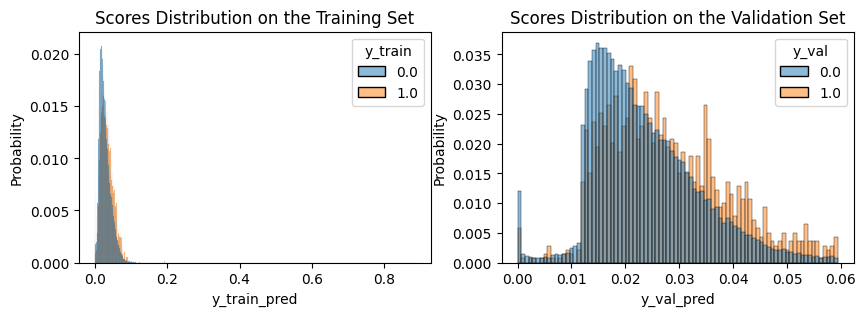

---------------------------------------------
Epoch: 05 | Time: 9m 34s
	Train Loss: 5.022
	 Val. Loss: 4.317
	 ROC-AUC: 0.610
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.745
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.62892: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s]


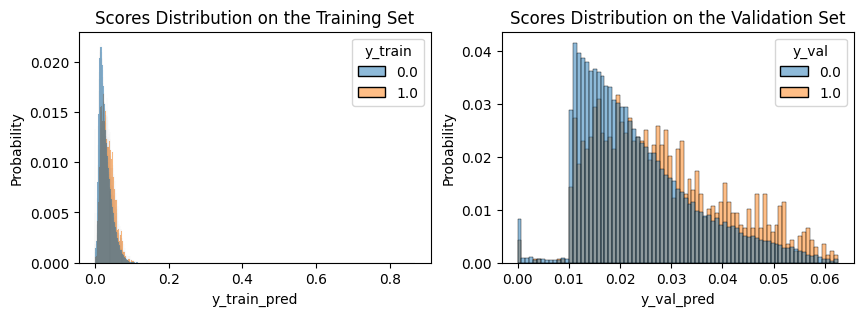

---------------------------------------------
Epoch: 06 | Time: 9m 34s
	Train Loss: 5.161
	 Val. Loss: 4.629
	 ROC-AUC: 0.611
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.742
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.29096: 100%|██████████| 416/416 [01:03<00:00,  6.51it/s]


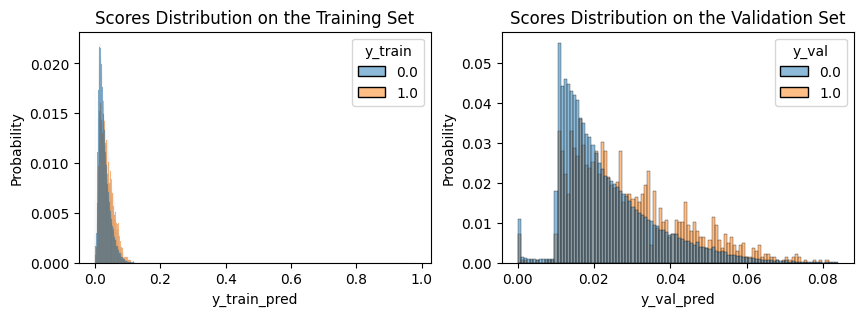

New best aucpr was found, current best aucpr is 0.0419
---------------------------------------------
Epoch: 07 | Time: 10m 5s
	Train Loss: 4.588
	 Val. Loss: 3.291
	 ROC-AUC: 0.617
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.750
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.72874: 100%|██████████| 416/416 [01:01<00:00,  6.81it/s]


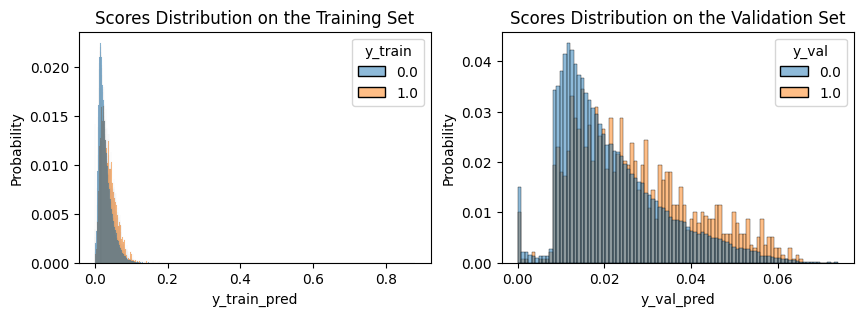

New best aucpr was found, current best aucpr is 0.0421
---------------------------------------------
Epoch: 08 | Time: 10m 10s
	Train Loss: 5.389
	 Val. Loss: 3.729
	 ROC-AUC: 0.615
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.745
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.55742: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


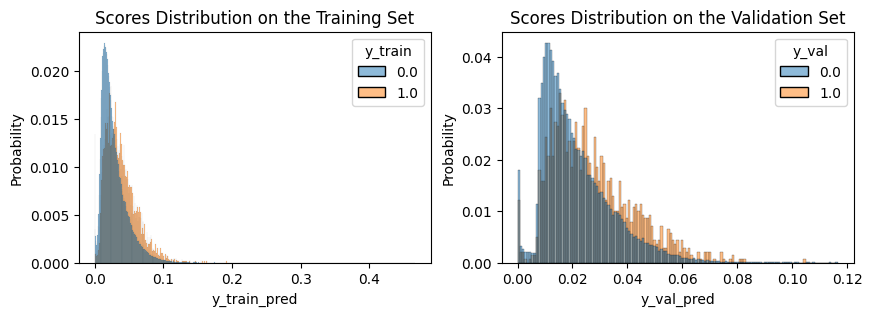

---------------------------------------------
Epoch: 09 | Time: 10m 9s
	Train Loss: 4.492
	 Val. Loss: 4.557
	 ROC-AUC: 0.625
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.25109: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s]


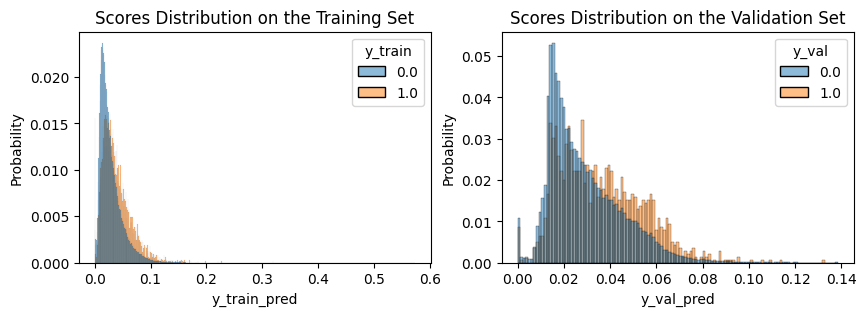

---------------------------------------------
Epoch: 10 | Time: 10m 20s
	Train Loss: 4.900
	 Val. Loss: 4.251
	 ROC-AUC: 0.623
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.768
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.17734: 100%|██████████| 416/416 [01:00<00:00,  6.89it/s]


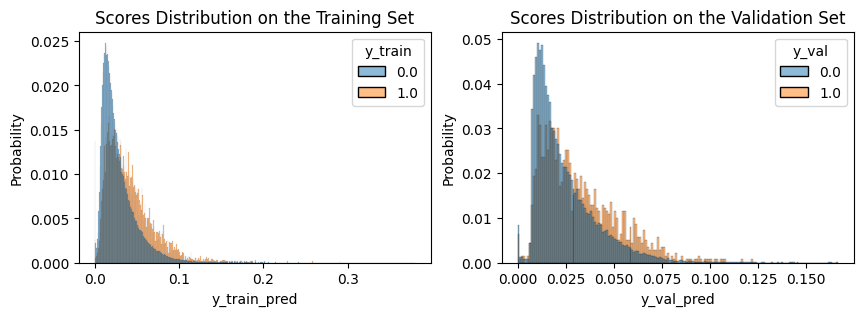

New best aucpr was found, current best aucpr is 0.0431
---------------------------------------------
Epoch: 11 | Time: 10m 12s
	Train Loss: 4.233
	 Val. Loss: 3.177
	 ROC-AUC: 0.627
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.767
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.12743: 100%|██████████| 416/416 [01:00<00:00,  6.85it/s]


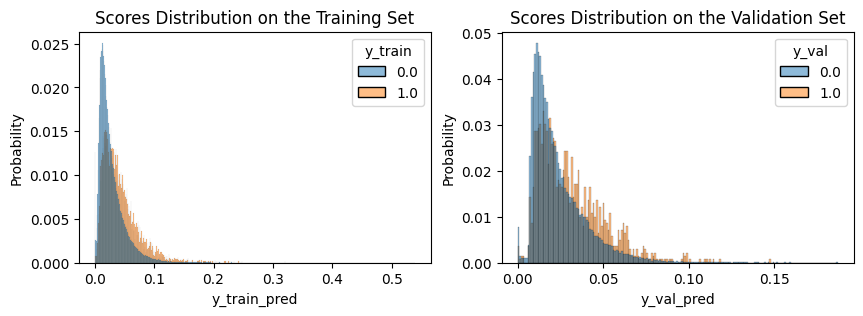

---------------------------------------------
Epoch: 12 | Time: 10m 14s
	Train Loss: 4.891
	 Val. Loss: 4.127
	 ROC-AUC: 0.628
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.37772: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


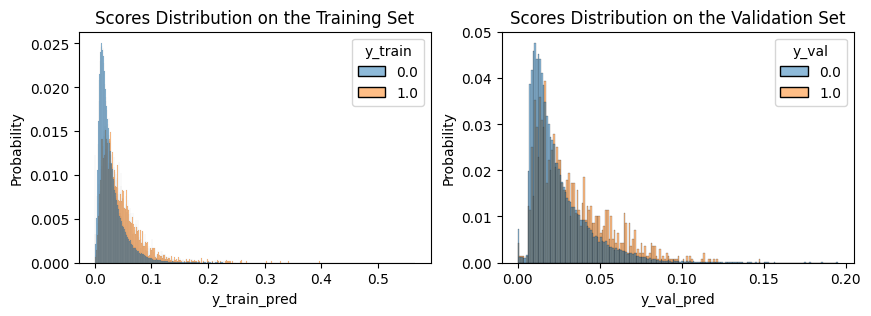

New best aucpr was found, current best aucpr is 0.044
---------------------------------------------
Epoch: 13 | Time: 10m 27s
	Train Loss: 4.983
	 Val. Loss: 4.378
	 ROC-AUC: 0.630
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.761
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.61383: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


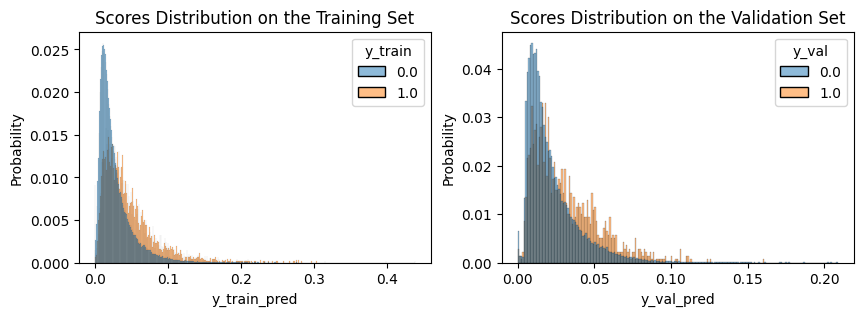

New best aucpr was found, current best aucpr is 0.0441
---------------------------------------------
Epoch: 14 | Time: 10m 30s
	Train Loss: 4.728
	 Val. Loss: 3.614
	 ROC-AUC: 0.633
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.770
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.55012: 100%|██████████| 416/416 [01:01<00:00,  6.80it/s]


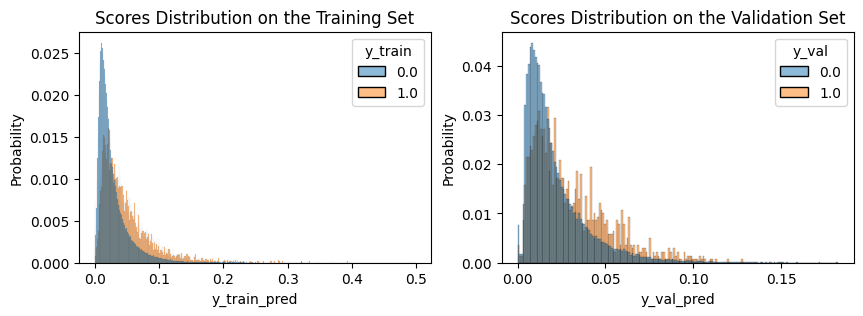

---------------------------------------------
Epoch: 15 | Time: 10m 26s
	Train Loss: 3.754
	 Val. Loss: 4.550
	 ROC-AUC: 0.632
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.756
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.59325: 100%|██████████| 416/416 [01:00<00:00,  6.84it/s]


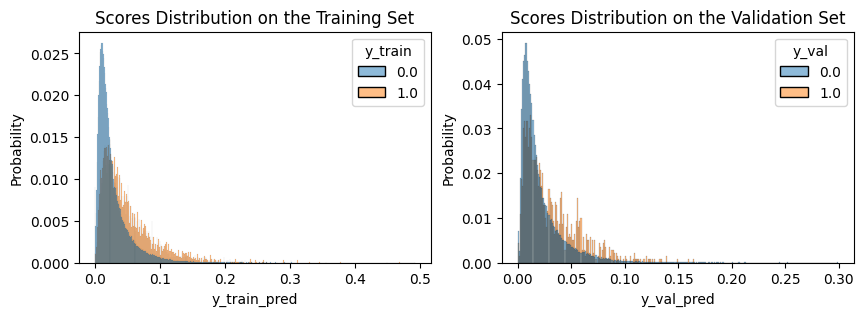

---------------------------------------------
Epoch: 16 | Time: 10m 28s
	Train Loss: 4.561
	 Val. Loss: 5.593
	 ROC-AUC: 0.629
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.23355: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


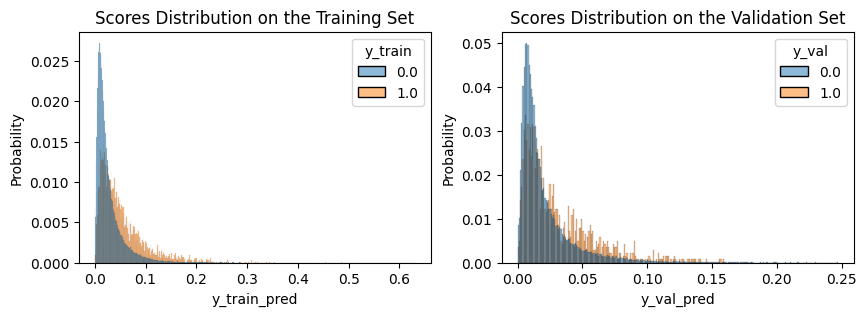

---------------------------------------------
Epoch: 17 | Time: 10m 24s
	Train Loss: 4.064
	 Val. Loss: 4.234
	 ROC-AUC: 0.627
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.89794: 100%|██████████| 416/416 [01:02<00:00,  6.70it/s]


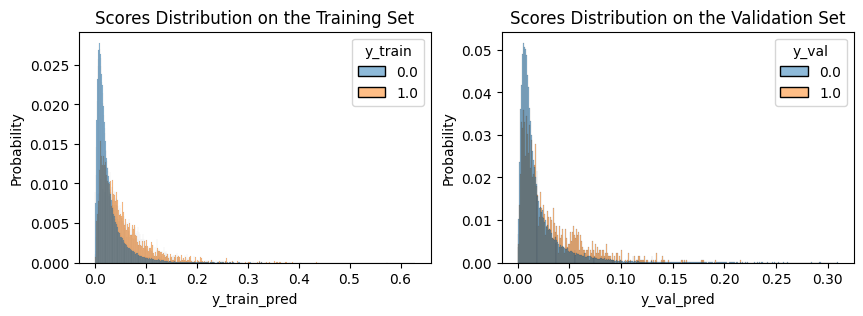

---------------------------------------------
Epoch: 18 | Time: 10m 43s
	Train Loss: 4.488
	 Val. Loss: 4.898
	 ROC-AUC: 0.622
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.747
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.41243: 100%|██████████| 416/416 [01:01<00:00,  6.76it/s]


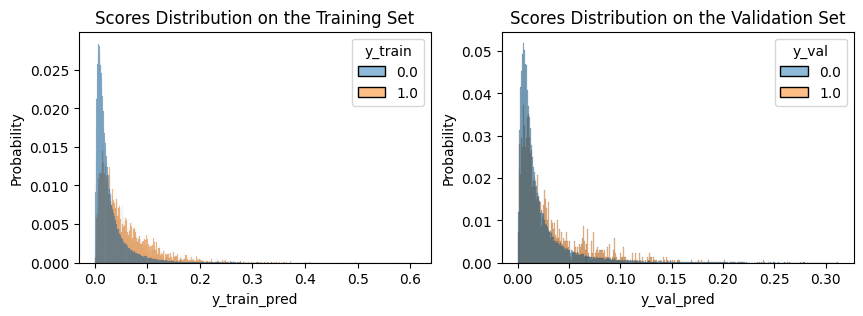

---------------------------------------------
Epoch: 19 | Time: 10m 41s
	Train Loss: 4.674
	 Val. Loss: 4.412
	 ROC-AUC: 0.617
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.746
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.32336: 100%|██████████| 416/416 [01:01<00:00,  6.74it/s]


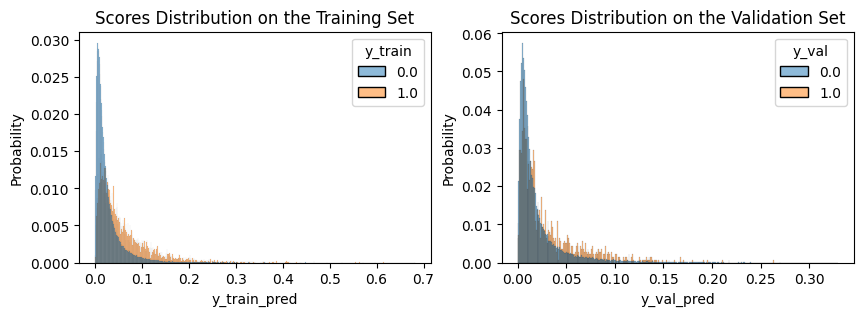

Params are: (0.01, 0.7, 66.0, 0.001)


training using device: mps




Within epoch loss (validation) 7.98442: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


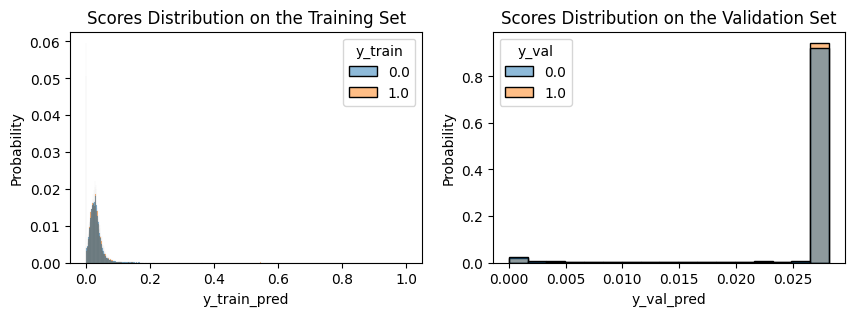

New best aucpr was found, current best aucpr is 0.0143
---------------------------------------------
Epoch: 01 | Time: 10m 24s
	Train Loss: 17.662
	 Val. Loss: 7.984
	 ROC-AUC: 0.512
	 PR-AUC: 0.014
	 TPR for FPR=0.6 Budget: 0.935
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.84456: 100%|██████████| 416/416 [01:01<00:00,  6.79it/s] 


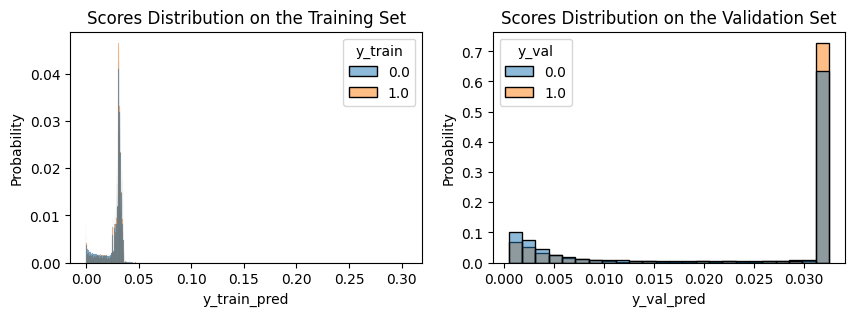

New best aucpr was found, current best aucpr is 0.3756
---------------------------------------------
Epoch: 02 | Time: 10m 28s
	Train Loss: 9.256
	 Val. Loss: 9.845
	 ROC-AUC: 0.549
	 PR-AUC: 0.376
	 TPR for FPR=0.6 Budget: 0.714
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.64974: 100%|██████████| 416/416 [01:03<00:00,  6.51it/s]


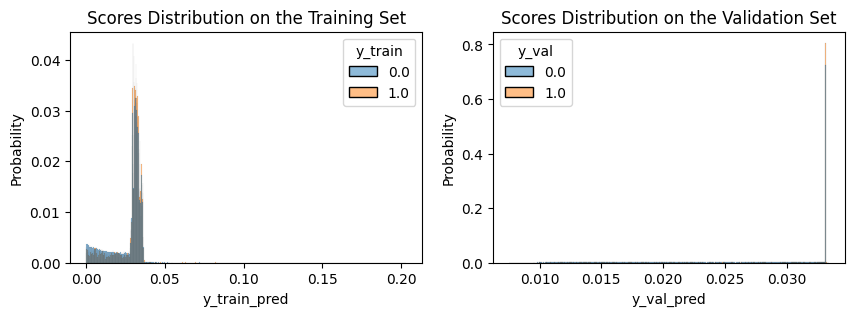

---------------------------------------------
Epoch: 03 | Time: 10m 18s
	Train Loss: 10.001
	 Val. Loss: 8.650
	 ROC-AUC: 0.545
	 PR-AUC: 0.026
	 TPR for FPR=0.6 Budget: 0.808
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.67291: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


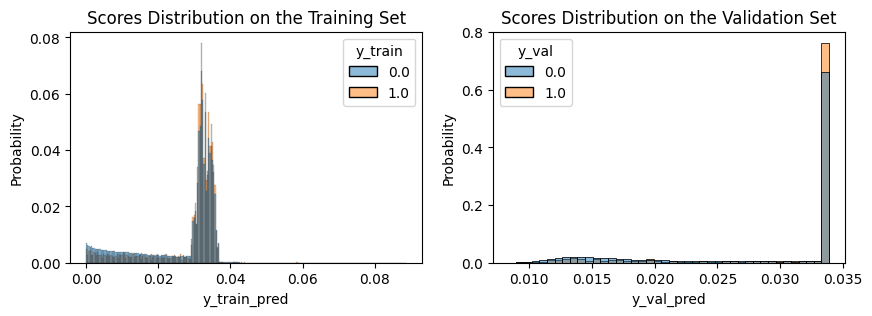

New best aucpr was found, current best aucpr is 0.3933
---------------------------------------------
Epoch: 04 | Time: 9m 40s
	Train Loss: 9.871
	 Val. Loss: 8.673
	 ROC-AUC: 0.557
	 PR-AUC: 0.393
	 TPR for FPR=0.6 Budget: 0.750
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.16283: 100%|██████████| 416/416 [01:07<00:00,  6.19it/s] 


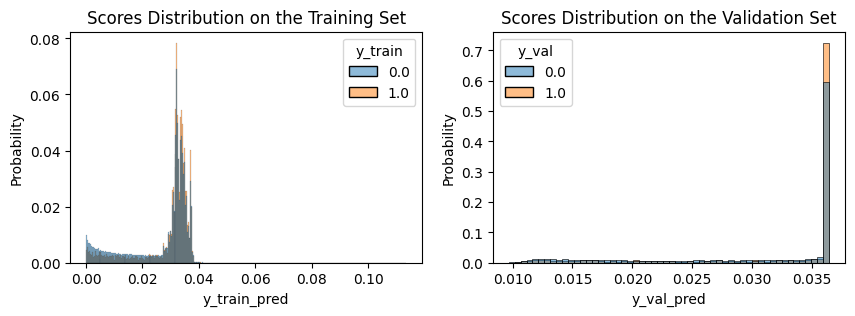

---------------------------------------------
Epoch: 05 | Time: 10m 40s
	Train Loss: 9.175
	 Val. Loss: 9.163
	 ROC-AUC: 0.569
	 PR-AUC: 0.029
	 TPR for FPR=0.6 Budget: 0.730
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.66385: 100%|██████████| 416/416 [01:00<00:00,  6.86it/s]


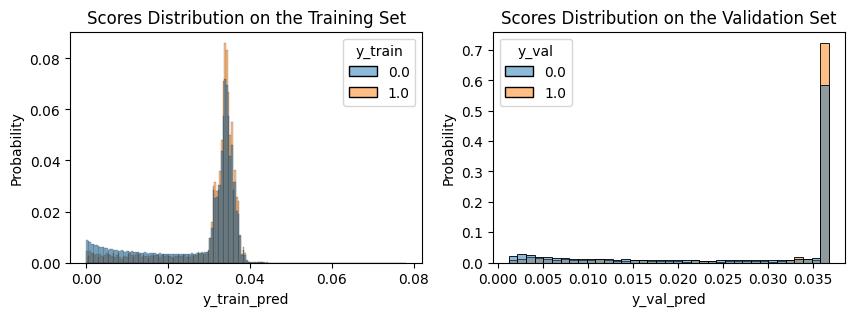

---------------------------------------------
Epoch: 06 | Time: 10m 5s
	Train Loss: 10.155
	 Val. Loss: 9.664
	 ROC-AUC: 0.572
	 PR-AUC: 0.026
	 TPR for FPR=0.6 Budget: 0.732
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.33803: 100%|██████████| 416/416 [01:00<00:00,  6.91it/s]


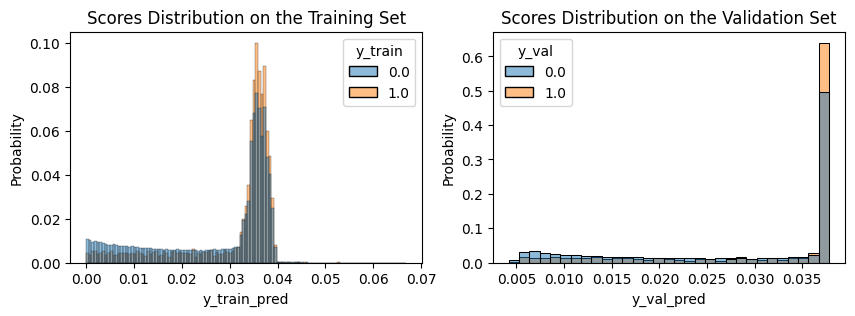

---------------------------------------------
Epoch: 07 | Time: 9m 25s
	Train Loss: 8.838
	 Val. Loss: 8.338
	 ROC-AUC: 0.585
	 PR-AUC: 0.325
	 TPR for FPR=0.6 Budget: 0.732
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.53353: 100%|██████████| 416/416 [01:03<00:00,  6.58it/s]


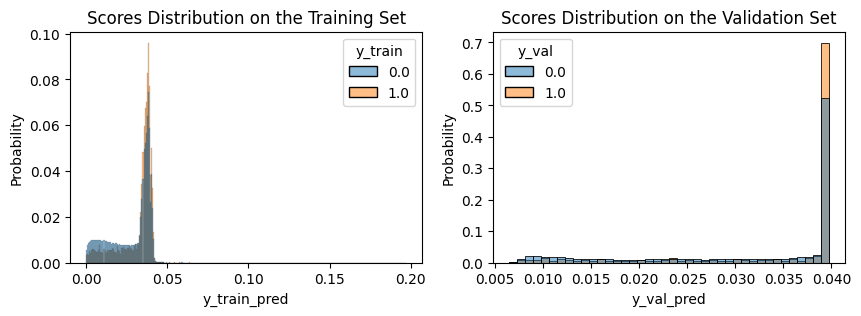

---------------------------------------------
Epoch: 08 | Time: 9m 40s
	Train Loss: 9.621
	 Val. Loss: 7.534
	 ROC-AUC: 0.596
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.754
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 10.37442: 100%|██████████| 416/416 [01:02<00:00,  6.65it/s]


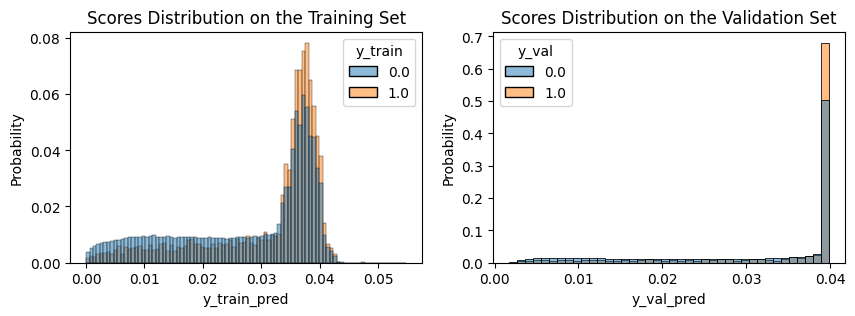

---------------------------------------------
Epoch: 09 | Time: 9m 36s
	Train Loss: 9.860
	 Val. Loss: 10.374
	 ROC-AUC: 0.603
	 PR-AUC: 0.345
	 TPR for FPR=0.6 Budget: 0.767
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.34456: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


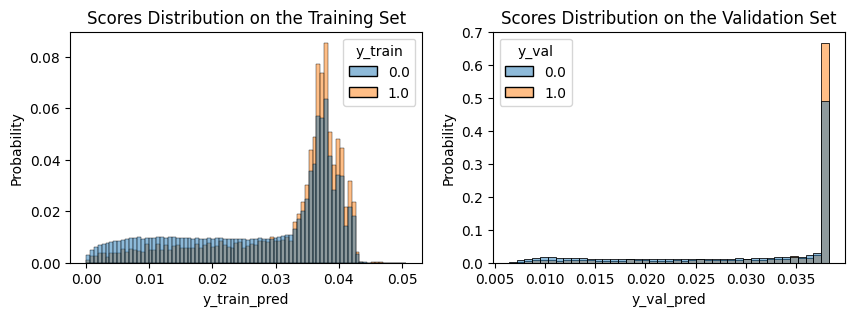

Params are: (0.001, 0.2, 50.0, 0)


training using device: mps




Within epoch loss (validation) 6.41083: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


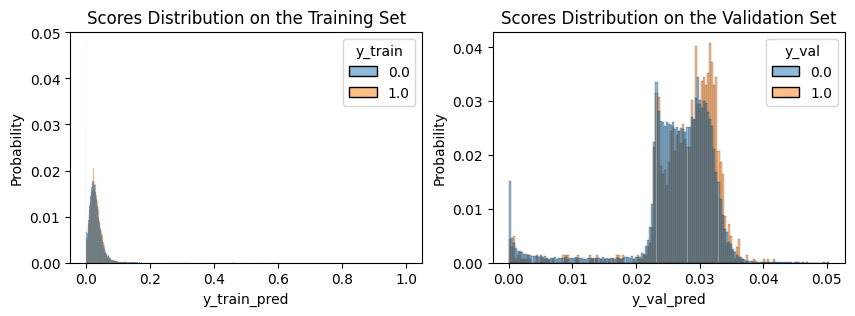

New best aucpr was found, current best aucpr is 0.0332
---------------------------------------------
Epoch: 01 | Time: 9m 27s
	Train Loss: 9.559
	 Val. Loss: 6.411
	 ROC-AUC: 0.575
	 PR-AUC: 0.033
	 TPR for FPR=0.6 Budget: 0.699
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.98545: 100%|██████████| 416/416 [01:01<00:00,  6.78it/s]


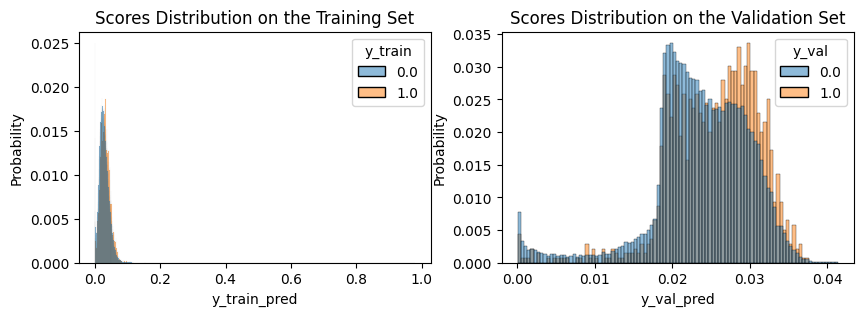

New best aucpr was found, current best aucpr is 0.0352
---------------------------------------------
Epoch: 02 | Time: 9m 35s
	Train Loss: 7.205
	 Val. Loss: 7.985
	 ROC-AUC: 0.587
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.712
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.88473: 100%|██████████| 416/416 [01:00<00:00,  6.82it/s]


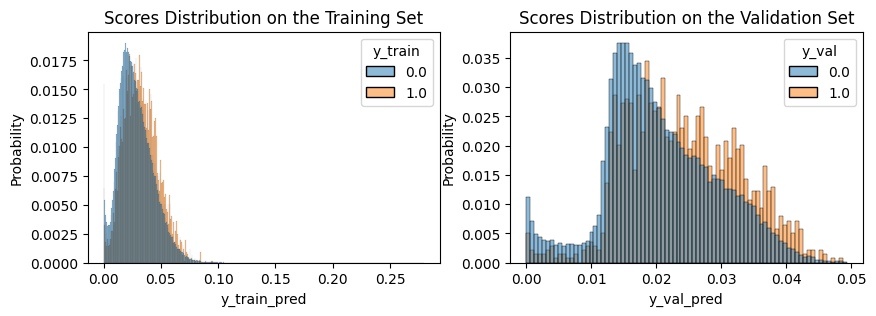

New best aucpr was found, current best aucpr is 0.0394
---------------------------------------------
Epoch: 03 | Time: 9m 38s
	Train Loss: 6.993
	 Val. Loss: 5.885
	 ROC-AUC: 0.614
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.755
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.76991: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


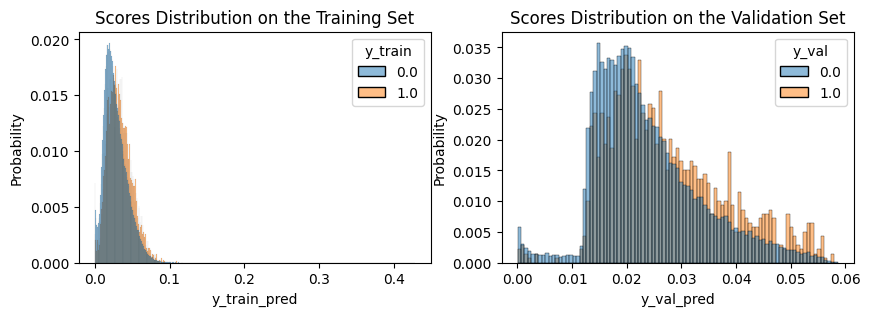

New best aucpr was found, current best aucpr is 0.0396
---------------------------------------------
Epoch: 04 | Time: 9m 31s
	Train Loss: 8.236
	 Val. Loss: 7.770
	 ROC-AUC: 0.603
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.730
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.04006: 100%|██████████| 416/416 [00:59<00:00,  6.96it/s]


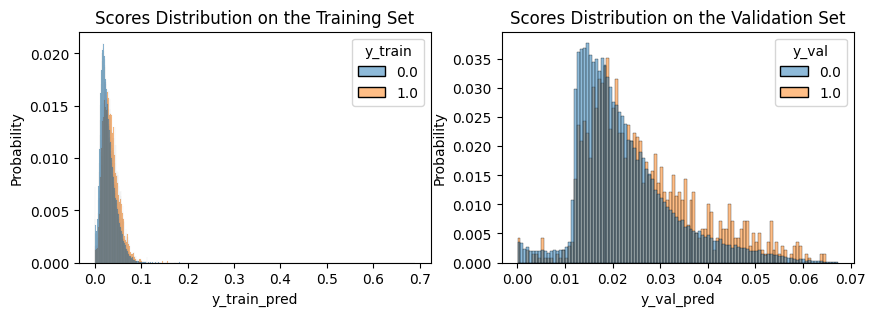

New best aucpr was found, current best aucpr is 0.04
---------------------------------------------
Epoch: 05 | Time: 9m 21s
	Train Loss: 7.231
	 Val. Loss: 5.040
	 ROC-AUC: 0.605
	 PR-AUC: 0.040
	 TPR for FPR=0.6 Budget: 0.733
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.10247: 100%|██████████| 416/416 [00:59<00:00,  7.00it/s]


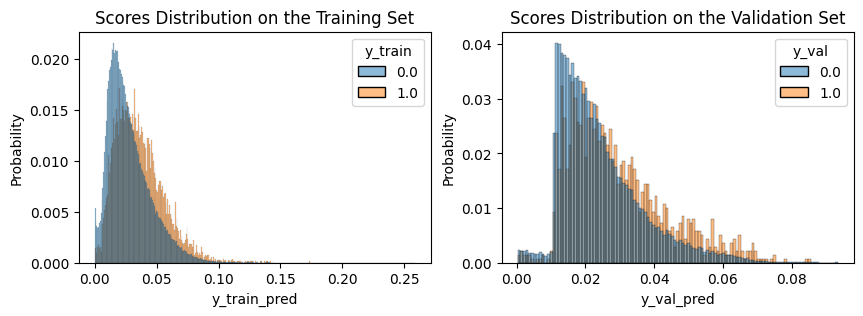

New best aucpr was found, current best aucpr is 0.0409
---------------------------------------------
Epoch: 06 | Time: 9m 19s
	Train Loss: 6.259
	 Val. Loss: 6.102
	 ROC-AUC: 0.607
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.736
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.67169: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s]


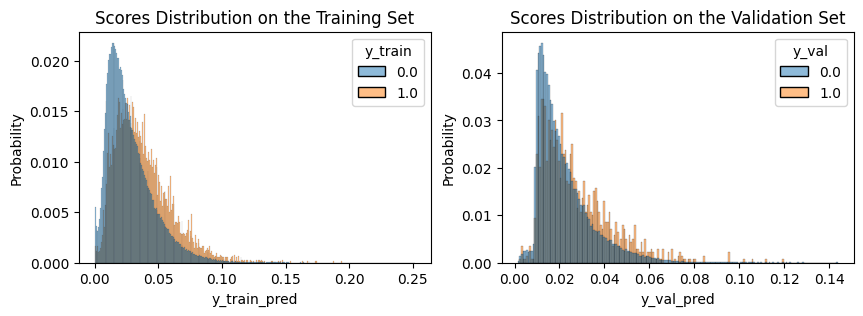

---------------------------------------------
Epoch: 07 | Time: 9m 23s
	Train Loss: 6.695
	 Val. Loss: 6.672
	 ROC-AUC: 0.609
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.739
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.4968: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s] 


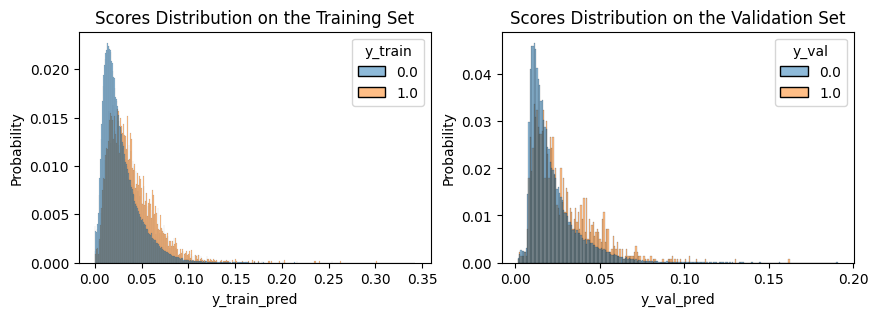

New best aucpr was found, current best aucpr is 0.0414
---------------------------------------------
Epoch: 08 | Time: 9m 20s
	Train Loss: 7.292
	 Val. Loss: 6.497
	 ROC-AUC: 0.616
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.745
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.18379: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


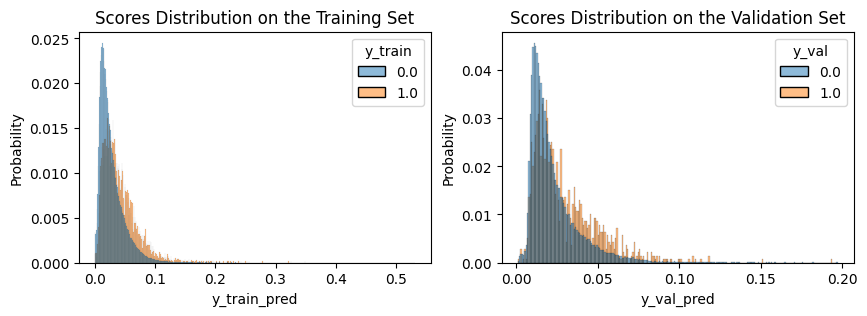

New best aucpr was found, current best aucpr is 0.0431
---------------------------------------------
Epoch: 09 | Time: 9m 17s
	Train Loss: 6.466
	 Val. Loss: 6.184
	 ROC-AUC: 0.623
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.754
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.76362: 100%|██████████| 416/416 [01:00<00:00,  6.89it/s]


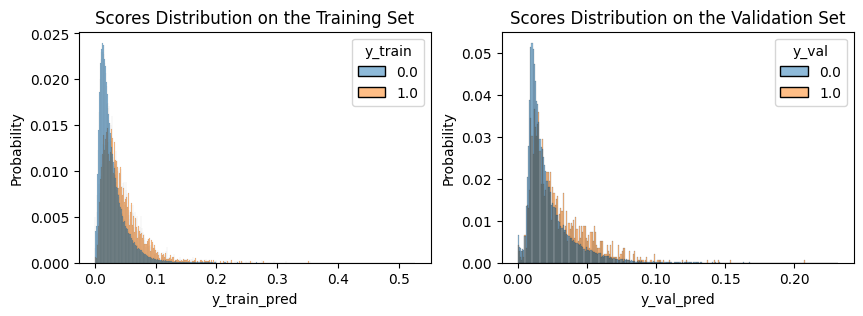

New best aucpr was found, current best aucpr is 0.0436
---------------------------------------------
Epoch: 10 | Time: 9m 20s
	Train Loss: 6.761
	 Val. Loss: 6.764
	 ROC-AUC: 0.623
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.78517: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s]


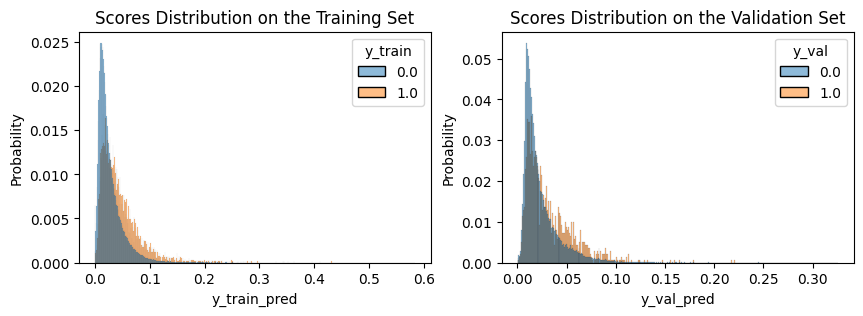

New best aucpr was found, current best aucpr is 0.044
---------------------------------------------
Epoch: 11 | Time: 9m 19s
	Train Loss: 7.735
	 Val. Loss: 7.785
	 ROC-AUC: 0.624
	 PR-AUC: 0.044
	 TPR for FPR=0.6 Budget: 0.747
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.69866: 100%|██████████| 416/416 [00:59<00:00,  6.94it/s]


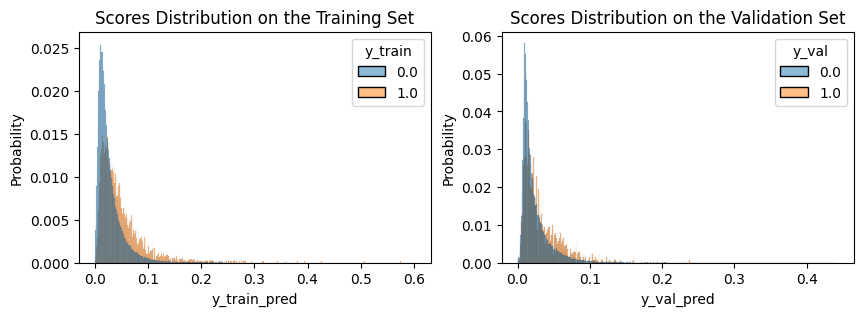

---------------------------------------------
Epoch: 12 | Time: 9m 17s
	Train Loss: 7.081
	 Val. Loss: 5.699
	 ROC-AUC: 0.617
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.742
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.82207: 100%|██████████| 416/416 [01:00<00:00,  6.90it/s]


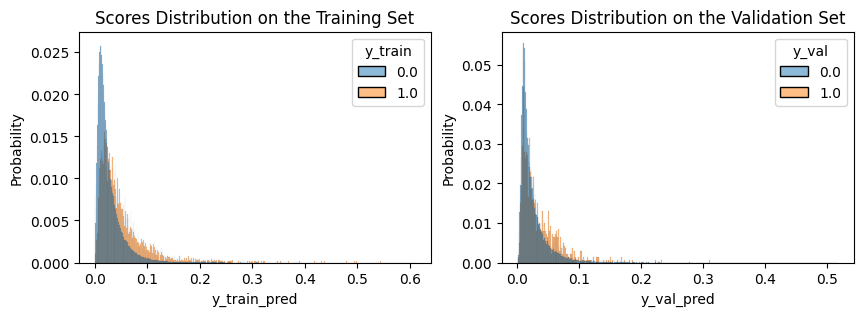

---------------------------------------------
Epoch: 13 | Time: 9m 29s
	Train Loss: 7.039
	 Val. Loss: 6.822
	 ROC-AUC: 0.616
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.7991: 100%|██████████| 416/416 [00:59<00:00,  6.98it/s] 


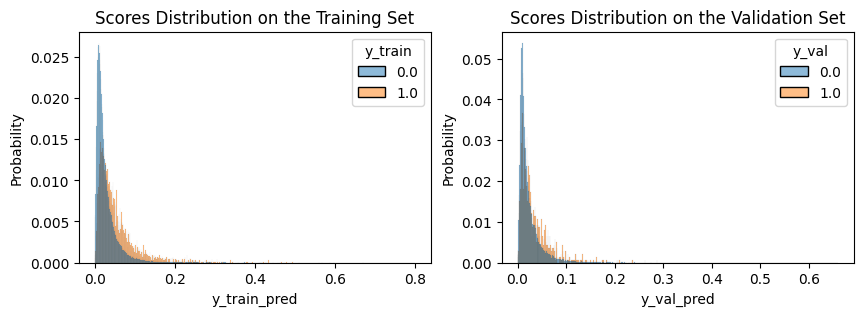

---------------------------------------------
Epoch: 14 | Time: 9m 42s
	Train Loss: 7.066
	 Val. Loss: 5.799
	 ROC-AUC: 0.619
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.743
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.98989: 100%|██████████| 416/416 [01:00<00:00,  6.91it/s]


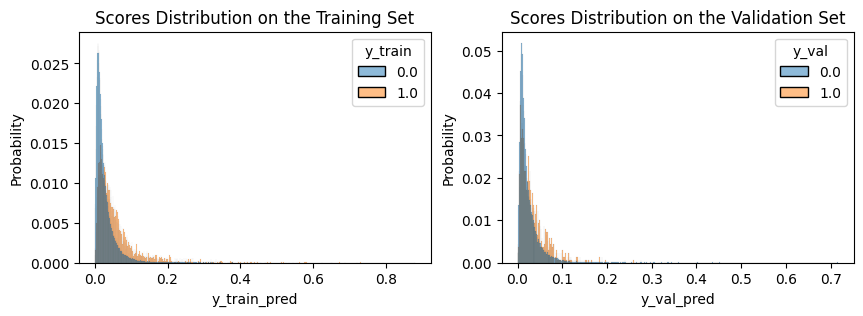

---------------------------------------------
Epoch: 15 | Time: 9m 39s
	Train Loss: 7.256
	 Val. Loss: 5.990
	 ROC-AUC: 0.620
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.80392: 100%|██████████| 416/416 [01:03<00:00,  6.59it/s]


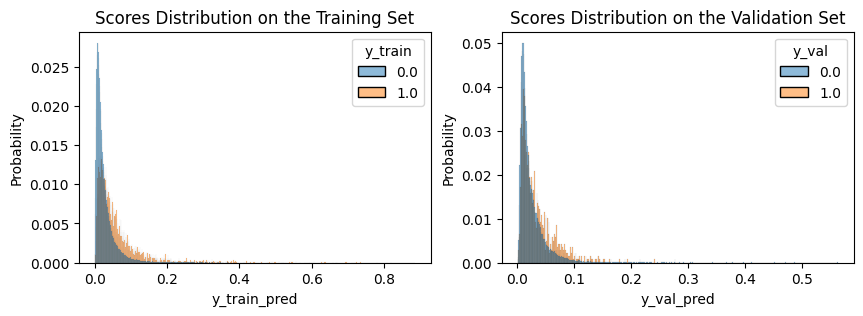

---------------------------------------------
Epoch: 16 | Time: 9m 31s
	Train Loss: 7.167
	 Val. Loss: 4.804
	 ROC-AUC: 0.615
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.729
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 5.54857: 100%|██████████| 416/416 [01:00<00:00,  6.88it/s]


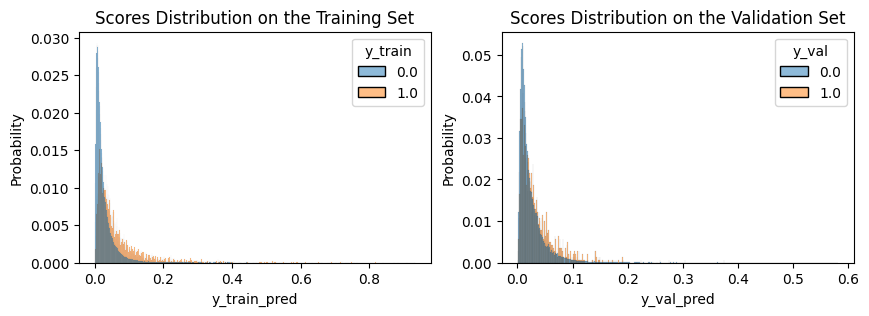

Params are: (0.005, 0.5, 33.0, 0)


training using device: mps




Within epoch loss (validation) 4.90946: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


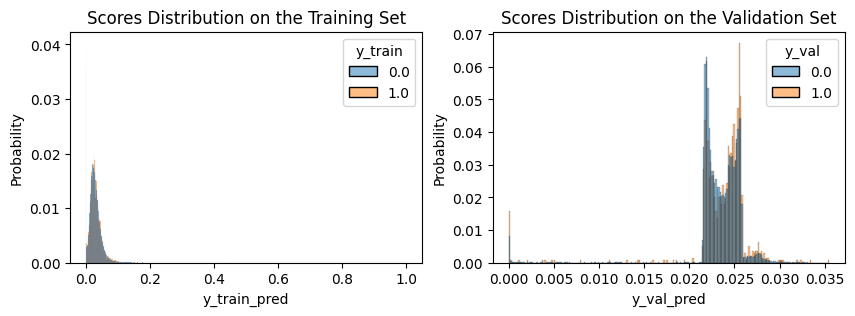

New best aucpr was found, current best aucpr is 0.0314
---------------------------------------------
Epoch: 01 | Time: 9m 28s
	Train Loss: 4.959
	 Val. Loss: 4.909
	 ROC-AUC: 0.542
	 PR-AUC: 0.031
	 TPR for FPR=0.6 Budget: 0.654
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.62044: 100%|██████████| 416/416 [00:59<00:00,  7.02it/s]


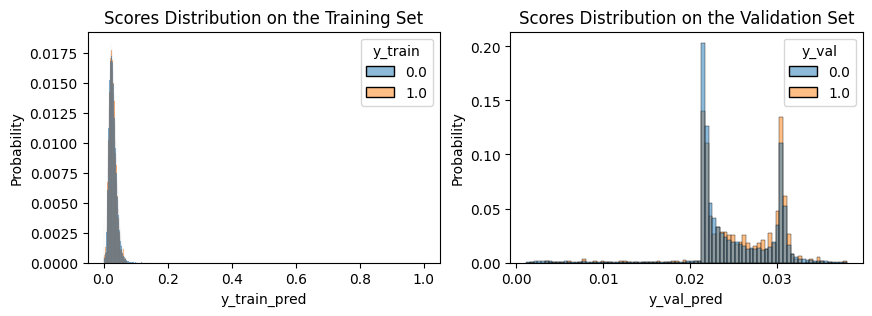

---------------------------------------------
Epoch: 02 | Time: 9m 33s
	Train Loss: 5.145
	 Val. Loss: 3.620
	 ROC-AUC: 0.561
	 PR-AUC: 0.031
	 TPR for FPR=0.6 Budget: 0.693
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.77404: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


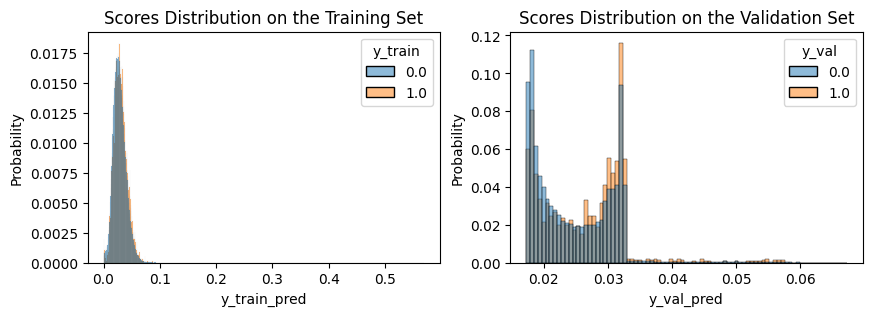

New best aucpr was found, current best aucpr is 0.0336
---------------------------------------------
Epoch: 03 | Time: 9m 33s
	Train Loss: 4.532
	 Val. Loss: 3.774
	 ROC-AUC: 0.577
	 PR-AUC: 0.034
	 TPR for FPR=0.6 Budget: 0.713
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.37235: 100%|██████████| 416/416 [01:04<00:00,  6.45it/s]


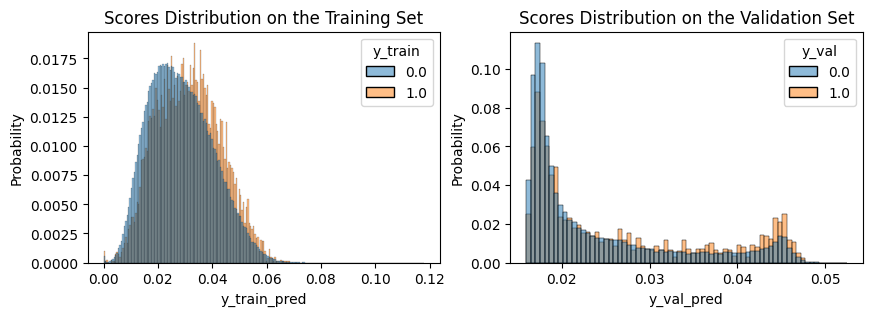

New best aucpr was found, current best aucpr is 0.0354
---------------------------------------------
Epoch: 04 | Time: 9m 38s
	Train Loss: 5.190
	 Val. Loss: 4.372
	 ROC-AUC: 0.586
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.718
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.25114: 100%|██████████| 416/416 [00:59<00:00,  6.96it/s]


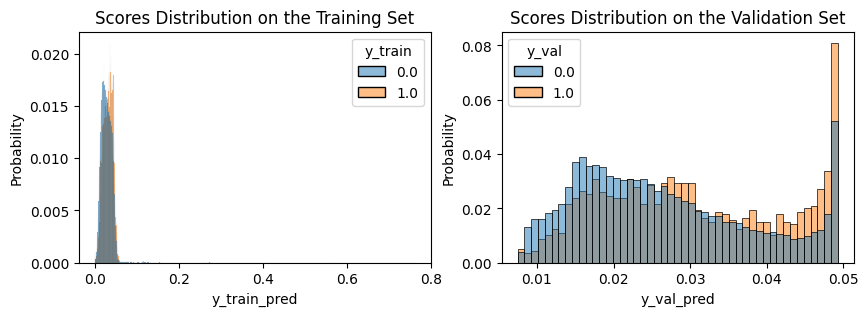

New best aucpr was found, current best aucpr is 0.0361
---------------------------------------------
Epoch: 05 | Time: 9m 30s
	Train Loss: 4.950
	 Val. Loss: 4.251
	 ROC-AUC: 0.598
	 PR-AUC: 0.036
	 TPR for FPR=0.6 Budget: 0.729
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.09207: 100%|██████████| 416/416 [00:59<00:00,  6.97it/s]


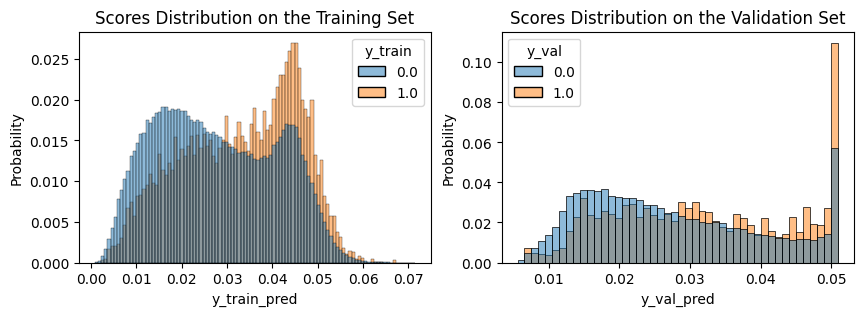

New best aucpr was found, current best aucpr is 0.0384
---------------------------------------------
Epoch: 06 | Time: 9m 28s
	Train Loss: 5.000
	 Val. Loss: 4.092
	 ROC-AUC: 0.609
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.9132: 100%|██████████| 416/416 [00:59<00:00,  6.96it/s] 


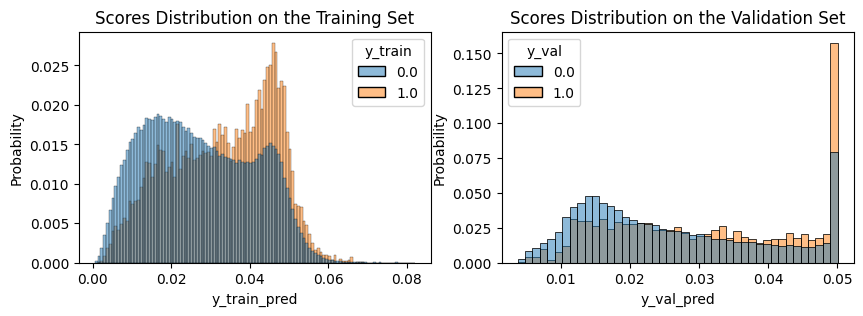

New best aucpr was found, current best aucpr is 0.0394
---------------------------------------------
Epoch: 07 | Time: 9m 29s
	Train Loss: 5.300
	 Val. Loss: 4.913
	 ROC-AUC: 0.617
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.762
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.76204: 100%|██████████| 416/416 [01:02<00:00,  6.71it/s]


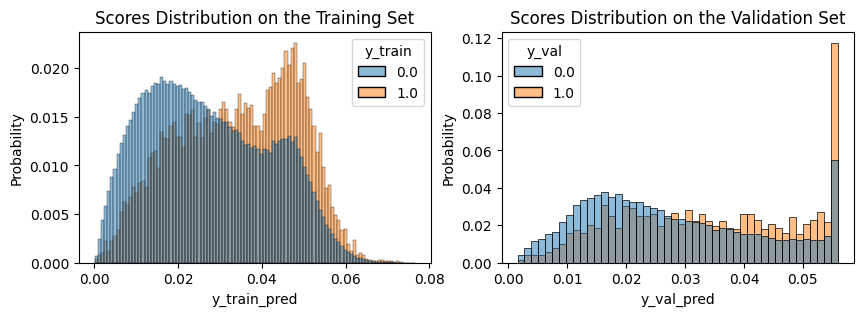

New best aucpr was found, current best aucpr is 0.0405
---------------------------------------------
Epoch: 08 | Time: 9m 25s
	Train Loss: 4.635
	 Val. Loss: 4.762
	 ROC-AUC: 0.626
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.96046: 100%|██████████| 416/416 [00:59<00:00,  6.98it/s]


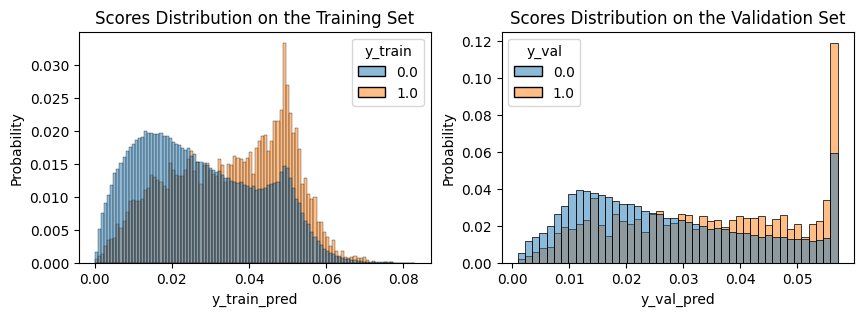

New best aucpr was found, current best aucpr is 0.0412
---------------------------------------------
Epoch: 09 | Time: 9m 27s
	Train Loss: 4.501
	 Val. Loss: 3.960
	 ROC-AUC: 0.631
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.765
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.54478: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


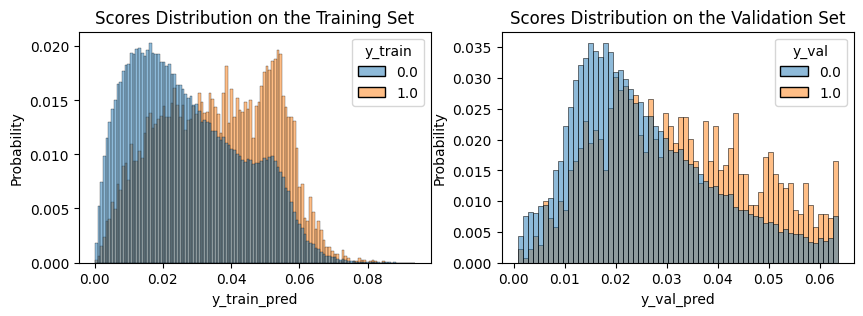

New best aucpr was found, current best aucpr is 0.0422
---------------------------------------------
Epoch: 10 | Time: 9m 30s
	Train Loss: 4.462
	 Val. Loss: 3.545
	 ROC-AUC: 0.631
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.773
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.76737: 100%|██████████| 416/416 [00:59<00:00,  6.98it/s]


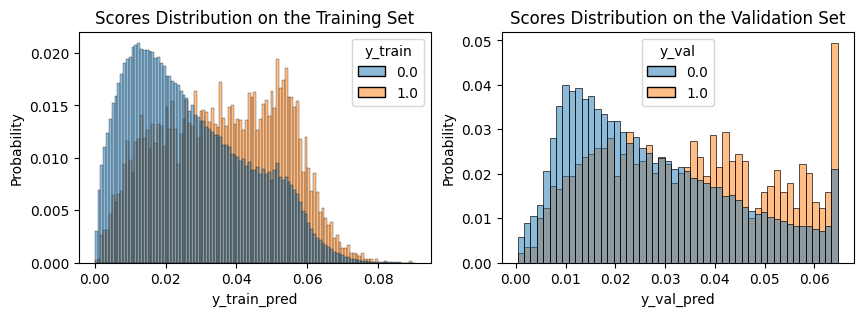

---------------------------------------------
Epoch: 11 | Time: 9m 27s
	Train Loss: 4.505
	 Val. Loss: 3.767
	 ROC-AUC: 0.625
	 PR-AUC: 0.041
	 TPR for FPR=0.6 Budget: 0.754
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.63127: 100%|██████████| 416/416 [00:59<00:00,  6.97it/s]


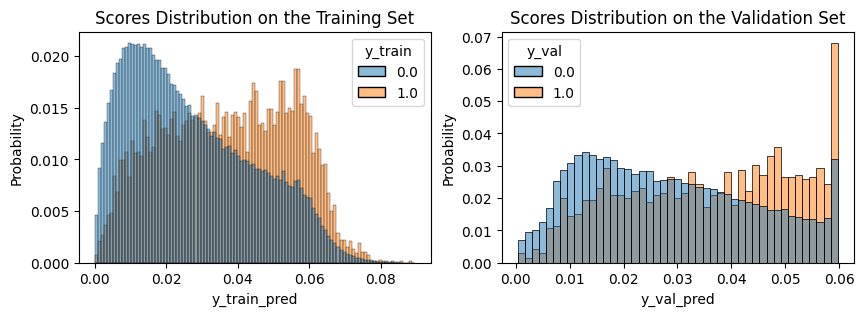

New best aucpr was found, current best aucpr is 0.0423
---------------------------------------------
Epoch: 12 | Time: 9m 36s
	Train Loss: 5.027
	 Val. Loss: 4.631
	 ROC-AUC: 0.632
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.760
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.9679: 100%|██████████| 416/416 [00:59<00:00,  7.00it/s] 


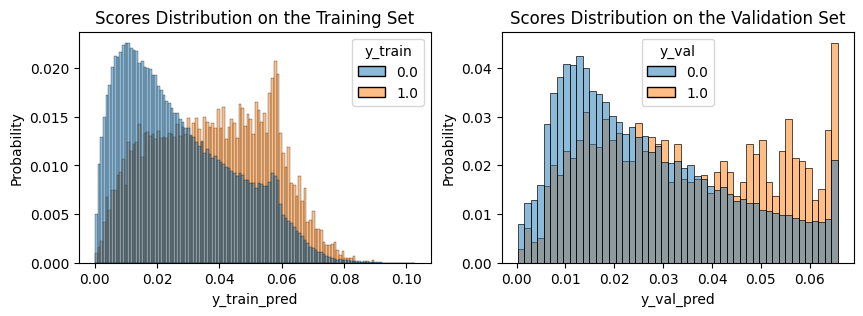

New best aucpr was found, current best aucpr is 0.0431
---------------------------------------------
Epoch: 13 | Time: 9m 31s
	Train Loss: 4.790
	 Val. Loss: 4.968
	 ROC-AUC: 0.632
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.764
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.35743: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


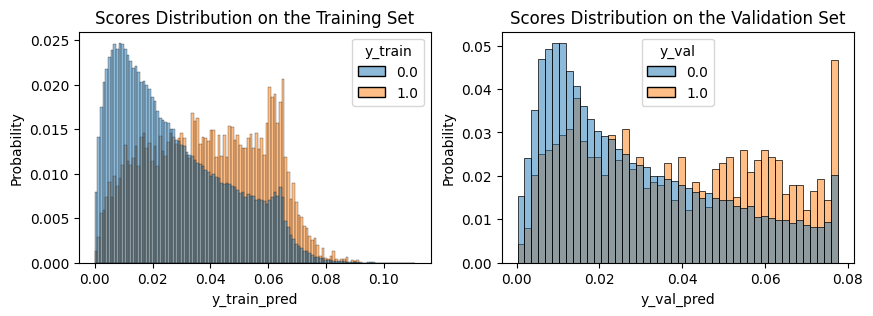

---------------------------------------------
Epoch: 14 | Time: 9m 25s
	Train Loss: 4.196
	 Val. Loss: 3.357
	 ROC-AUC: 0.629
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.759
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.34649: 100%|██████████| 416/416 [00:59<00:00,  6.99it/s]


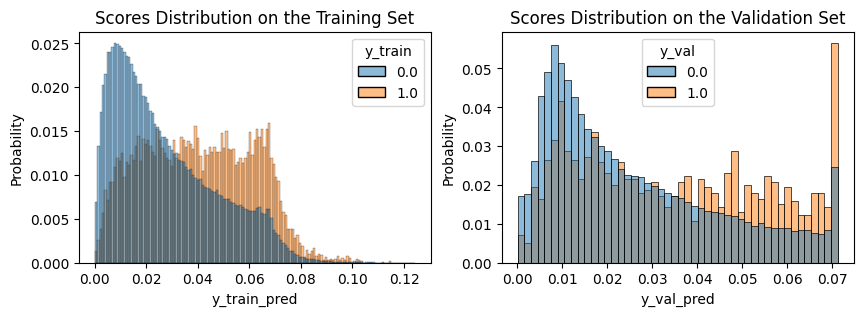

---------------------------------------------
Epoch: 15 | Time: 9m 26s
	Train Loss: 4.546
	 Val. Loss: 3.346
	 ROC-AUC: 0.630
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.768
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.5733: 100%|██████████| 416/416 [01:01<00:00,  6.75it/s] 


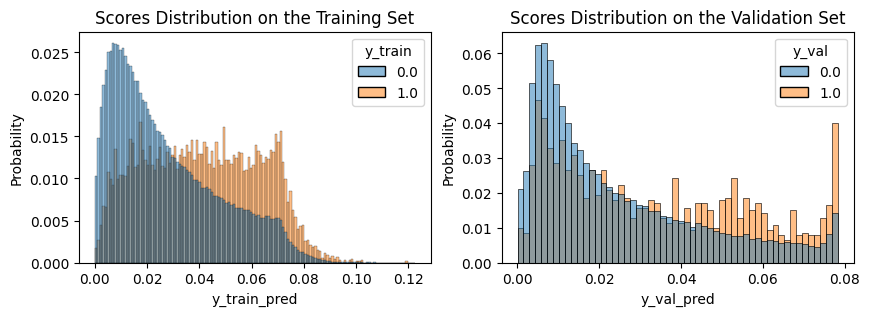

---------------------------------------------
Epoch: 16 | Time: 9m 34s
	Train Loss: 4.814
	 Val. Loss: 3.573
	 ROC-AUC: 0.626
	 PR-AUC: 0.043
	 TPR for FPR=0.6 Budget: 0.752
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.99092: 100%|██████████| 416/416 [01:00<00:00,  6.93it/s]


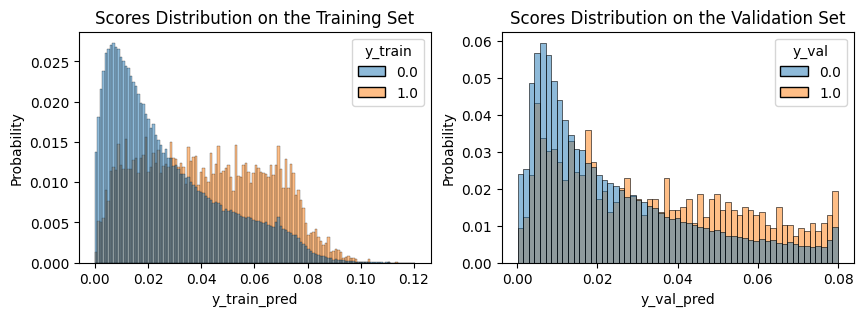

---------------------------------------------
Epoch: 17 | Time: 9m 32s
	Train Loss: 5.239
	 Val. Loss: 4.991
	 ROC-AUC: 0.628
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.768
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 4.45202: 100%|██████████| 416/416 [01:00<00:00,  6.92it/s]


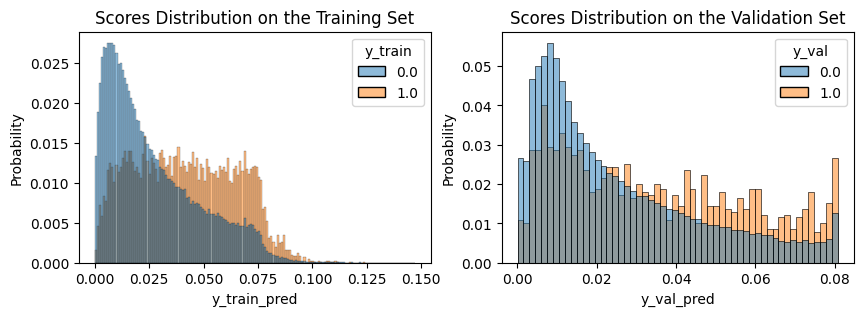

---------------------------------------------
Epoch: 18 | Time: 9m 25s
	Train Loss: 4.052
	 Val. Loss: 4.452
	 ROC-AUC: 0.629
	 PR-AUC: 0.042
	 TPR for FPR=0.6 Budget: 0.757
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 3.63366: 100%|██████████| 416/416 [01:00<00:00,  6.89it/s]


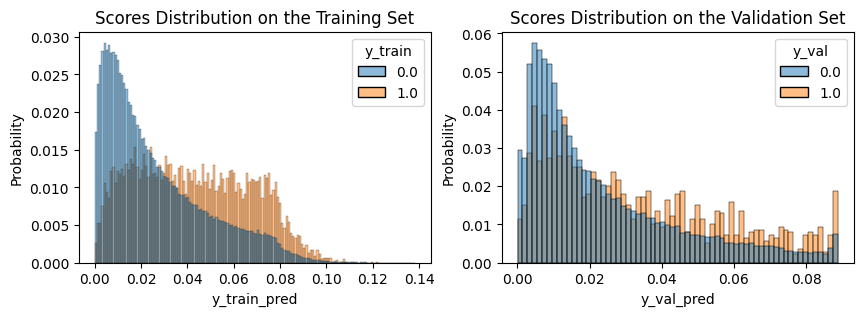

Params are: (0.005, 0.7, 66.0, 0)


training using device: mps




Within epoch loss (validation) 8.0065: 100%|██████████| 416/416 [01:01<00:00,  6.82it/s] 


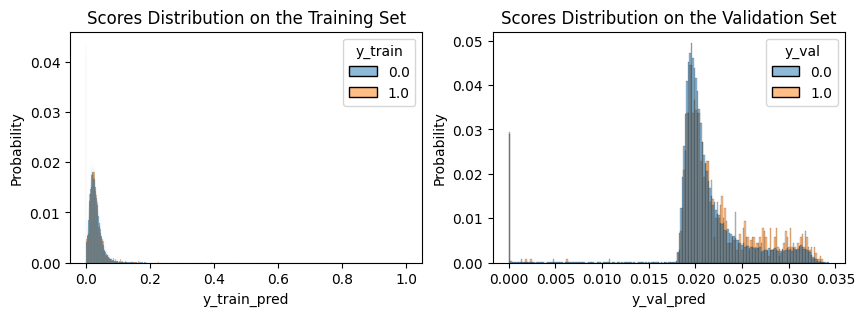

New best aucpr was found, current best aucpr is 0.0343
---------------------------------------------
Epoch: 01 | Time: 9m 34s
	Train Loss: 12.794
	 Val. Loss: 8.006
	 ROC-AUC: 0.564
	 PR-AUC: 0.034
	 TPR for FPR=0.6 Budget: 0.674
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.03213: 100%|██████████| 416/416 [00:59<00:00,  7.01it/s]


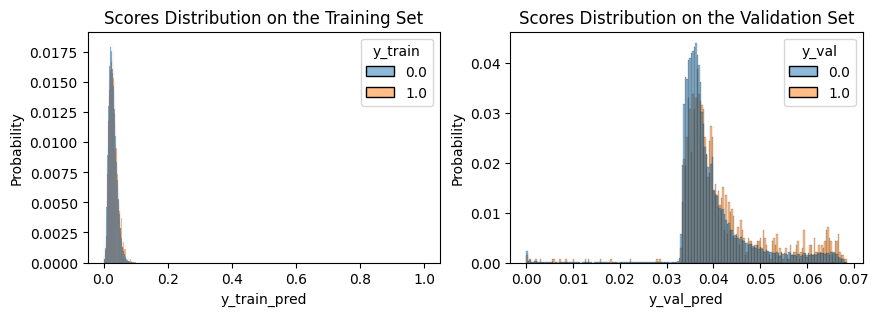

New best aucpr was found, current best aucpr is 0.037
---------------------------------------------
Epoch: 02 | Time: 9m 35s
	Train Loss: 9.710
	 Val. Loss: 9.032
	 ROC-AUC: 0.586
	 PR-AUC: 0.037
	 TPR for FPR=0.6 Budget: 0.720
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.91232: 100%|██████████| 416/416 [00:59<00:00,  6.95it/s]


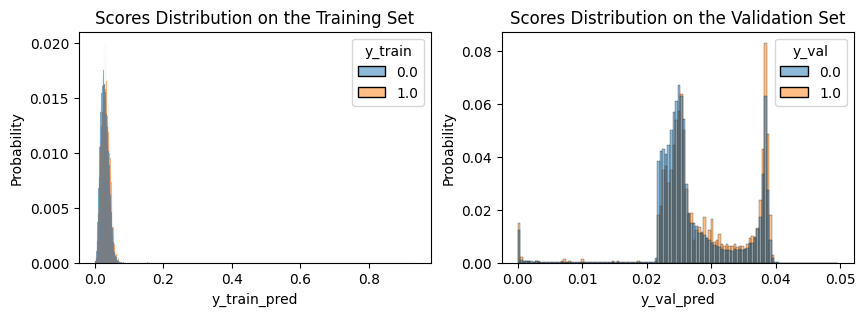

---------------------------------------------
Epoch: 03 | Time: 9m 37s
	Train Loss: 8.935
	 Val. Loss: 7.912
	 ROC-AUC: 0.575
	 PR-AUC: 0.034
	 TPR for FPR=0.6 Budget: 0.700
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.43383: 100%|██████████| 416/416 [01:00<00:00,  6.91it/s] 


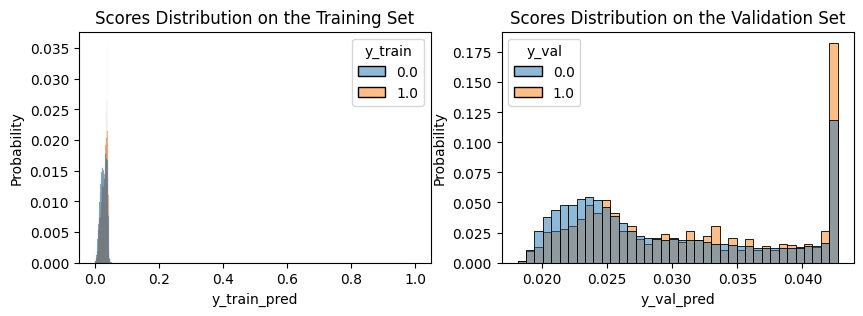

---------------------------------------------
Epoch: 04 | Time: 9m 35s
	Train Loss: 9.822
	 Val. Loss: 9.434
	 ROC-AUC: 0.580
	 PR-AUC: 0.035
	 TPR for FPR=0.6 Budget: 0.711
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.6294: 100%|██████████| 416/416 [00:59<00:00,  6.97it/s] 


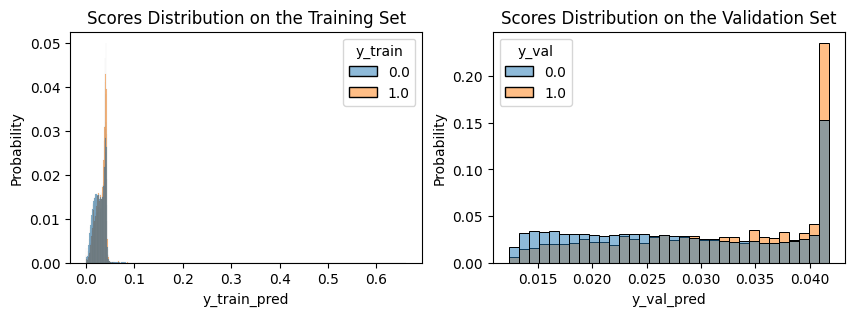

New best aucpr was found, current best aucpr is 0.1209
---------------------------------------------
Epoch: 05 | Time: 9m 33s
	Train Loss: 10.153
	 Val. Loss: 8.629
	 ROC-AUC: 0.597
	 PR-AUC: 0.121
	 TPR for FPR=0.6 Budget: 0.733
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.08164: 100%|██████████| 416/416 [00:59<00:00,  6.97it/s]


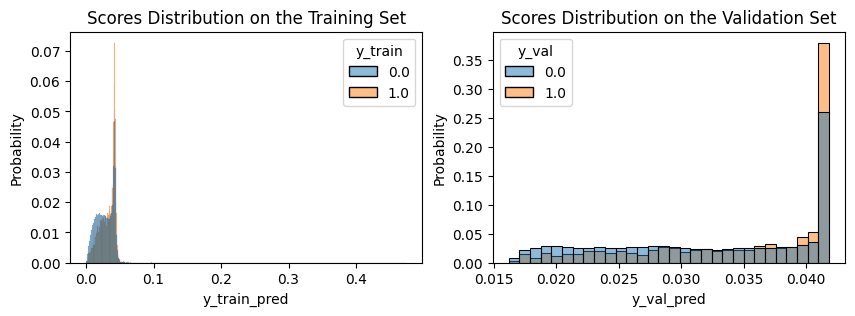

New best aucpr was found, current best aucpr is 0.1833
---------------------------------------------
Epoch: 06 | Time: 9m 32s
	Train Loss: 9.133
	 Val. Loss: 8.082
	 ROC-AUC: 0.602
	 PR-AUC: 0.183
	 TPR for FPR=0.6 Budget: 0.740
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.42625: 100%|██████████| 416/416 [00:58<00:00,  7.08it/s] 


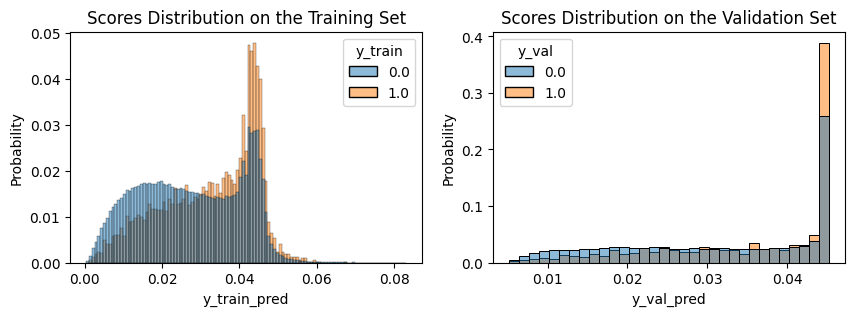

---------------------------------------------
Epoch: 07 | Time: 9m 28s
	Train Loss: 9.247
	 Val. Loss: 9.426
	 ROC-AUC: 0.605
	 PR-AUC: 0.038
	 TPR for FPR=0.6 Budget: 0.741
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 6.96892: 100%|██████████| 416/416 [00:58<00:00,  7.07it/s]


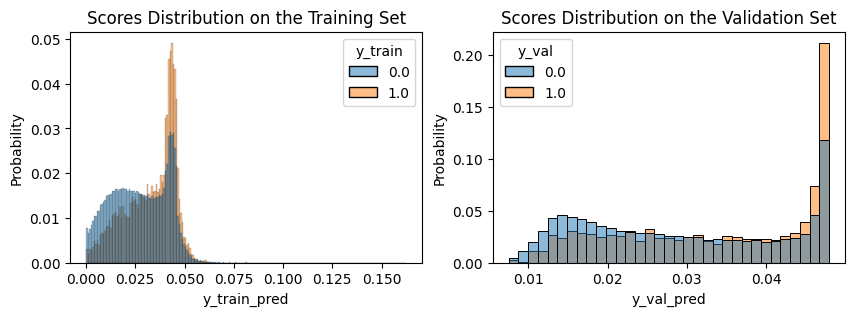

---------------------------------------------
Epoch: 08 | Time: 9m 27s
	Train Loss: 8.550
	 Val. Loss: 6.969
	 ROC-AUC: 0.608
	 PR-AUC: 0.039
	 TPR for FPR=0.6 Budget: 0.738
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.21888: 100%|██████████| 416/416 [00:58<00:00,  7.06it/s] 


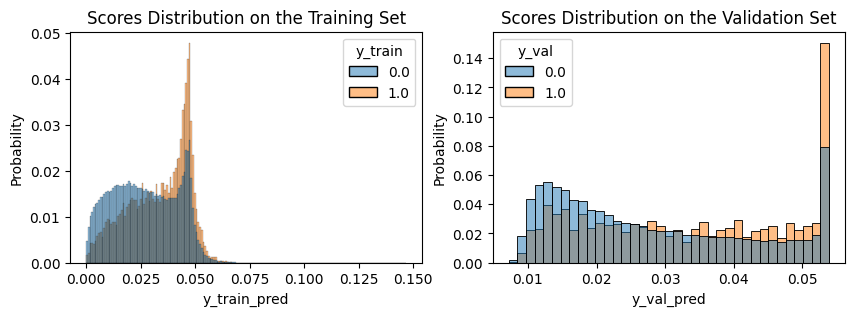

---------------------------------------------
Epoch: 09 | Time: 9m 25s
	Train Loss: 10.146
	 Val. Loss: 9.219
	 ROC-AUC: 0.615
	 PR-AUC: 0.056
	 TPR for FPR=0.6 Budget: 0.753
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 9.75835: 100%|██████████| 416/416 [00:59<00:00,  7.03it/s] 


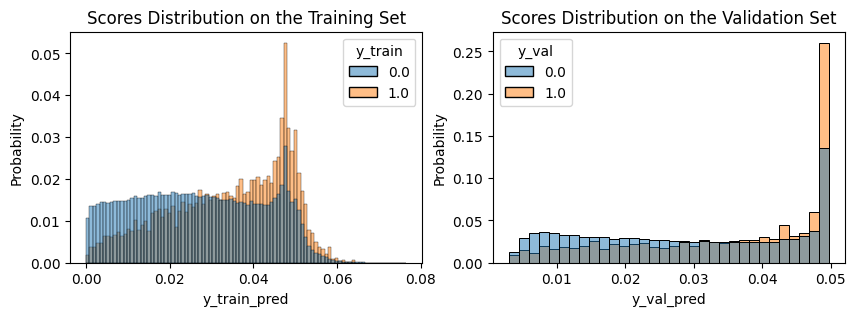

---------------------------------------------
Epoch: 10 | Time: 9m 31s
	Train Loss: 8.733
	 Val. Loss: 9.758
	 ROC-AUC: 0.626
	 PR-AUC: 0.036
	 TPR for FPR=0.6 Budget: 0.758
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 7.97792: 100%|██████████| 416/416 [00:58<00:00,  7.12it/s]


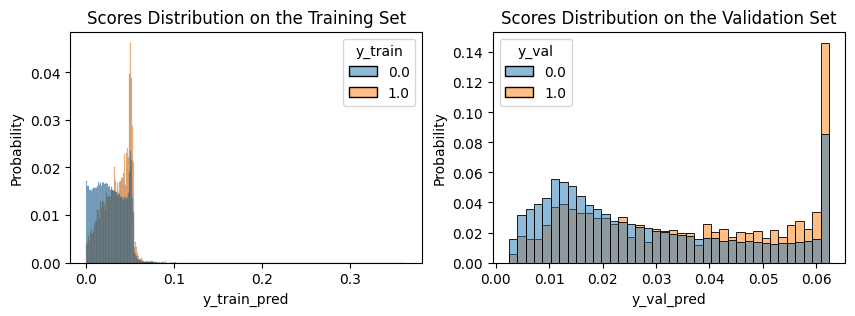

---------------------------------------------
Epoch: 11 | Time: 9m 35s
	Train Loss: 9.937
	 Val. Loss: 7.978
	 ROC-AUC: 0.615
	 PR-AUC: 0.062
	 TPR for FPR=0.6 Budget: 0.747
	 Best Val. Loss: inf
---------------------------------------------


Within epoch loss (validation) 8.60536: 100%|██████████| 416/416 [00:59<00:00,  7.02it/s] 


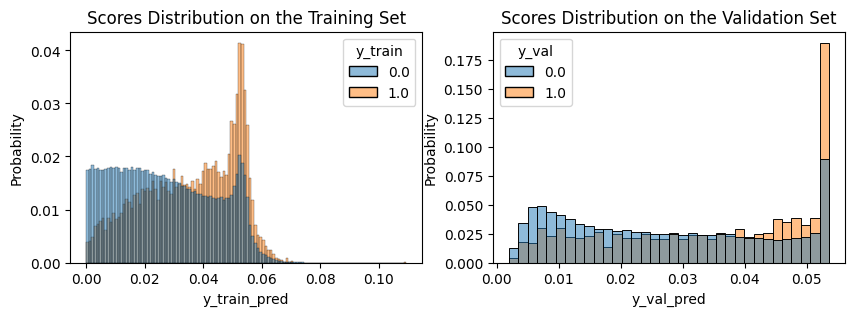

In [8]:
import os
from tqdm import tqdm
import torch
import pickle


# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

# import trainer
from executors.train_on_local_machine_mps import trainer

import random

combinations = []
for lr in [0.001,0.005,0.01]:
    for dropout in [0.2,0.5,0.7]:
        for class_weight in [33.0,50.0, 66.00]:
            for weight_decay in [0,0.0001, 0.0005,0.001]:
                combinations.append((lr,dropout,class_weight,weight_decay))

random_search = random.sample(combinations, 10)
print('grid:', random_search)

best_results = {'params':[], 
                'val_aucpr':[], 
                'val_aucroc':[], 
                'tprforbudget':[]}

for params in random_search[1:]:
    lr,dropout,class_weight,weight_decay = params
    print('Params are:', params)
    config = {
        # general
        'seed': 123,
        'metadata_file_path': './data/combined_data/metadata_only_existant_readings_09042023.csv',
        'data_folder_path': './data/individual-signals/',
        'fillna': 0,
        # training
        'batch_size': 128,
        'n_epochs': 20,
        # architecture
        'targets': ['one_year_until_death'],
        'input_dimension': 12,
        'hidden_dimmension':  64 ,       
        'attention_heads': 4 ,
        'encoder_number_of_layers': 8,
        'dropout': dropout,
        'clip': 1,
        'positional_encodings': False,
        'saving_path': f'./models/3.0-inception-bs128-imbalanced-death-aucpr-{lr}-{weight_decay}-{dropout}-{class_weight}',
        'model_type': 'Inception',
        'eval_metric':'aucpr',
        'weight_decay':weight_decay,
        'lr':lr,
        'patience':5,
        'loss_function_weight': torch.tensor([class_weight]).to('mps')
    }

    # run
    best_aucper, rocauc_given_best_aucpr, tprforbudget_given_best_aucpr = trainer(**config)

    best_results['params'].append(params)
    best_results['val_aucpr'].append(best_aucper)
    best_results['val_aucroc'].append(rocauc_given_best_aucpr)
    best_results['tprforbudget'].append(tprforbudget_given_best_aucpr)

    with open('./models/3.0-Inception-tuning.pickle', 'wb') as handle:
        pickle.dump(best_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

# to load
# with open('filename.pickle', 'rb') as handle:
#     b = pickle.load(handle)


In [4]:
best_results['params'].append(params)
best_results['val_aucpr'].append(best_aucper)
best_results['val_aucroc'].append(rocauc_given_best_aucpr)
best_results['tprforbudget'].append(tprforbudget_given_best_aucpr)

with open('./models/3.0-Inception-tuning.pickle', 'wb') as handle:
    pickle.dump(best_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [5]:
best_results

{'params': [(0.001, 0.2, 50.0, 0.0005)],
 'val_aucpr': [0.04650497527469622],
 'val_aucroc': [0.6226061665024728],
 'tprforbudget': [0.7417503586800573]}

In [ ]:
Params are: (0.01, 0.7, 66.0, 0.001)


In [11]:
import pandas as pd
pd.DataFrame(best_results)

,params,val_aucpr,val_aucroc,tprforbudget
0,"(0.001, 0.2, 50.0, 0.0005)",0.046505,0.622606,0.741750
1,"(0.001, 0.7, 66.0, 0.0005)",0.043763,0.634661,0.770445
2,"(0.001, 0.2, 66.0, 0.001)",0.043713,0.628077,0.763271
3,"(0.01, 0.7, 33.0, 0.0005)",0.513090,0.500000,1.000000
4,"(0.005, 0.5, 50.0, 0)",0.042274,0.622549,0.750359
5,"(0.001, 0.5, 33.0, 0.0001)",0.044096,0.633385,0.769727
6,"(0.01, 0.7, 66.0, 0.001)",0.393305,0.556565,0.749641
7,"(0.001, 0.2, 50.0, 0)",0.044016,0.623624,0.746772
8,"(0.005, 0.5, 33.0, 0)",0.043071,0.631679,0.763989
9,"(0.005, 0.7, 66.0, 0)",0.183310,0.601864,0.740316


# Analysis

In [20]:
[x for x in os.listdir('./models/') if '3.0-inception-bs128-imbalanced-death-aucpr-0.001-0-0.2' in x]

['3.0-inception-bs128-imbalanced-death-aucpr-0.001-0-0.2-50.0.pt',
 '3.0-inception-bs128-imbalanced-death-aucpr-0.001-0-0.2-50.0_loss.pkl']

/opt/homebrew/Caskroom/miniforge/base/envs/torch-gpu/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 50.0
************************************************************



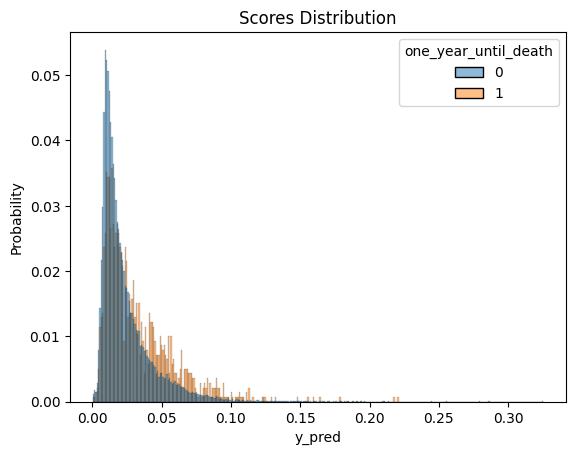

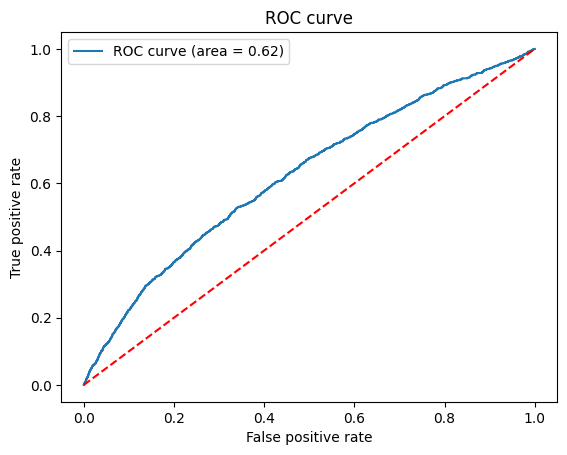

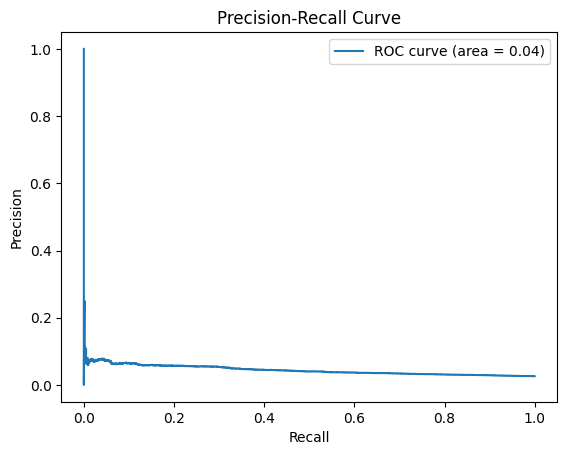

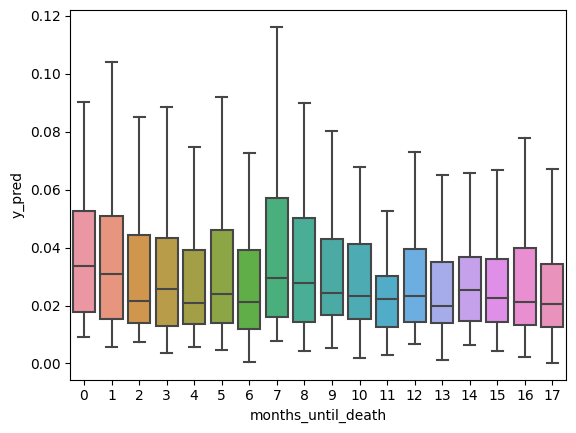

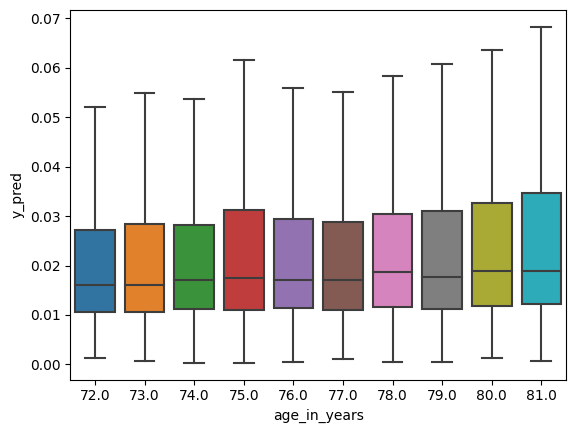

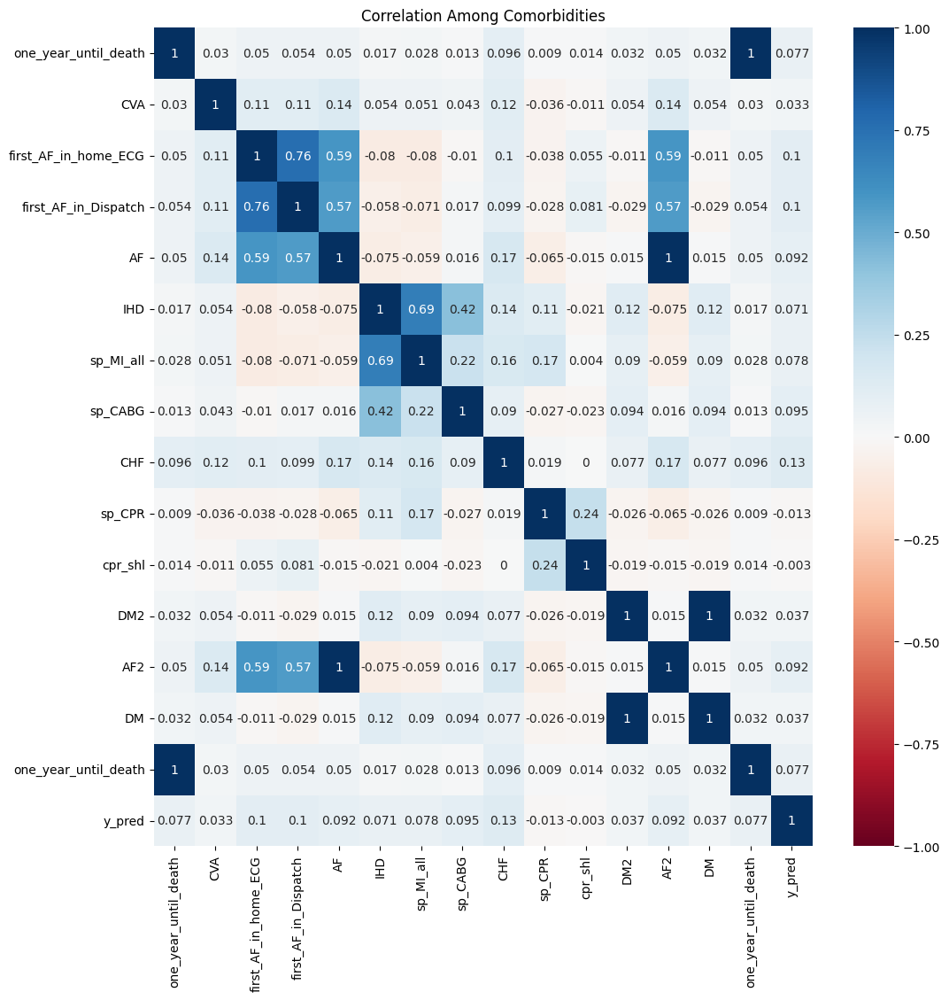

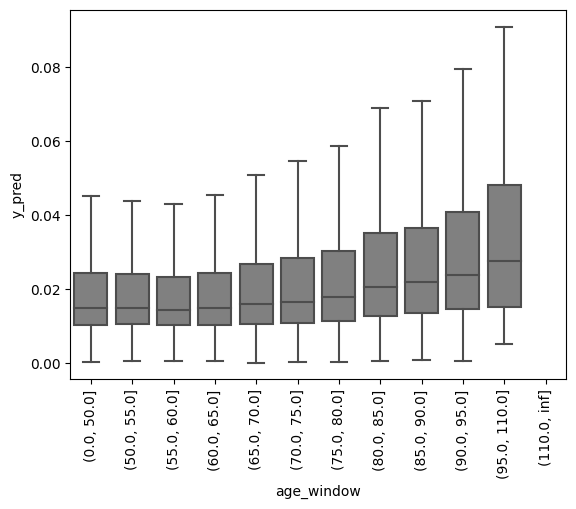

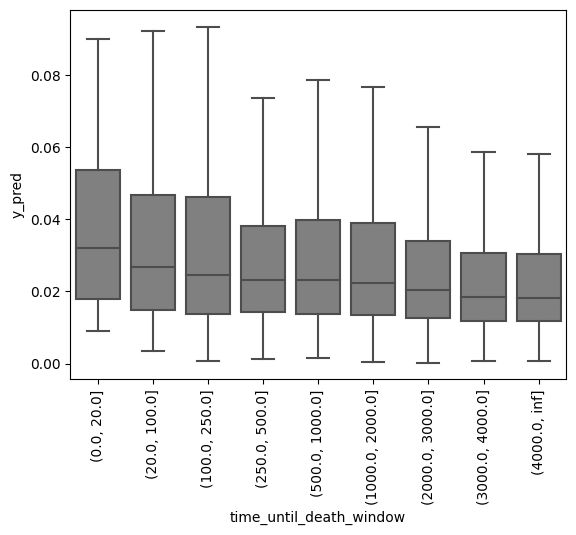

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.076508,0.134357
one_year_until_death,0.076508,1.000000,0.110725
age_in_years,0.134357,0.110725,1.000000


*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************



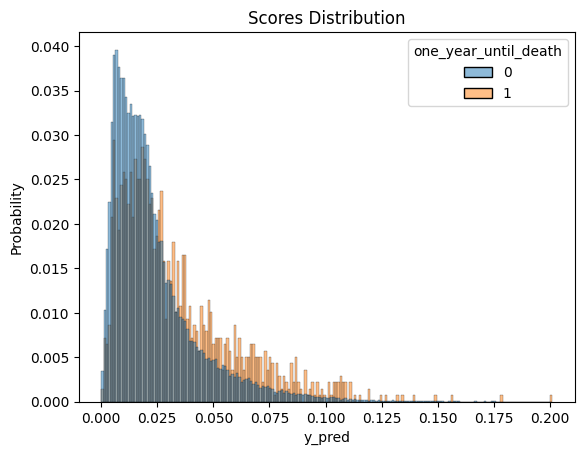

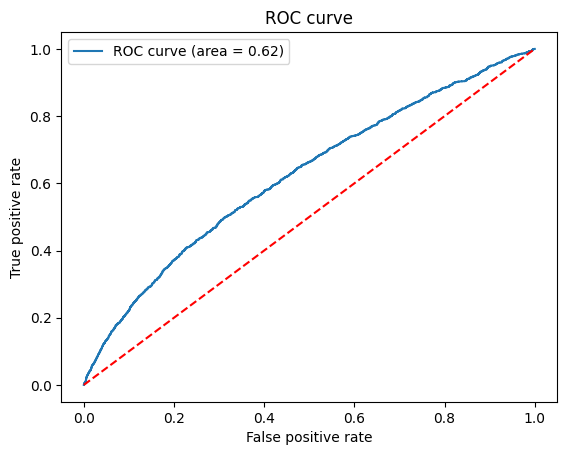

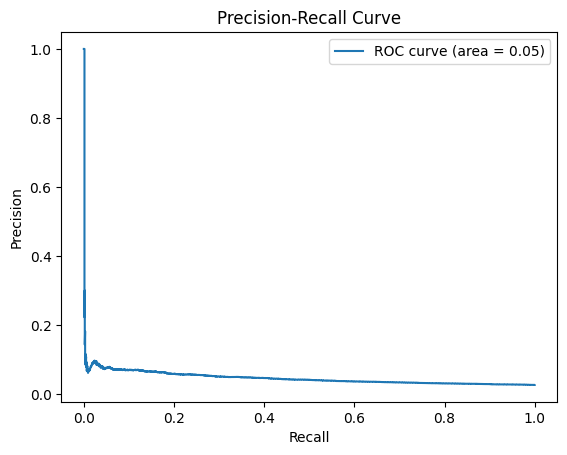

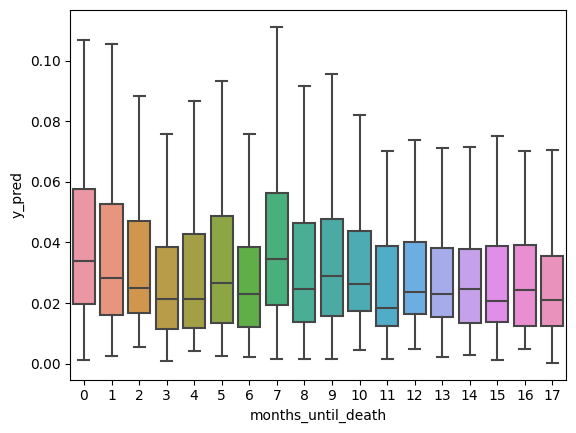

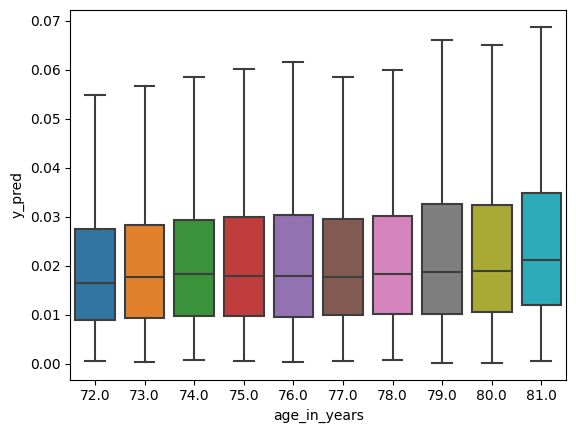

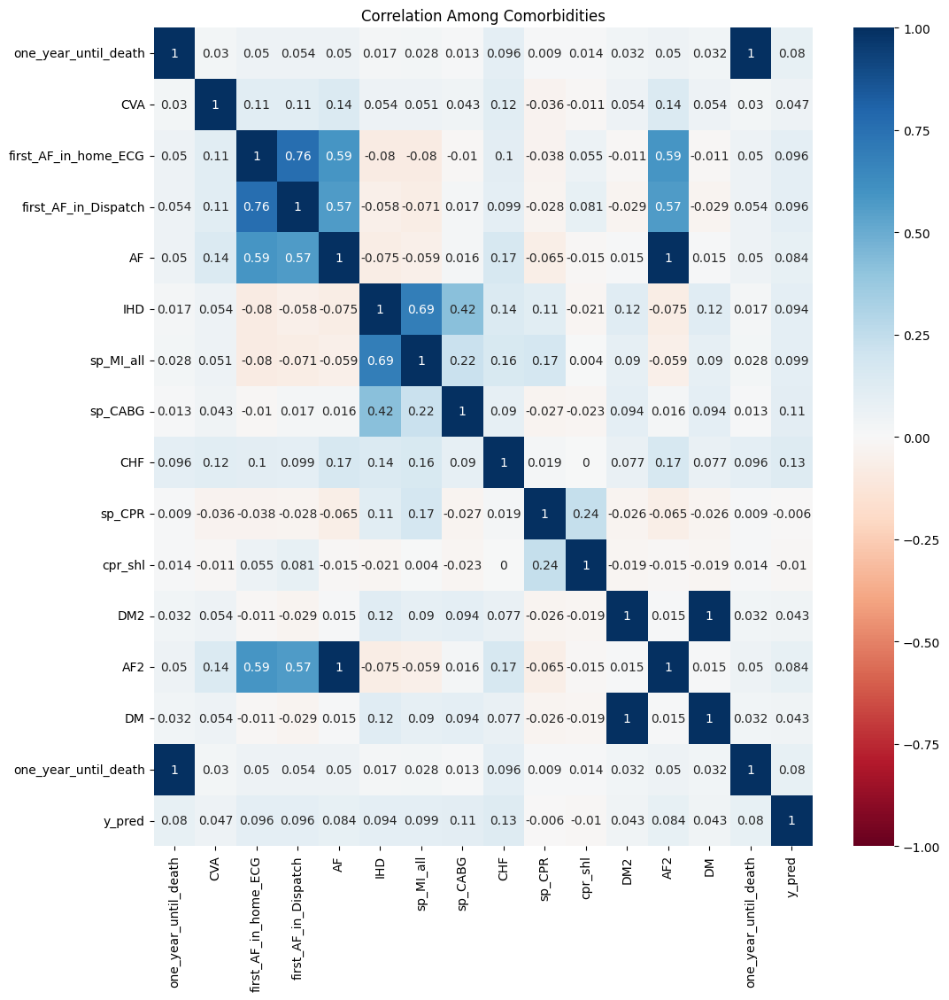

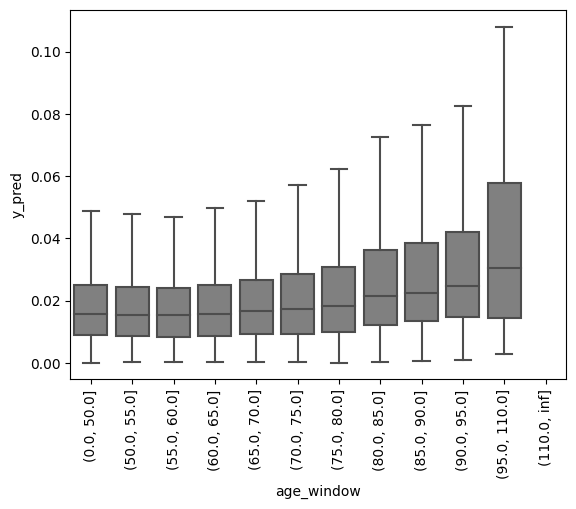

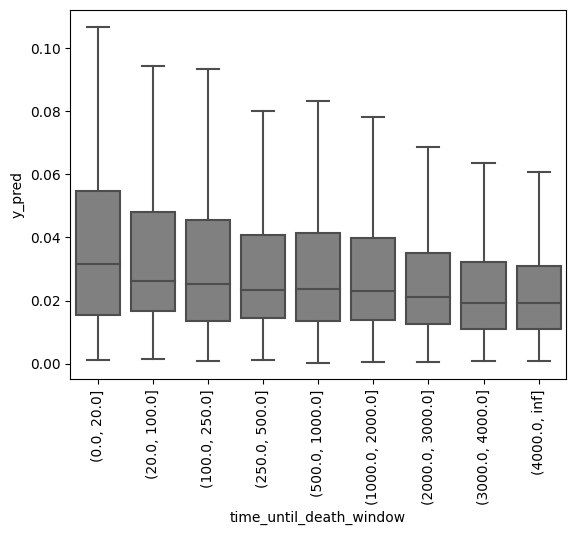

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.080346,0.153496
one_year_until_death,0.080346,1.000000,0.110725
age_in_years,0.153496,0.110725,1.000000


****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 50.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 66.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 66.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************



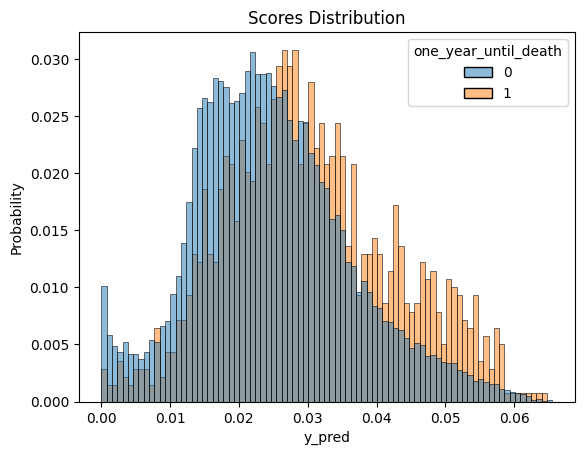

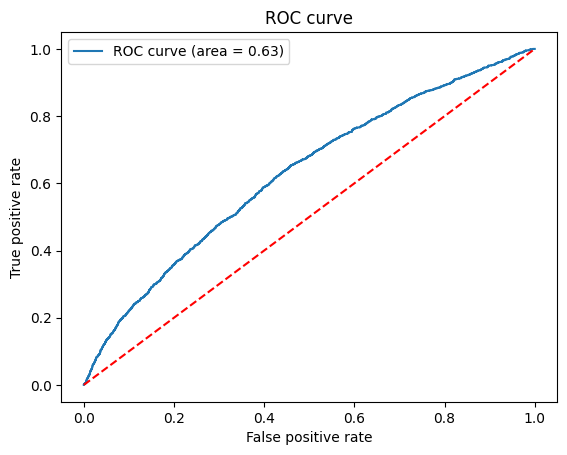

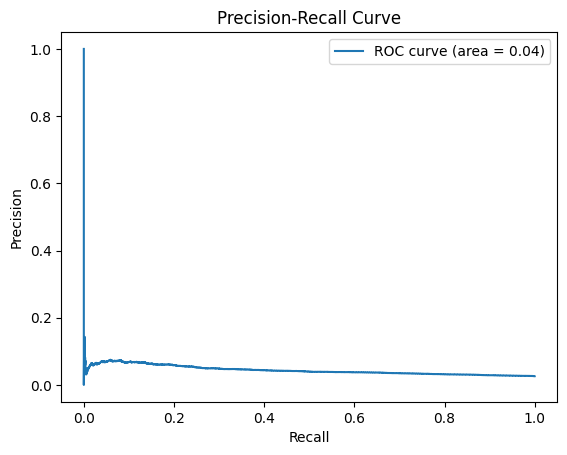

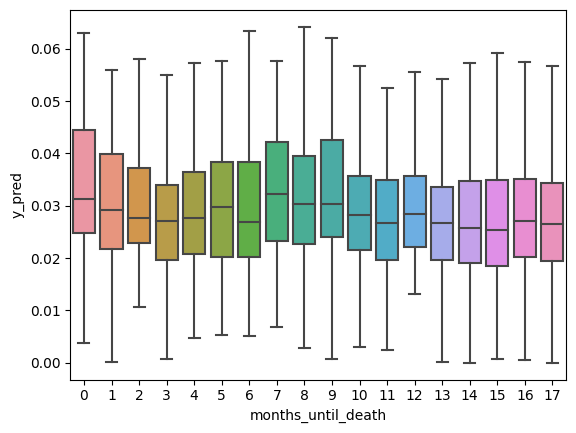

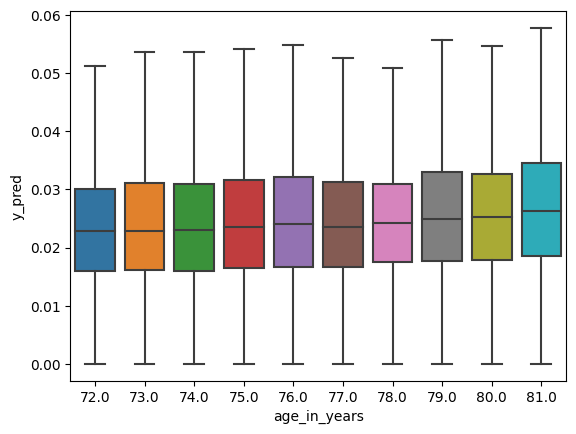

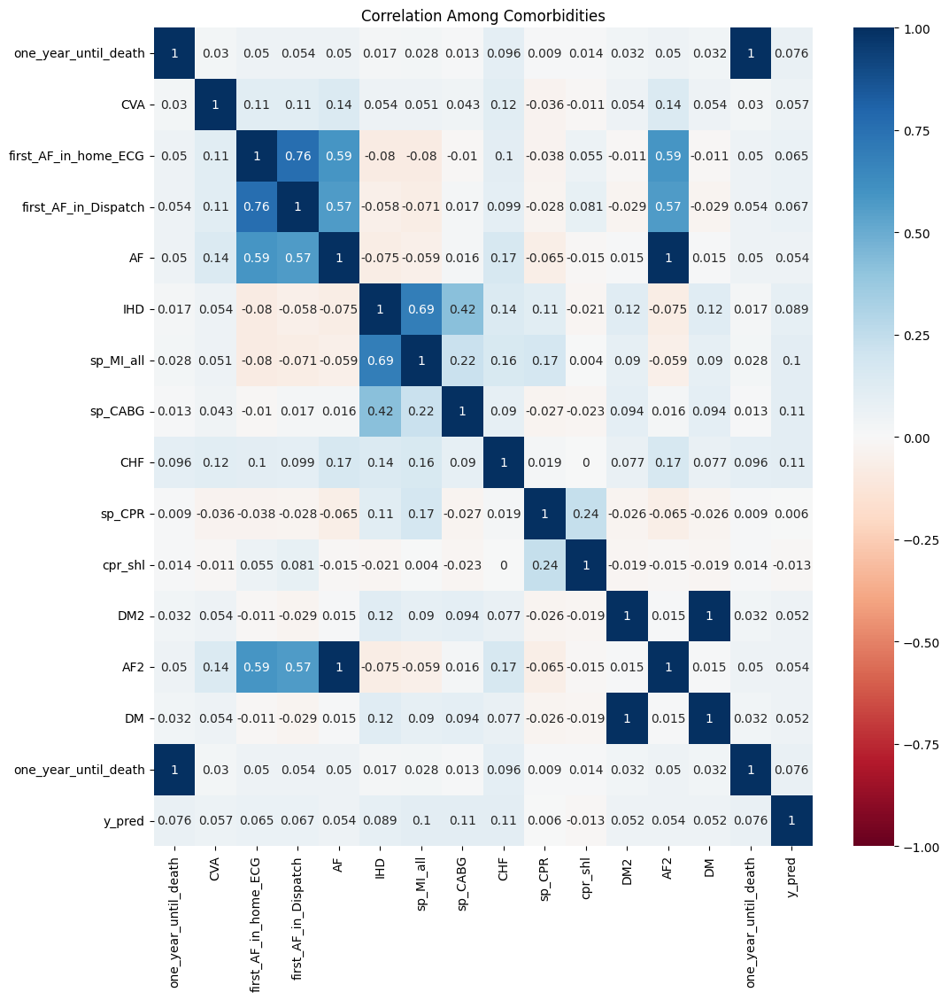

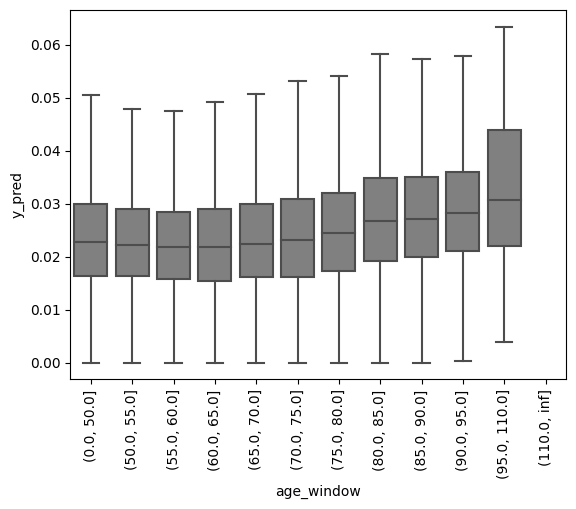

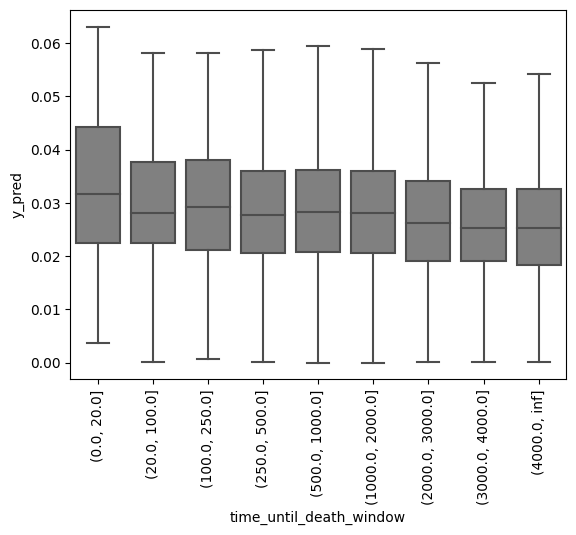

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.075885,0.147055
one_year_until_death,0.075885,1.000000,0.110725
age_in_years,0.147055,0.110725,1.000000


************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************



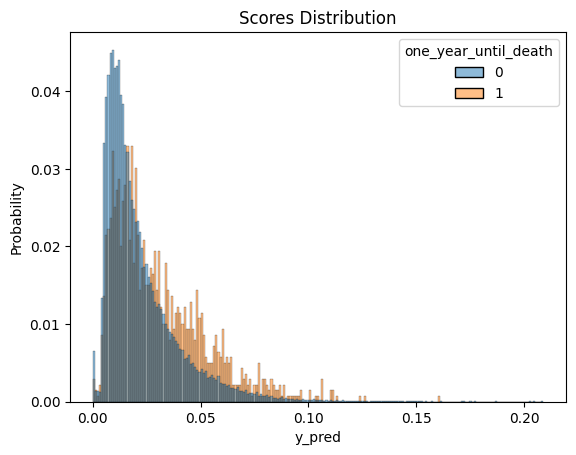

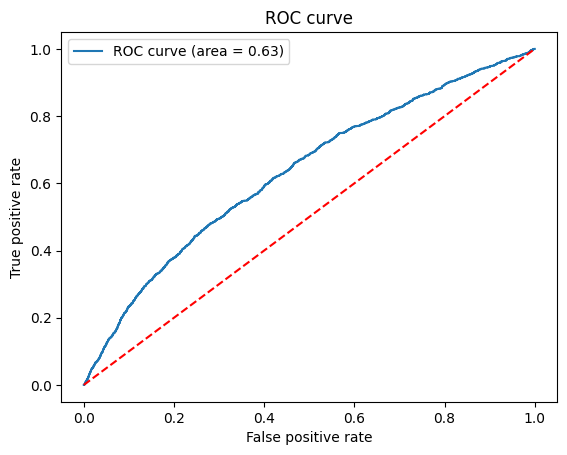

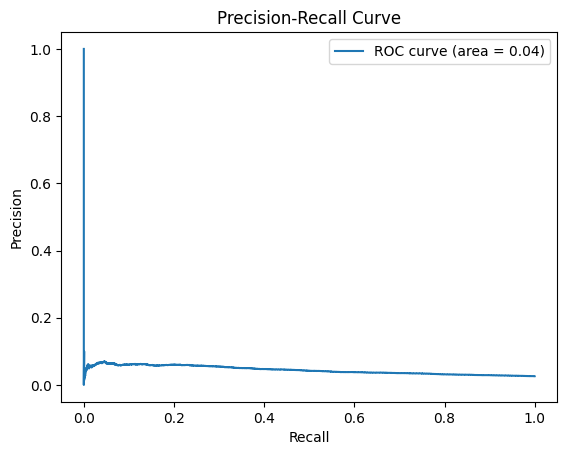

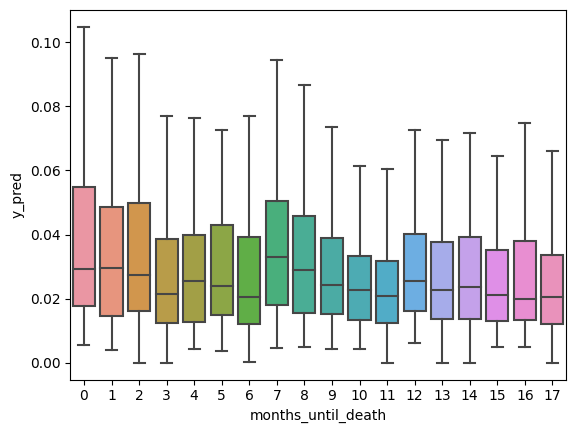

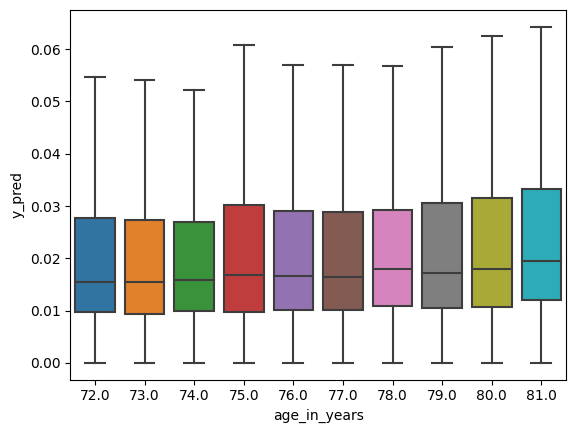

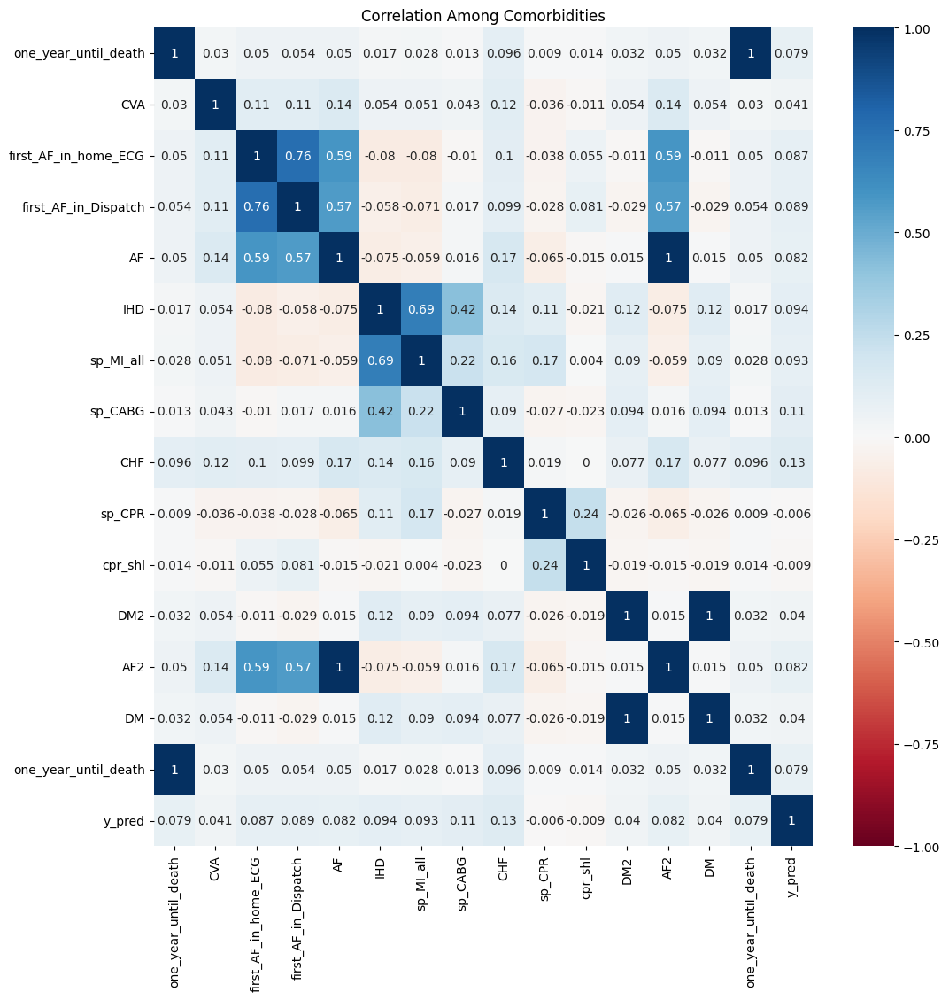

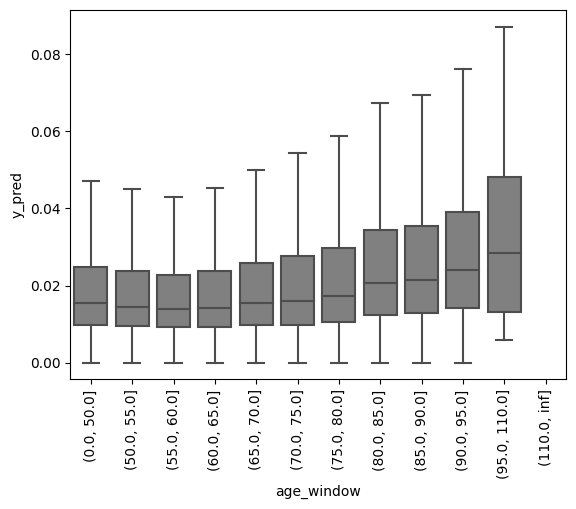

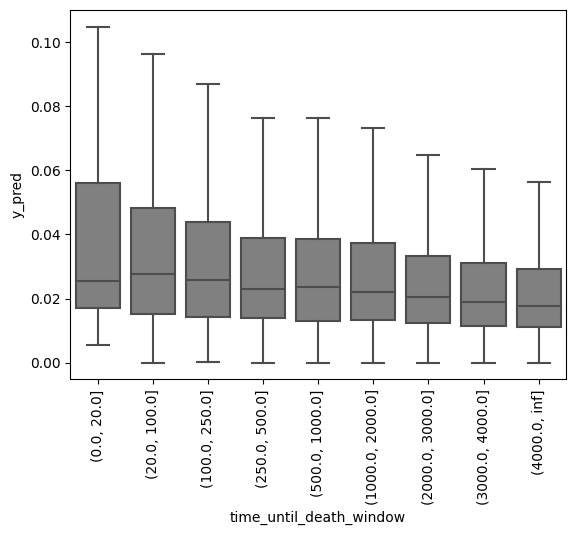

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.078644,0.144934
one_year_until_death,0.078644,1.000000,0.110725
age_in_years,0.144934,0.110725,1.000000


*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0, Class Weight: 50.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************

***********************

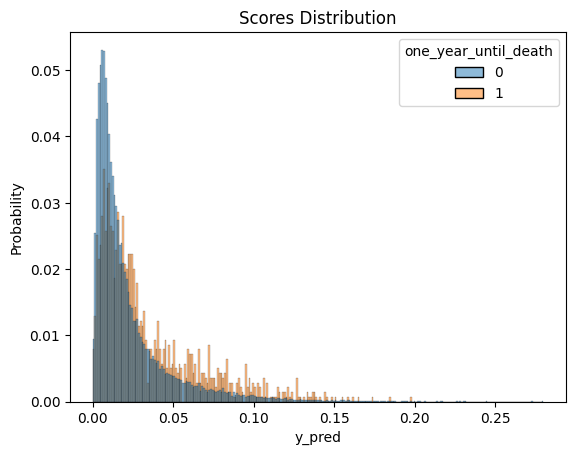

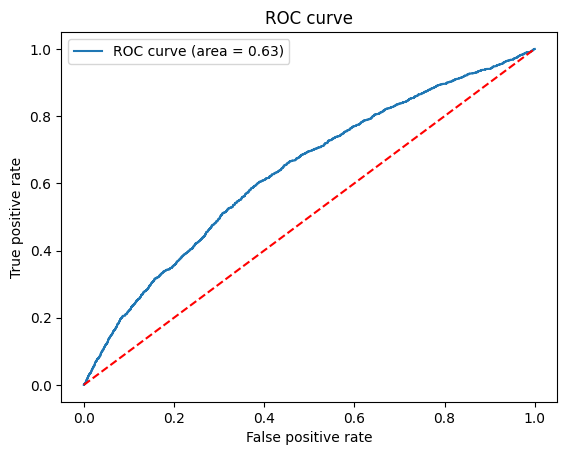

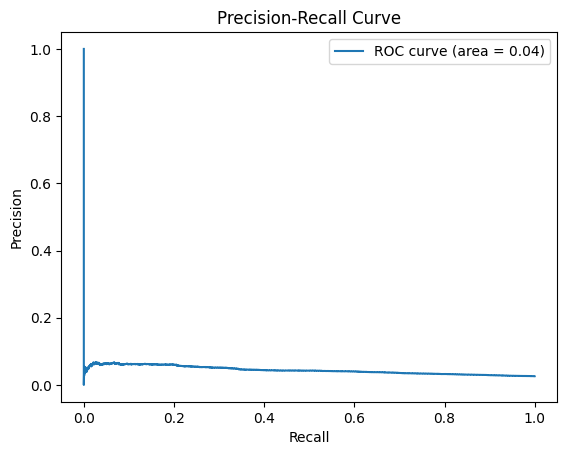

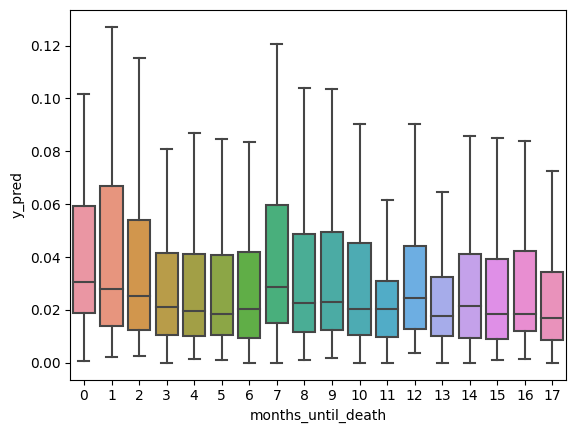

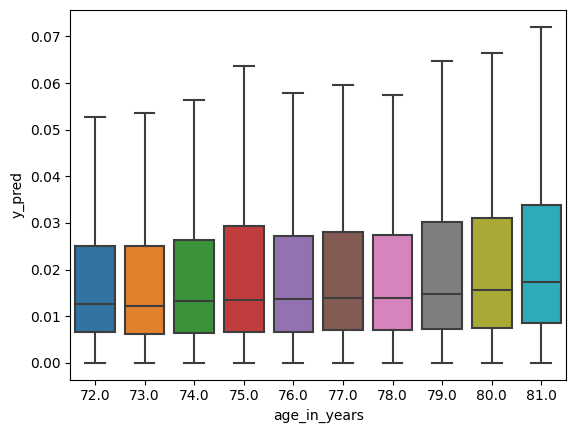

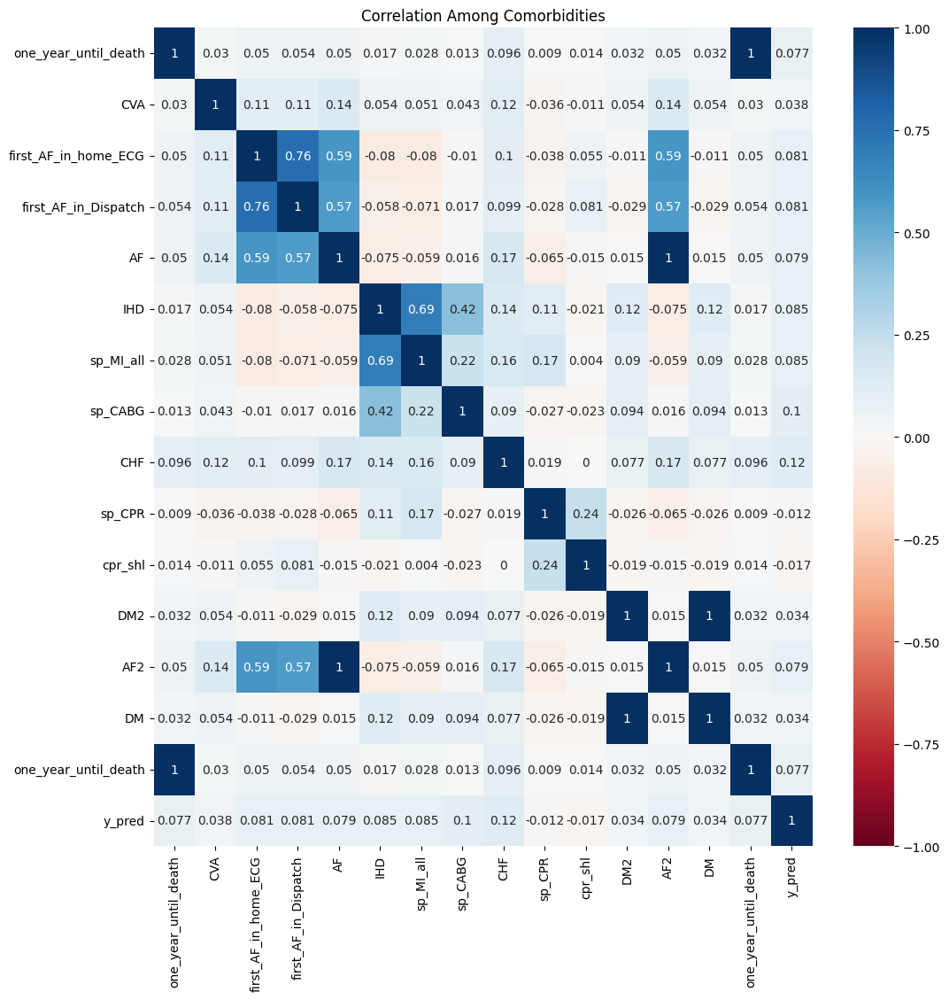

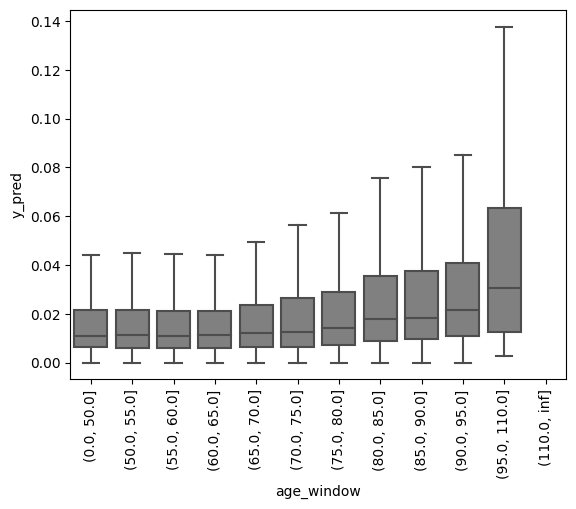

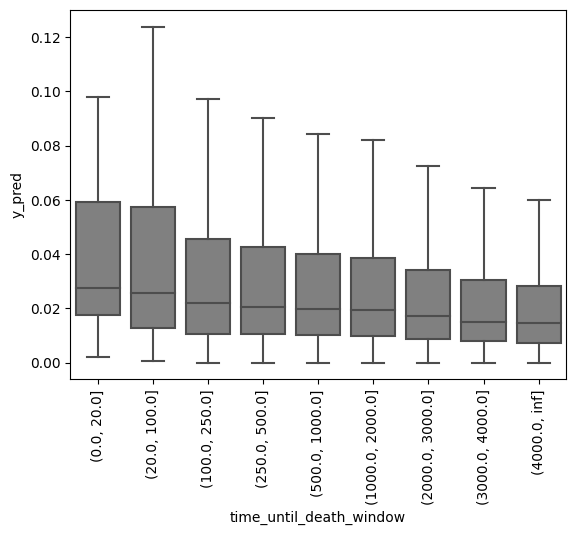

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.076648,0.133478
one_year_until_death,0.076648,1.000000,0.110725
age_in_years,0.133478,0.110725,1.000000


****************************************************************
LR: 0.001, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

**************************

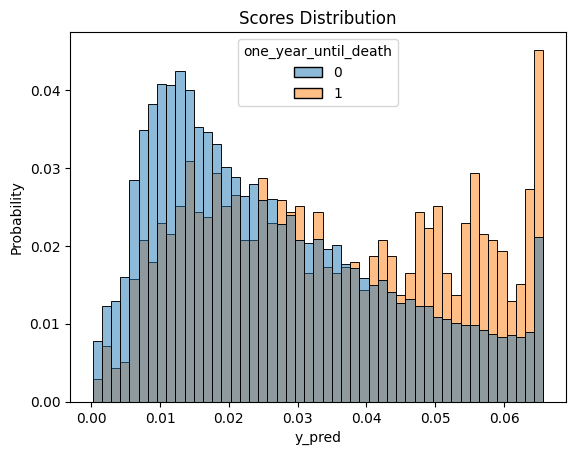

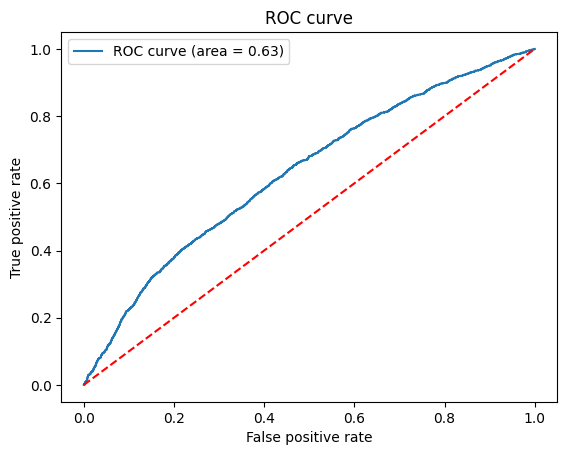

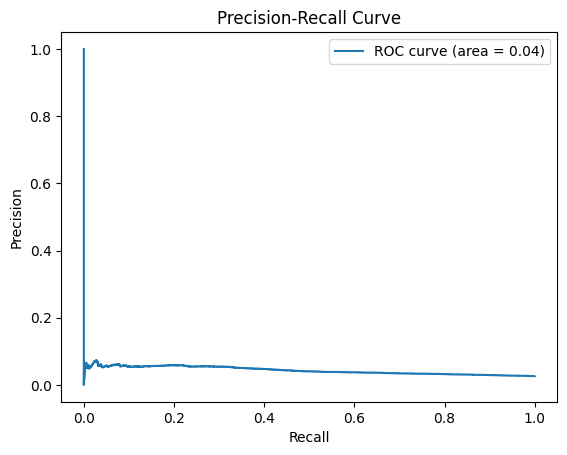

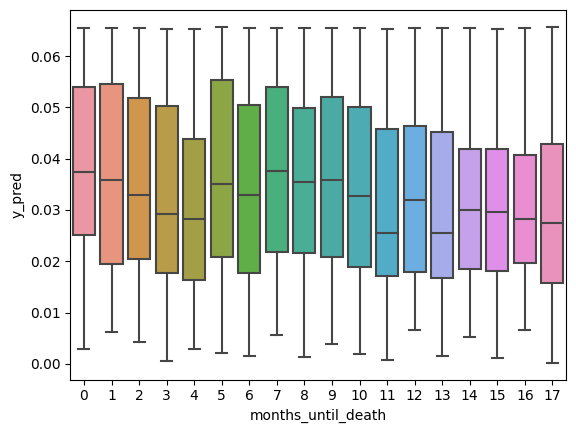

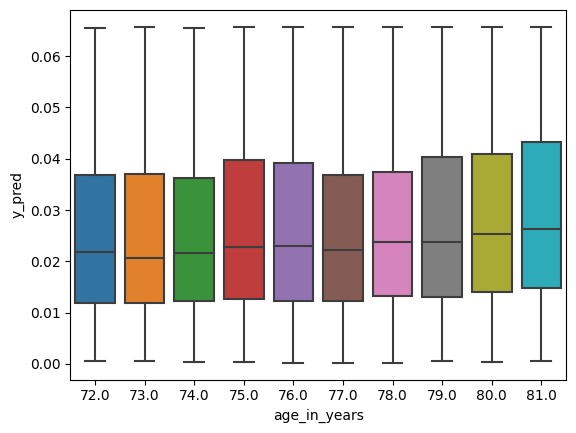

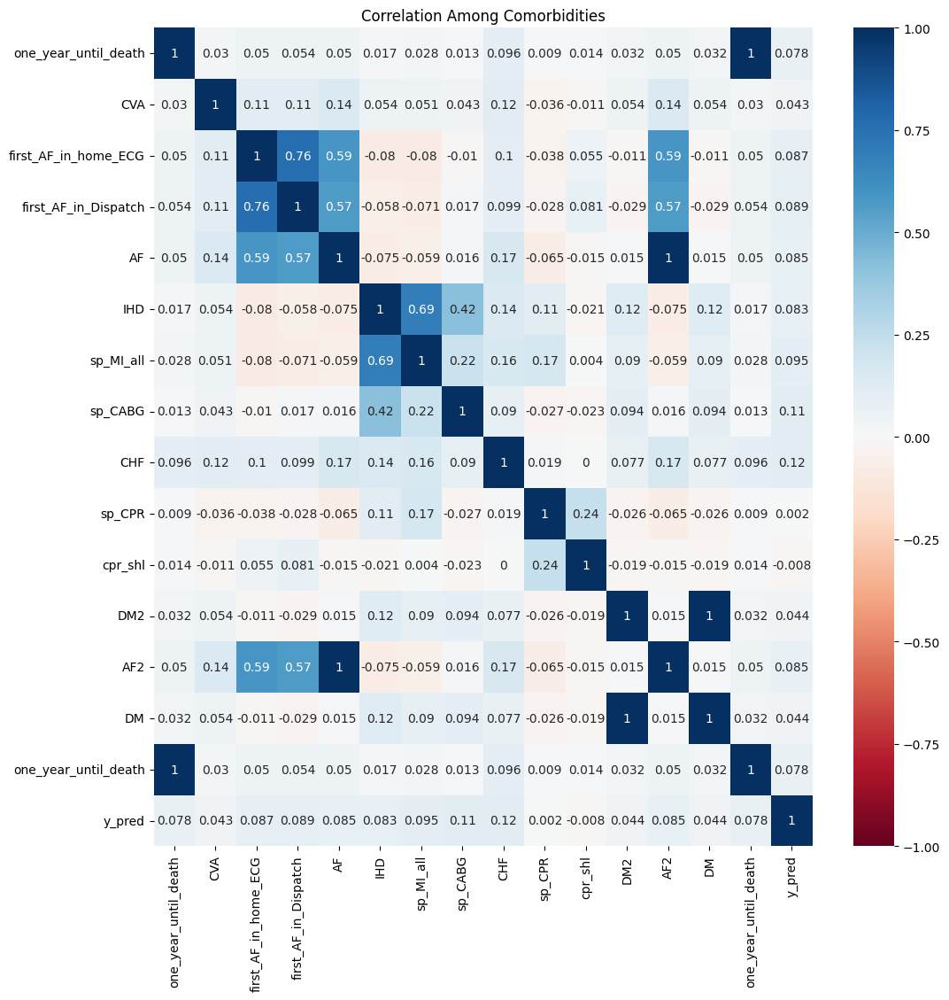

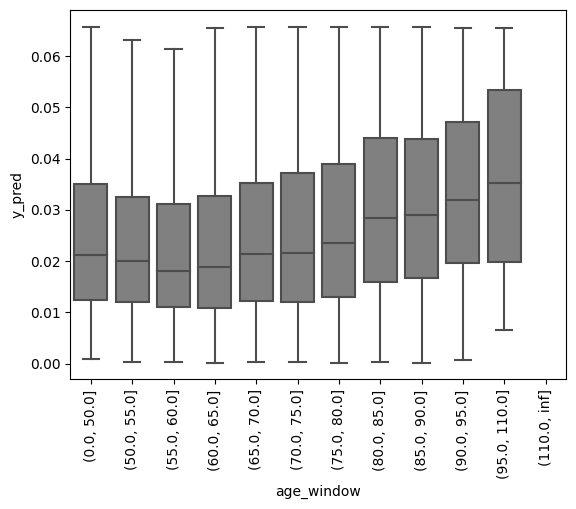

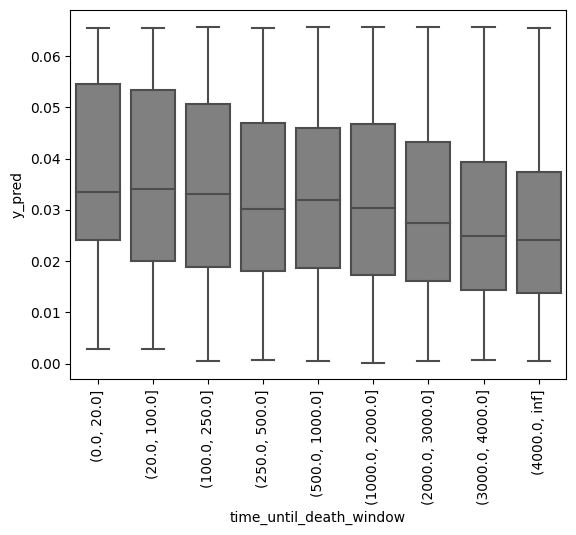

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.077947,0.146030
one_year_until_death,0.077947,1.000000,0.110725
age_in_years,0.146030,0.110725,1.000000


*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0, Class Weight: 50.0
************************************************************



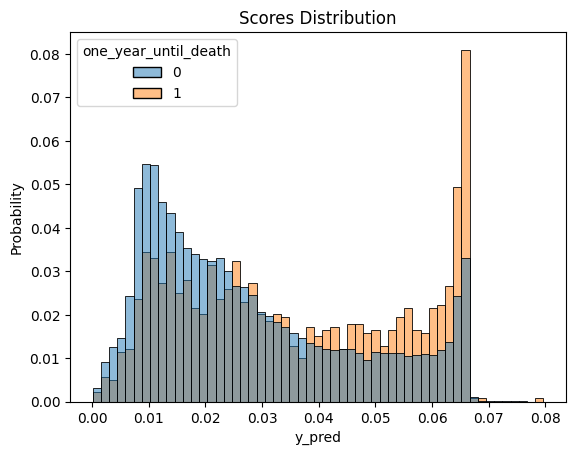

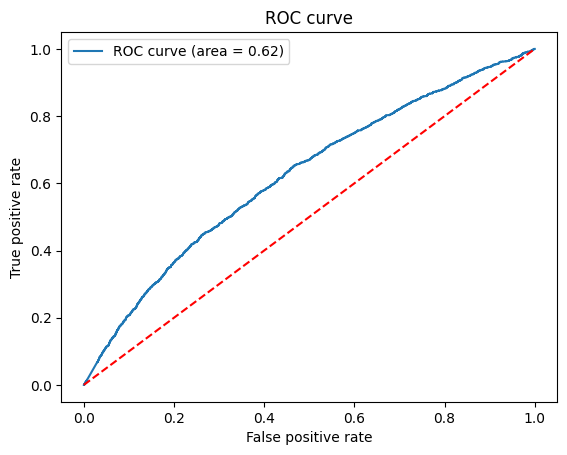

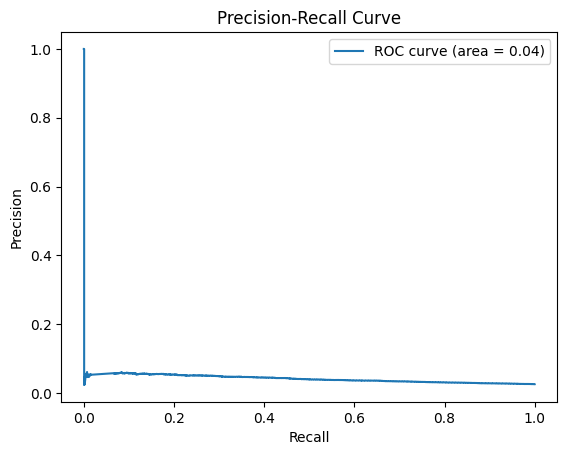

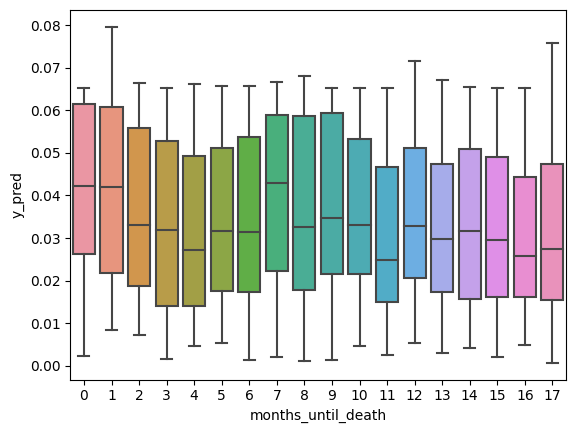

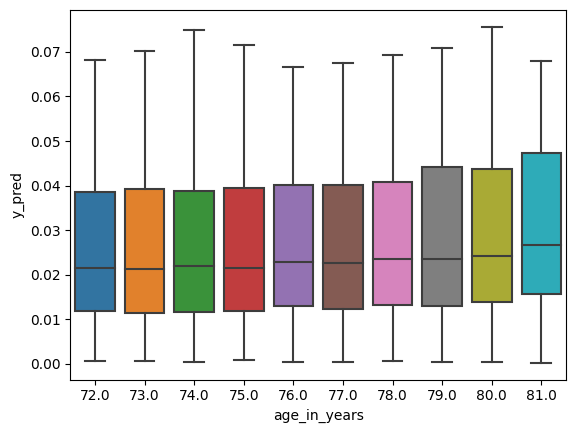

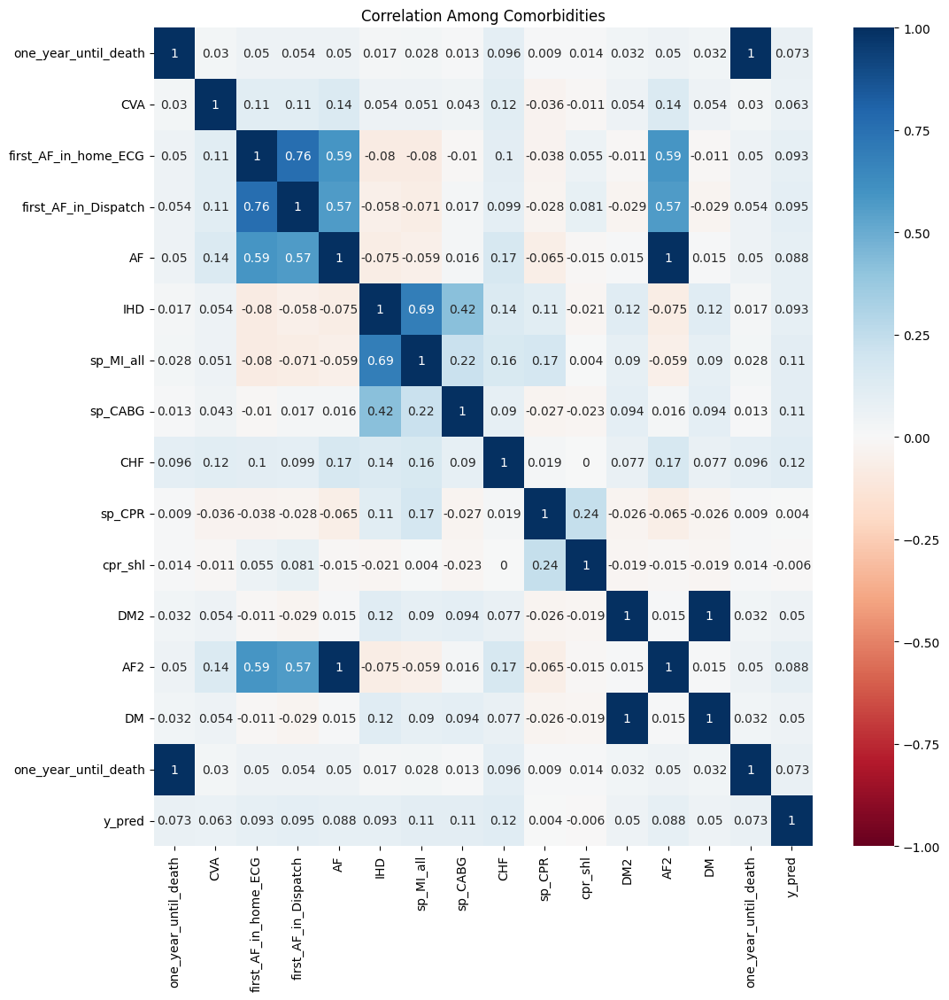

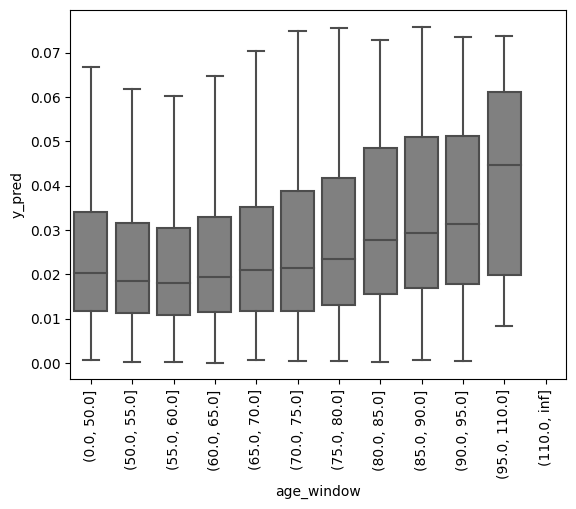

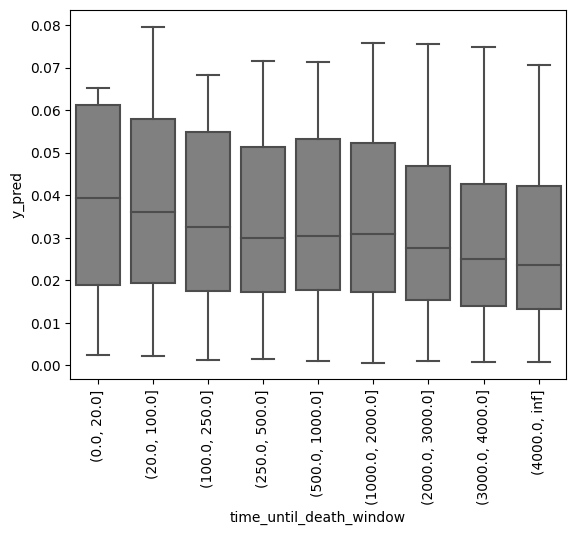

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.072814,0.161705
one_year_until_death,0.072814,1.000000,0.110725
age_in_years,0.161705,0.110725,1.000000


*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 50.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0, Class Weight: 66.0
************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

***********************

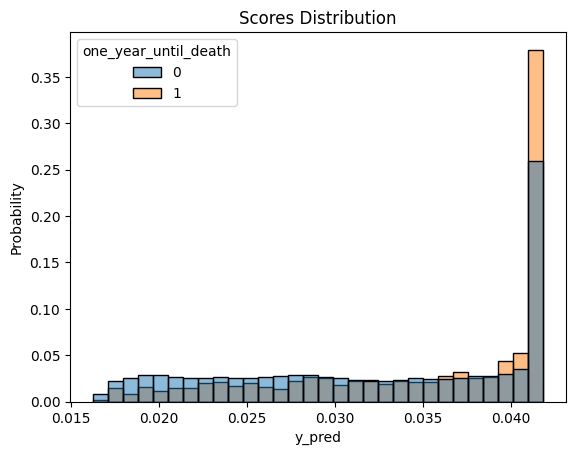

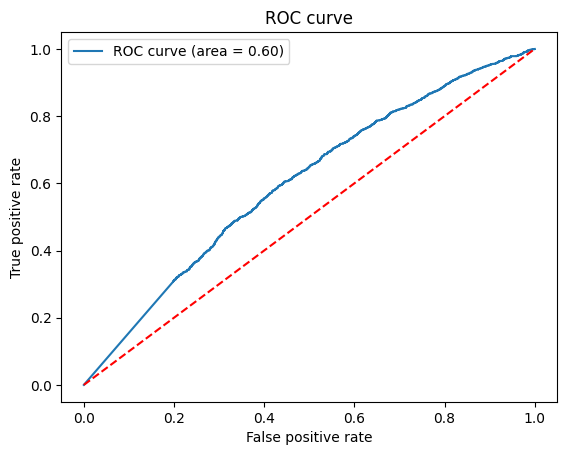

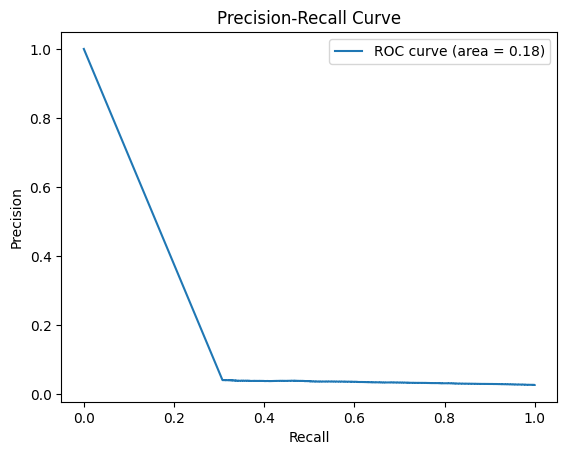

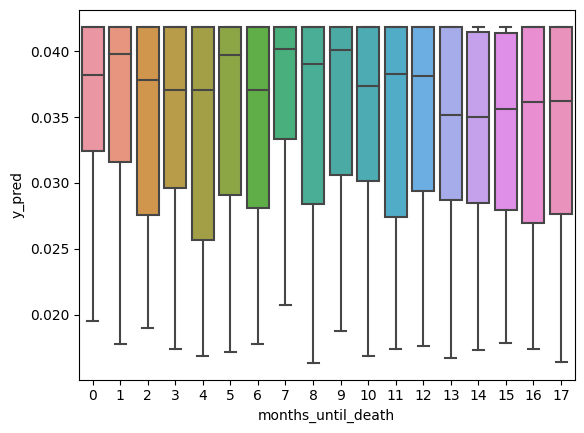

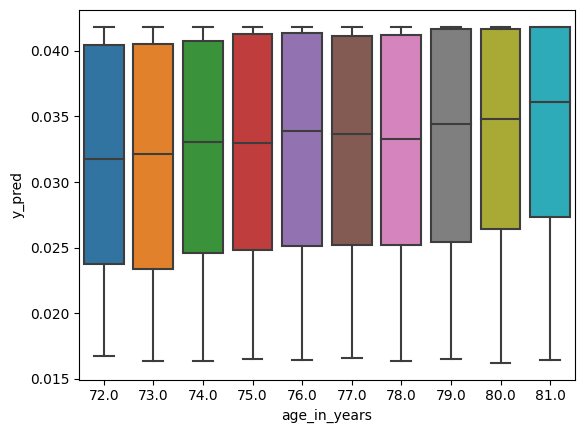

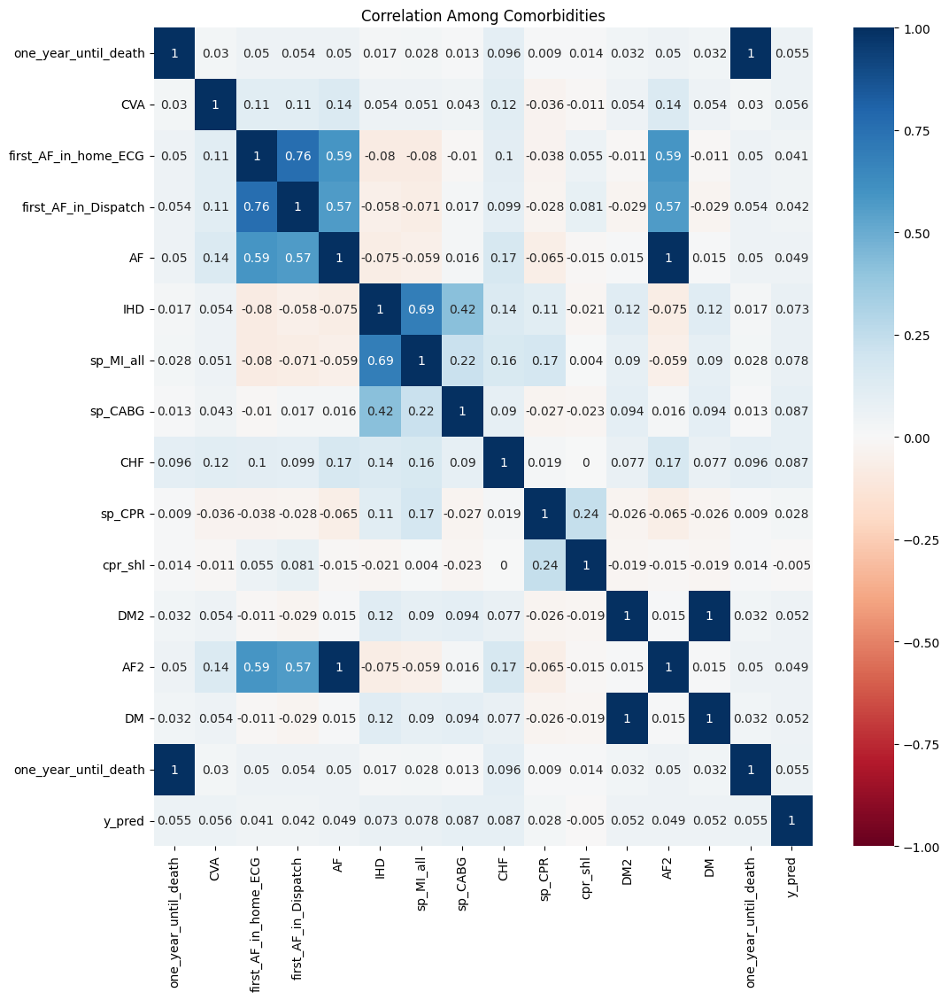

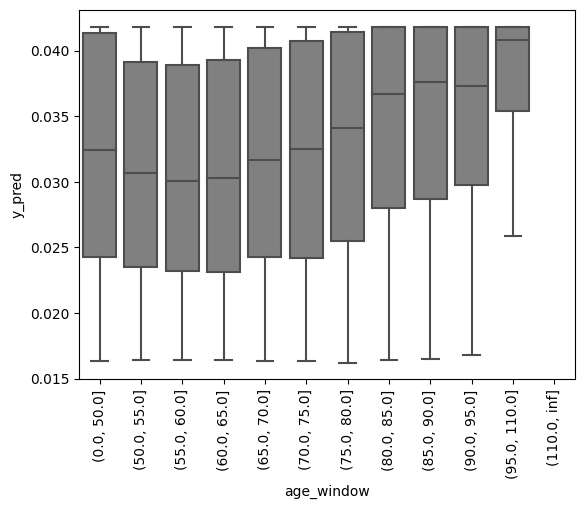

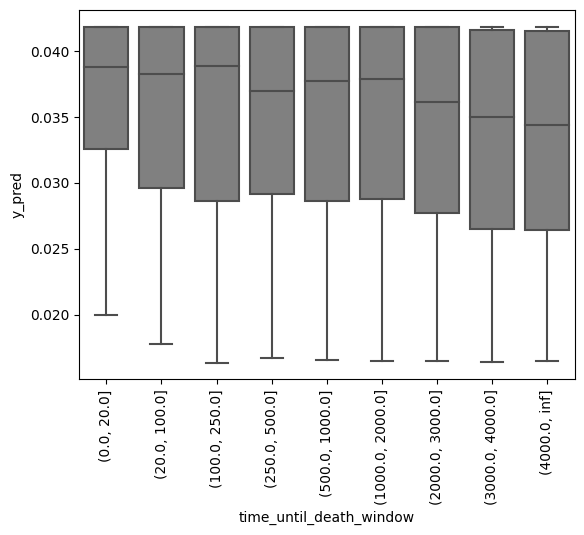

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.054784,0.139922
one_year_until_death,0.054784,1.000000,0.110725
age_in_years,0.139922,0.110725,1.000000


*****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.0005, Class Weight: 66.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************

***********************************************************
LR: 0.01, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
***********************************************************

****************************************************************
LR: 0.01, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
****************************************************************

*****************************

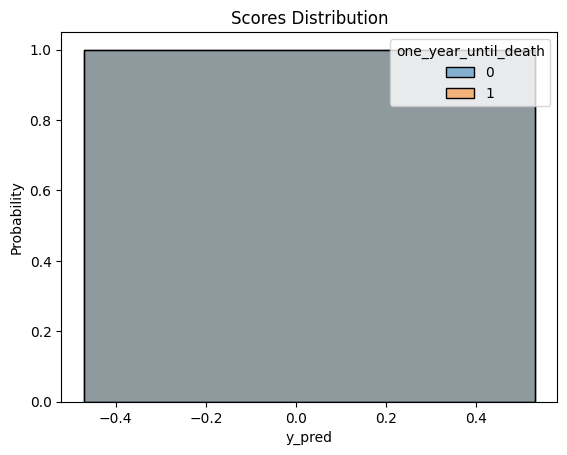

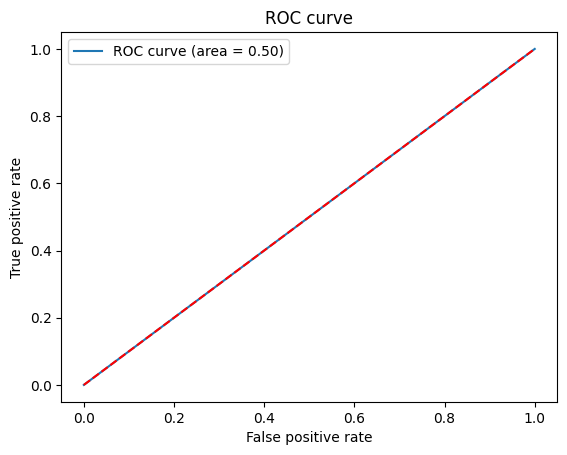

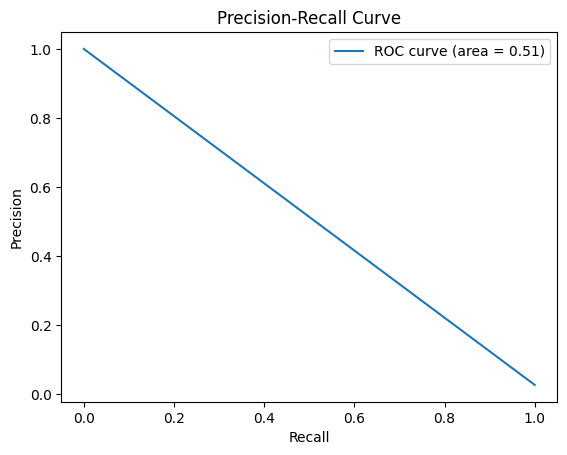

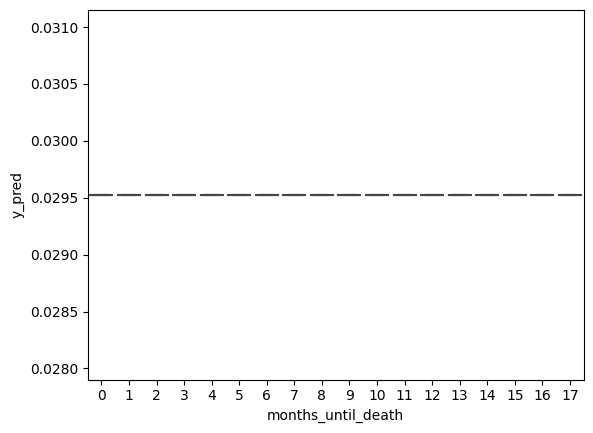

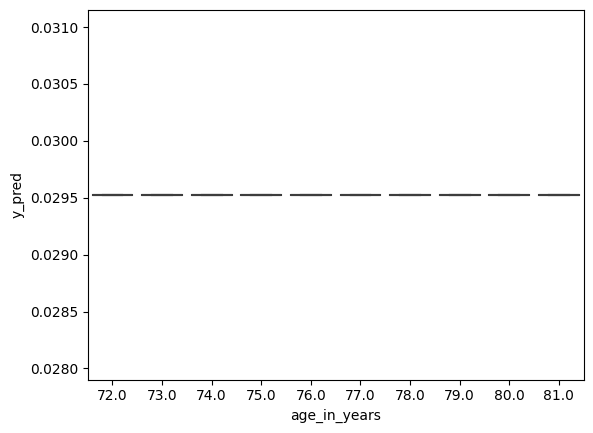

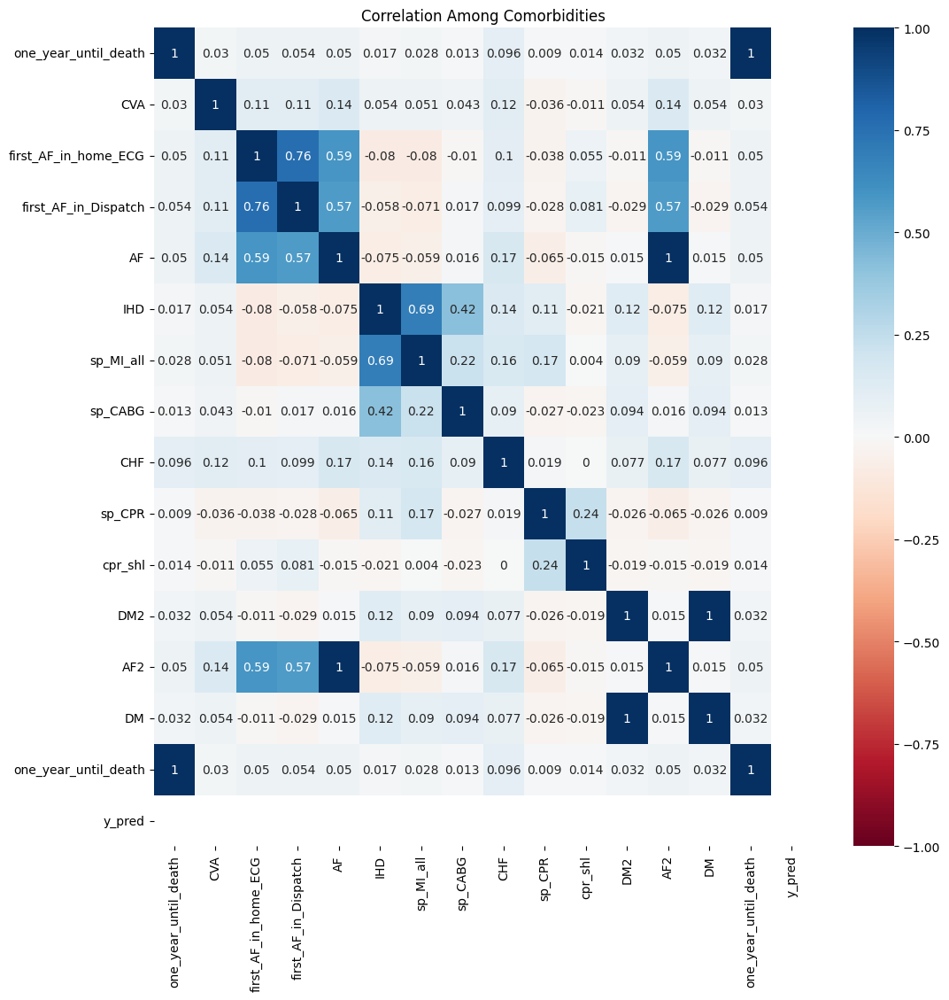

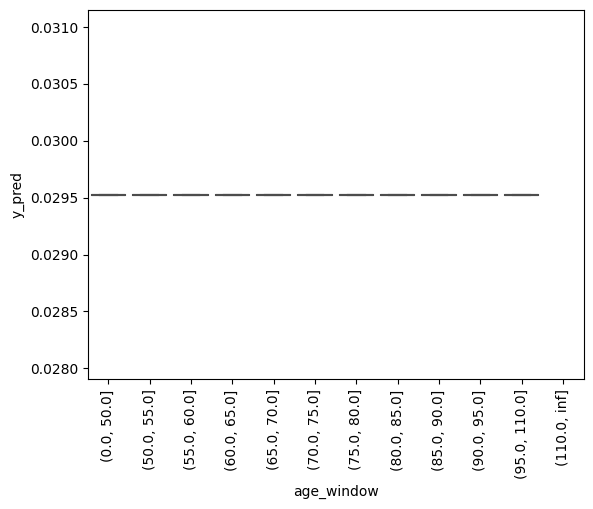

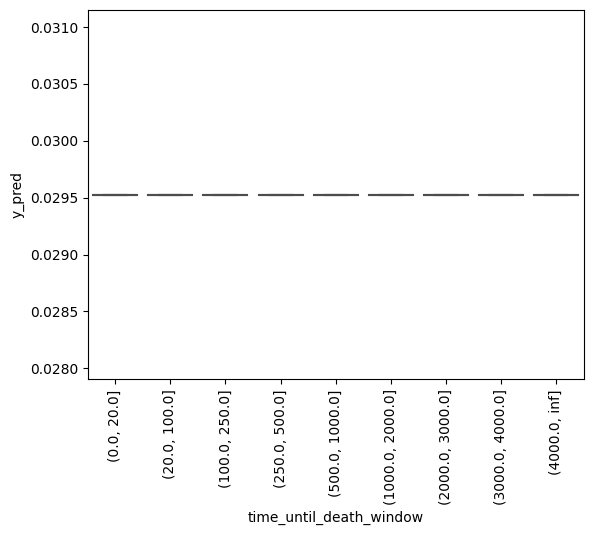

,y_pred,one_year_until_death,age_in_years
y_pred,NaN,NaN,NaN
one_year_until_death,NaN,1.000000,0.110725
age_in_years,NaN,0.110725,1.000000


***************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 33.0
***************************************************************

***********************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0, Class Weight: 50.0
***********************************************************

****************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.0001, Class Weight: 50.0
****************************************************************

****************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.0005, Class Weight: 50.0
****************************************************************

***************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 50.0
***************************************************************

*****************************************

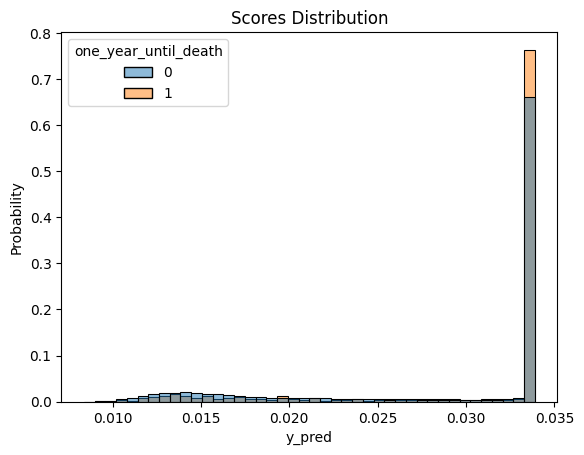

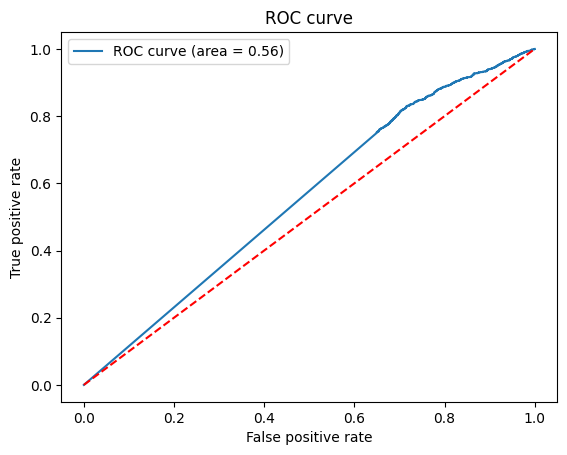

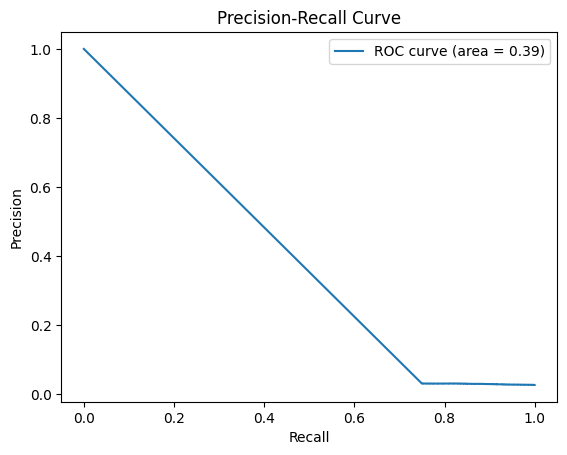

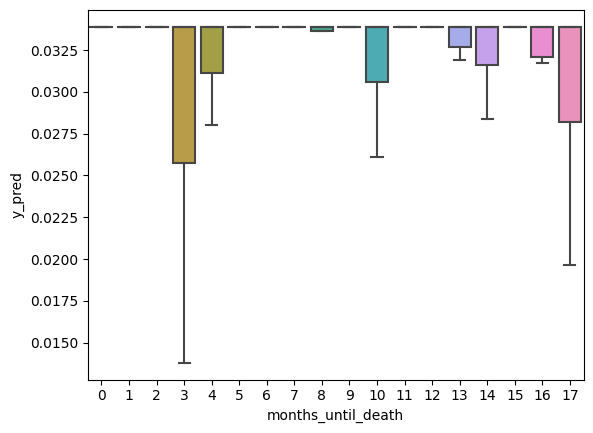

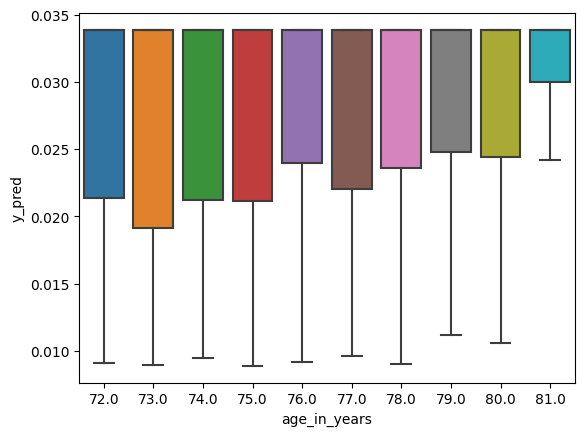

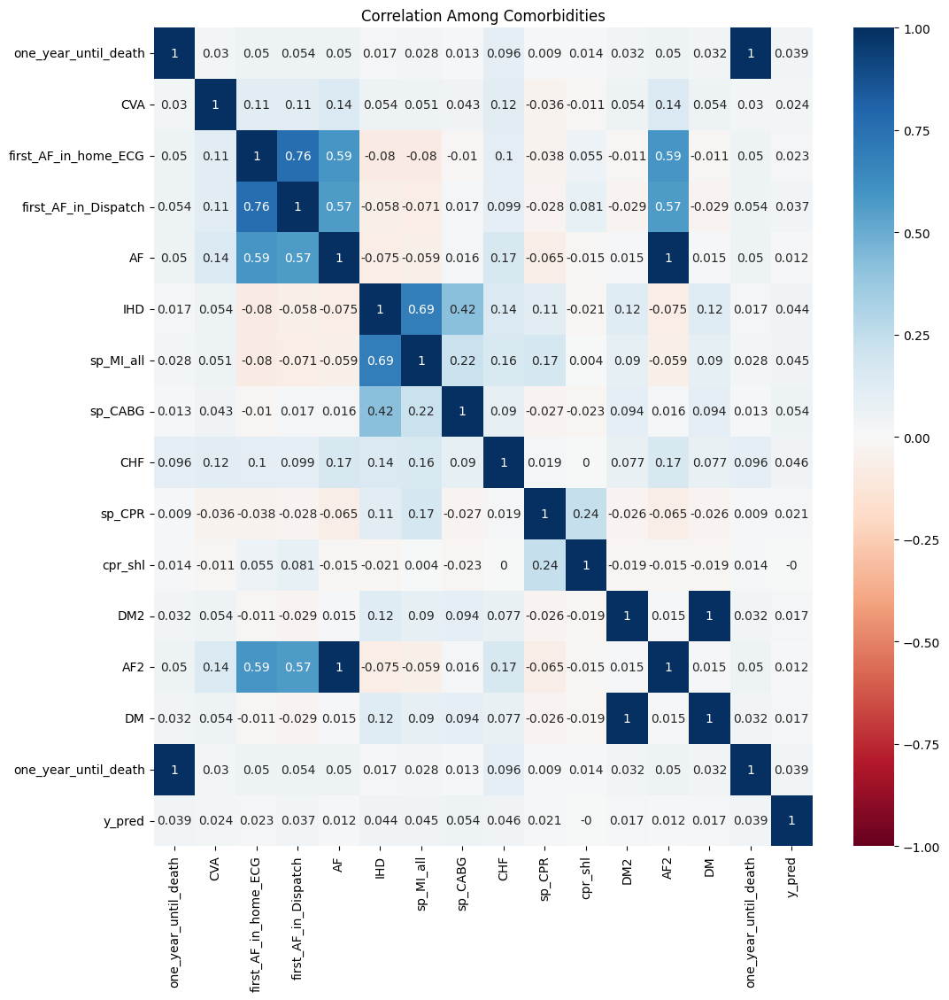

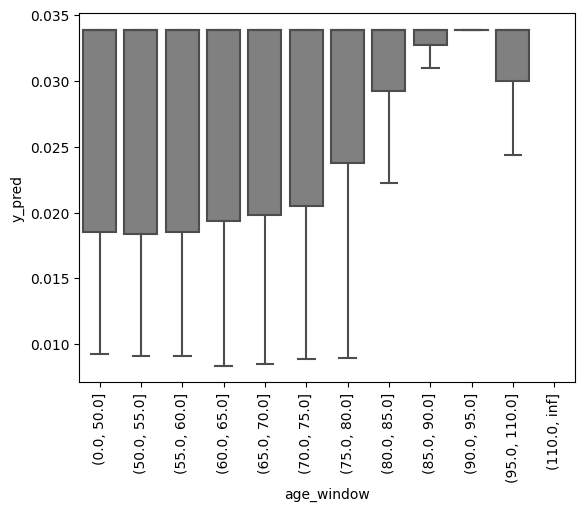

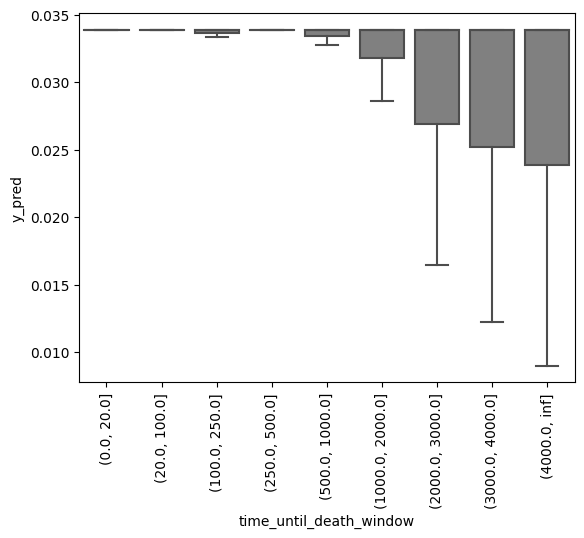

,y_pred,one_year_until_death,age_in_years
y_pred,1.000000,0.038899,0.100667
one_year_until_death,0.038899,1.000000,0.110725
age_in_years,0.100667,0.110725,1.000000


In [1]:
import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

from modeling.Inception import *
from utils.plots import *


# import trainer
from executors.train_on_local_machine_mps import trainer



for lr in [0.001,0.005,0.01]:
    for dropout in [0.2,0.5,0.7]:
        for class_weight in [33.0,50.0, 66.00]:
            for weight_decay in [0,0.0001, 0.0005,0.001]:
                try:
                    print('*'*len(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}'))
                    print(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}')
                    print('*'*len(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}'))
                    print()

                    # Load model
                    model = DownstreamInception(dropout=dropout)
                    model.load_state_dict(torch.load(f'./models/3.0-inception-bs128-imbalanced-death-aucpr-{lr}-{weight_decay}-{dropout}-{class_weight}.pt'))
                    
                    # load data
                    data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
                    data = data[data['sample'] == 'validation'].reset_index(drop=True)
                    predictions, non_missing_leads = predict(data['reading'], model, data)
                    data['y_pred'] = predictions
                    data['non_missing_leads'] = non_missing_leads
                    post_reg_analysis(data, 'one_year_until_death', 'y_pred')

                    data['age_window'] = pd.cut(data['age_in_years'], bins = [0,50,55,60,65,70,75,80,85,90,95,110,np.inf])
                    data['age_window'].value_counts()

                    sns.boxplot(data = data, y = 'y_pred', x = 'age_window',showfliers = False, color='grey')
                    plt.xticks(rotation = 90)
                    plt.show()


                    data['time_until_death_window'] = pd.cut(data['days_until_approximate_death'], bins=[0,20,100,250,500,1000,2000,3000,4000,np.inf])
                    sns.boxplot(data = data, y = 'y_pred', x = 'time_until_death_window',showfliers = False, color='grey')
                    plt.xticks(rotation = 90)
                    plt.show()

                    display(data[['y_pred','one_year_until_death','age_in_years']].corr())

                except:
                    continue


# Are all regression the same?

In [3]:
import os

# make sure we're in the correct directory
os.chdir('/Users/davidharar/Documents/School/thesis/downstream_classification')

from modeling.Inception import *
from utils.plots import *
from utils.metrics import *
from executors.train_on_local_machine_mps import trainer


# Load Validation Data
data = pd.read_csv('./data/combined_data/metadata_only_existant_readings_09042023.csv',index_col=0)
data = data[data['sample'] == 'validation'].reset_index(drop=True)

def get_threshold_for_fpr_budget(y_true, y_pred, fpr_budget = 0.6):
    """
    This funciton tells for a budget of false positive rate, what rate of true positives we can get.
    """
    from sklearn.metrics import roc_curve

    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    closest_index = np.argmin(np.abs(fpr - fpr_budget))
    return thresholds[closest_index]

for lr in [0.001,0.005,0.01]:
    for dropout in [0.2,0.5,0.7]:
        for class_weight in [33.0,50.0, 66.00]:
            for weight_decay in [0,0.0001, 0.0005,0.001]:
                try:
                    print('*'*len(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}'))
                    print(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}')
                    print('*'*len(f'LR: {lr}, Dropout: {dropout}, Weight Decay: {weight_decay}, Class Weight: {class_weight}'))
                    print()

                    # Load model
                    model = DownstreamInception(dropout=dropout)
                    model.load_state_dict(torch.load(f'./models/3.0-inception-bs128-imbalanced-death-aucpr-{lr}-{weight_decay}-{dropout}-{class_weight}.pt'))
                    
                    # get scores
                    predictions, non_missing_leads = predict(data['reading'], model, data)
                    data[f'y_score_{lr}_{dropout}_{class_weight}_{weight_decay}'] = predictions

                    # get threshold for specific False Positive Budget
                    threshold = get_threshold_for_fpr_budget(data['y_true'].values, 
                                                             data[f'y_score_{lr}_{dropout}_{class_weight}_{weight_decay}'].values, 
                                                             fpr_budget = 0.6)
                    data[f'y_label_{lr}_{dropout}_{class_weight}_{weight_decay}'] = (data[f'y_score_{lr}_{dropout}_{class_weight}_{weight_decay}']>=threshold).astype(int)

                except:
                    continue


************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 50.0
************************************************************



*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************



****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 50.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0, Class Weight: 66.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 66.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************



************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************



*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0, Class Weight: 50.0
************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.001, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************

***********************

****************************************************************
LR: 0.001, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.2, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

**************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 33.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 33.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 33.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0, Class Weight: 50.0
************************************************************



*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 50.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0005, Class Weight: 50.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.001, Class Weight: 50.0
****************************************************************

************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0, Class Weight: 66.0
************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.5, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

***********************

*****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.0001, Class Weight: 66.0
*****************************************************************

*****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.0005, Class Weight: 66.0
*****************************************************************

****************************************************************
LR: 0.005, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 66.0
****************************************************************

***********************************************************
LR: 0.01, Dropout: 0.2, Weight Decay: 0, Class Weight: 33.0
***********************************************************

****************************************************************
LR: 0.01, Dropout: 0.2, Weight Decay: 0.0001, Class Weight: 33.0
****************************************************************

*****************************

***************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 33.0
***************************************************************

***********************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0, Class Weight: 50.0
***********************************************************

****************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.0001, Class Weight: 50.0
****************************************************************

****************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.0005, Class Weight: 50.0
****************************************************************

***************************************************************
LR: 0.01, Dropout: 0.7, Weight Decay: 0.001, Class Weight: 50.0
***************************************************************

*****************************************

In [15]:
for lr in [0.001,0.005,0.01]:
    for dropout in [0.2,0.5,0.7]:
        for class_weight in [33.0,50.0, 66.00]:
            for weight_decay in [0,0.0001, 0.0005,0.001]:
                try:
                    # get threshold for specific False Positive Budget
                    threshold = get_threshold_for_fpr_budget(data['one_year_until_death'].values, 
                                                                data[f'y_score_{lr}_{dropout}_{class_weight}_{weight_decay}'].values, 
                                                                fpr_budget = 0.6)
                    data[f'y_label_{lr}_{dropout}_{class_weight}_{weight_decay}'] = (data[f'y_score_{lr}_{dropout}_{class_weight}_{weight_decay}']>=threshold).astype(int)
                except:
                    continue

,y_label_0.001_0.2_50.0_0,y_label_0.001_0.2_50.0_0.0005,y_label_0.001_0.2_66.0_0.001,y_label_0.001_0.5_33.0_0.0001,y_label_0.001_0.7_66.0_0.0005,y_label_0.005_0.5_33.0_0,y_label_0.005_0.5_50.0_0,y_label_0.005_0.7_66.0_0,y_label_0.01_0.7_33.0_0.0005,y_label_0.01_0.7_66.0_0.001,one_year_until_death
y_label_0.001_0.2_50.0_0,1.000000,0.510964,0.428981,0.535551,0.464333,0.511341,0.482403,0.385953,NaN,0.220935,0.047739
y_label_0.001_0.2_50.0_0.0005,0.510964,1.000000,0.487677,0.547702,0.486372,0.470099,0.534267,0.408606,NaN,0.280299,0.045967
y_label_0.001_0.2_66.0_0.001,0.428981,0.487677,1.000000,0.480157,0.423213,0.495590,0.488868,0.457180,NaN,0.245633,0.053197
y_label_0.001_0.5_33.0_0.0001,0.535551,0.547702,0.480157,1.000000,0.516934,0.524212,0.512382,0.456988,NaN,0.318137,0.055126
y_label_0.001_0.7_66.0_0.0005,0.464333,0.486372,0.423213,0.516934,1.000000,0.484156,0.457809,0.446604,NaN,0.362904,0.055478
y_label_0.005_0.5_33.0_0,0.511341,0.470099,0.495590,0.524212,0.484156,1.000000,0.498691,0.478465,NaN,0.237541,0.053396
y_label_0.005_0.5_50.0_0,0.482403,0.534267,0.488868,0.512382,0.457809,0.498691,1.000000,0.461228,NaN,0.302919,0.048982
y_label_0.005_0.7_66.0_0,0.385953,0.408606,0.457180,0.456988,0.446604,0.478465,0.461228,1.000000,NaN,0.333784,0.045492
y_label_0.01_0.7_33.0_0.0005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
y_label_0.01_0.7_66.0_0.001,0.220935,0.280299,0.245633,0.318137,0.362904,0.237541,0.302919,0.333784,NaN,1.000000,0.033736


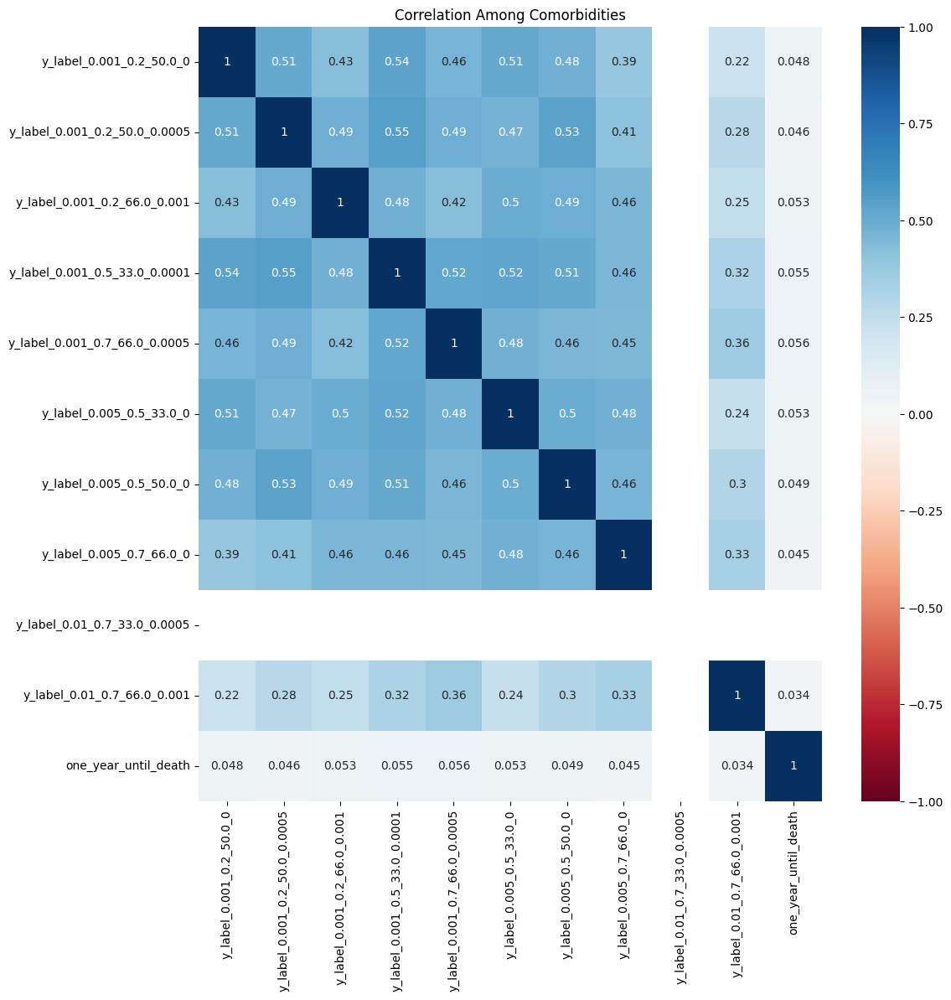

In [23]:
corr = data[[x for x in data.columns if x.startswith('y_label')] + ['one_year_until_death']].corr().round(4)
plt.figure(figsize=(12,12))
sns.heatmap(corr, cmap='RdBu', vmin=-1, vmax=1, annot=True)
plt.title('Correlation Among Comorbidities')
plt.show()


In [50]:
# Co occurences
display(pd.DataFrame((data[[x for x in data.columns if x.startswith('y_label')]].sum(axis=1)/10).value_counts().sort_index()))
display(pd.DataFrame((data[[x for x in data.columns if x.startswith('y_label')]].sum(axis=1)/10).value_counts(normalize=True).sort_index()))

,count
0.1,3797
0.2,4695
0.3,4151
0.4,3870
0.5,3848
0.6,3886
0.7,4091
0.8,4731
0.9,6693
1.0,13496


,proportion
0.1,0.071294
0.2,0.088156
0.3,0.077941
0.4,0.072665
0.5,0.072252
0.6,0.072966
0.7,0.076815
0.8,0.088832
0.9,0.125671
1.0,0.253408


### Use MissingNo

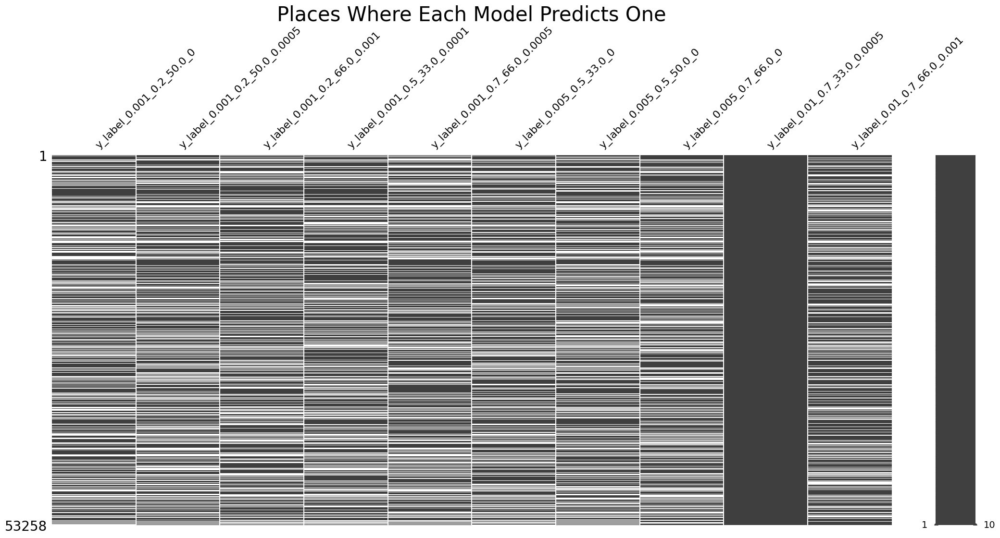

In [48]:
import missingno as msno
#msno.matrix(collisions.sample(250))
data_with_nan = data[[x for x in data.columns if x.startswith('y_label')]].copy()
data_with_nan[data_with_nan==0] = None
msno.matrix(data_with_nan)
plt.title('Places Where Each Model Predicts One',fontsize=30)
plt.show()


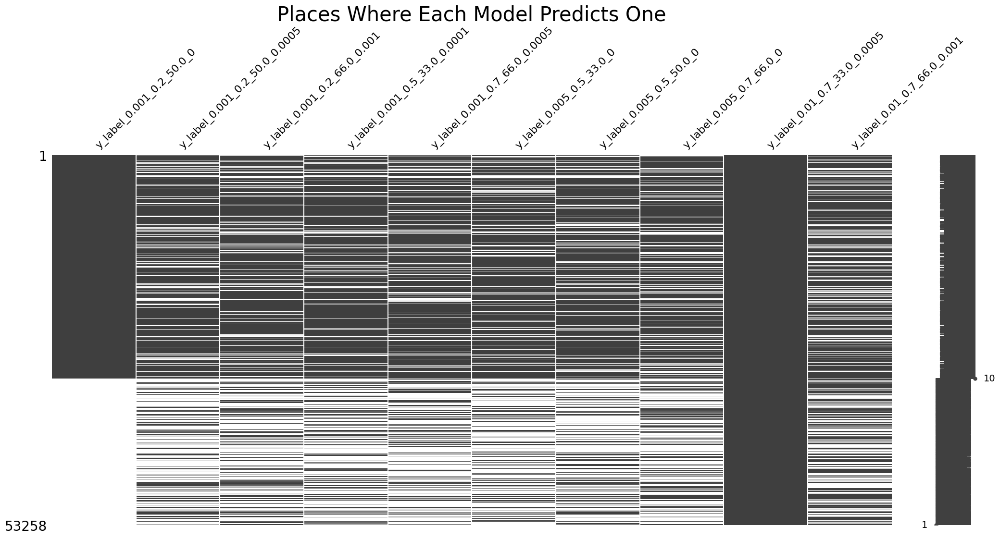

In [53]:
data_with_nan = data_with_nan.sort_values('y_label_0.001_0.2_50.0_0')
msno.matrix(data_with_nan)
plt.title('Places Where Each Model Predicts One',fontsize=30)
plt.show()


In [62]:
data_with_nan.describe()

,y_label_0.001_0.2_50.0_0,y_label_0.001_0.2_50.0_0.0005,y_label_0.001_0.2_66.0_0.001,y_label_0.001_0.5_33.0_0.0001,y_label_0.001_0.7_66.0_0.0005,y_label_0.005_0.5_33.0_0,y_label_0.005_0.5_50.0_0,y_label_0.005_0.7_66.0_0,y_label_0.01_0.7_33.0_0.0005,y_label_0.01_0.7_66.0_0.001
count,32161.0,32176.0,32173.0,32172.0,32194.0,32180.0,32154.0,32175.0,53258.0,34715.0
mean,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
25%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
50%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
75%,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [67]:
data_with_nan.shape

(53258, 10)

0 y_label_0.001_0.2_50.0_0
1 y_label_0.001_0.2_50.0_0.0005
2 y_label_0.001_0.2_66.0_0.001
3 y_label_0.001_0.5_33.0_0.0001
4 y_label_0.001_0.7_66.0_0.0005
5 y_label_0.005_0.5_33.0_0
6 y_label_0.005_0.5_50.0_0
7 y_label_0.005_0.7_66.0_0
8 y_label_0.01_0.7_33.0_0.0005
9 y_label_0.01_0.7_66.0_0.001


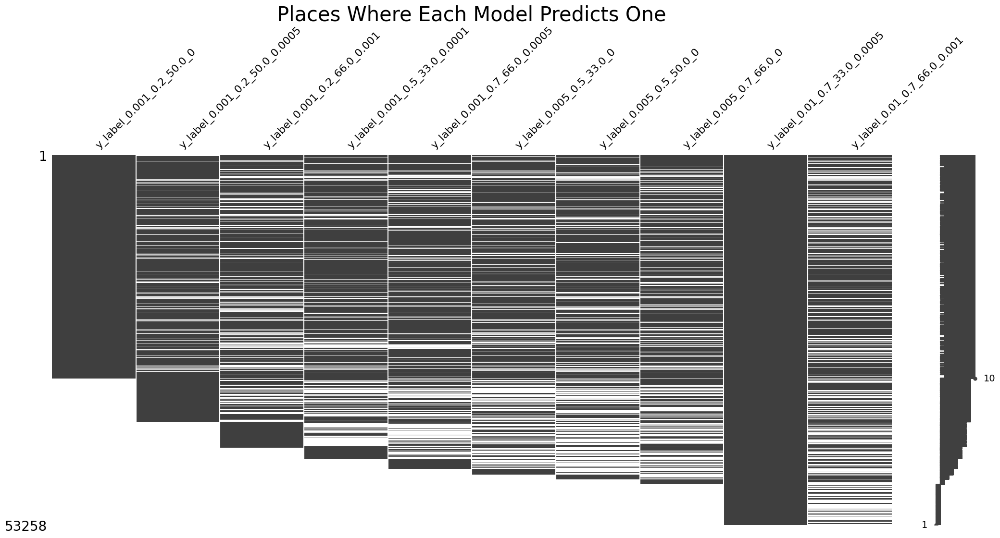

In [82]:
def predictions(data_with_nan):
    N, J = data_with_nan.shape
    N1 = 0
    pointer = 0
    cols = data_with_nan.columns
    data_with_nan_sorted = data_with_nan.iloc[:N1]
    remaining_data = data_with_nan[N1:N]
    
    while (N1 <= N):
        col = cols[pointer]
        print(pointer,col)
        N1 = int(remaining_data[col].sum())
        remaining_data = remaining_data.sort_values(col)

        data_with_nan_sorted = pd.concat([data_with_nan_sorted,
                                          remaining_data.iloc[:N1]],
                                          axis=0, ignore_index=True)
        
        # update values
        remaining_data = remaining_data.iloc[N1:].reset_index(drop=True)
        pointer += 1
        if pointer >= J:
            return data_with_nan_sorted
    return data_with_nan_sorted

msno.matrix(predictions(data_with_nan))
plt.title('Places Where Each Model Predicts One',fontsize=30)
plt.show()
